<h1 style="text-align: center;"><b>3.Prescriptive Analysis</b></h1>

In [377]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import statsmodels.api as sm
import plotly.express as px
import matplotlib.dates as mdates
import matplotlib as plot
import plotly.graph_objects as go

import warnings
warnings.simplefilter("ignore", UserWarning)

# Suppress only DeprecationWarnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [311]:
# Reading both csv
demographic_df = pd.read_csv(r"C:\Febi\NumpyNinja\Hackathon\Python_Launch Folder\Team12_Pytesters_PythonHackathon_August25\demographic_cleandata.csv")
filtered_df = pd.read_csv(r"C:\Febi\NumpyNinja\Hackathon\Python_Launch Folder\Team12_Pytesters_PythonHackathon_August25\filtered_cleandata.csv")

# Merging both csv files for clean analysis
merged_df = filtered_df.merge(demographic_df, on='patient_id', how='left')

### Q1. Find Carb Intake or Insulin Recommendations for Patients with T1D Based on Glucose to Carb Intake

---

### Reasoning

1. **Individual Variability in Carb Sensitivity**  
   Patients with T1D vary in how their glucose responds to carbohydrate intake. Some experience sharp spikes after eating, while others have more moderate rises. Factors include:
   - Insulin resistance
   - Time of day (morning vs evening sensitivity)
   - Physical activity, stress, or illness

2. **Mismatch Between Insulin Dose and Carb Load**  
   Inaccurate insulin-to-carb ratios (ICR) can result in:
   - **Post-meal hyperglycemia** (under-dosing)
   - **Hypoglycemia** (over-dosing)  
   Adjusting ICR based on real glucose response ensures better control.

3. **Tuning Bolus Timing and Amount**  
   - If glucose spikes occur **late** after meals, it could suggest a need to delay or split bolus doses.
   - If spikes are **immediate**, pre-meal insulin may need to be taken earlier or increased.

---

### Recommendations

#### For "Maintain" Patients:
- Continue current insulin-to-carb ratios.
- Reassess periodically, especially if routines or lifestyle change.

#### For "Monitor/Adjust" Patients:
- Reevaluate insulin dosing timing (e.g., pre-meal vs extended/dual-wave).
- Identify meals associated with high postprandial glucose spikes.
- Consider:
  - Tighter CGM monitoring
  - Temporary insulin adjustment
  - Guidance from a healthcare provider or diabetes educator

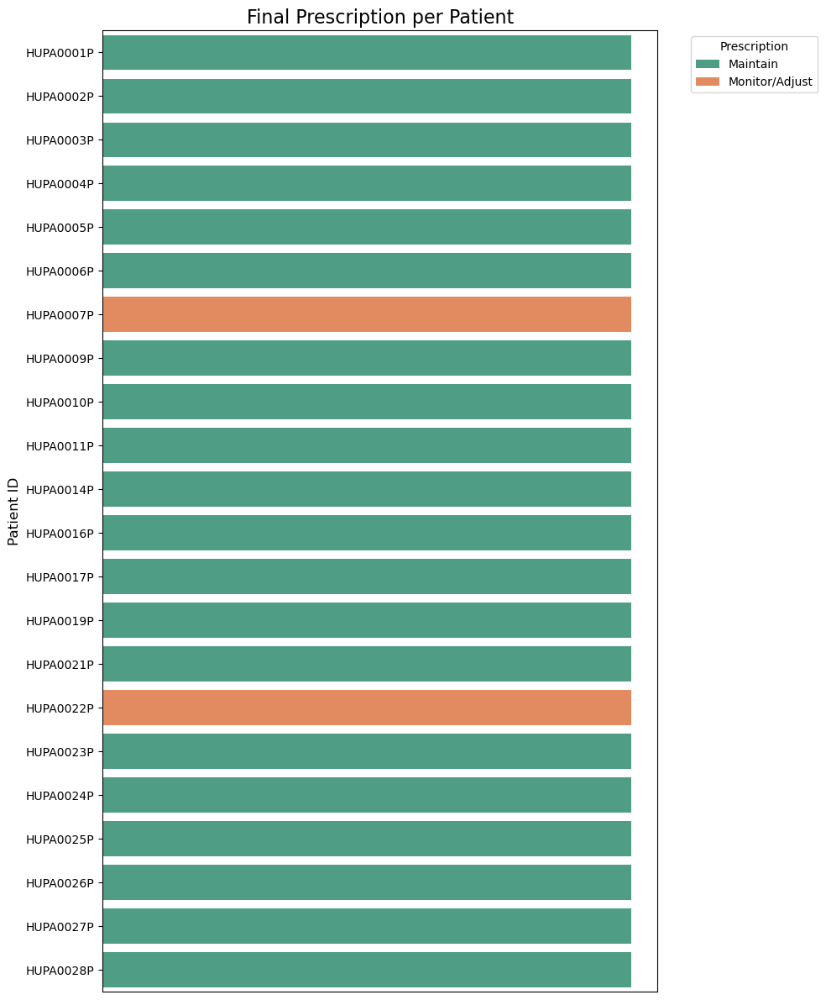

In [313]:
def insulin_optimization_recommendations(clean_df):

    # Step 1: Calculate glucose change
    merged_df['next_glucose'] = merged_df.groupby('patient_id')['glucose'].shift(-1)
    merged_df['glucose_change'] = merged_df['next_glucose'] - clean_df['glucose']

    # Step 2: Define prescription logic
    def prescribe_action(change):
        if change > 50:
            return 'Reduce Carb or Delay Insulin'
        elif change < -30:
            return 'Add Rescue Carbs'
        elif -10 <= change <= 10:
            return 'Maintain'
        else:
            return 'Monitor/Adjust'

    # Step 3: Filter relevant data and apply prescription
    carb_effect = clean_df[
        (clean_df['carb_input'] > 0) &
        (clean_df['glucose_change'].notnull())
    ].copy()

    carb_effect['prescription'] = carb_effect['glucose_change'].apply(prescribe_action)

    # Step 4: Get final prescription per patient
    final_prescription = carb_effect.groupby('patient_id')['prescription'] \
        .agg(lambda x: x.value_counts().idxmax()).reset_index()
    final_prescription.columns = ['Patient ID', 'Final Prescription']

    # Step 5: Sort by numeric part of Patient ID
    final_prescription_sorted = final_prescription.copy()
    final_prescription_sorted['Patient_Num'] = final_prescription_sorted['Patient ID'].str.extract(r'(\d+)').astype(int)
    final_prescription_sorted = final_prescription_sorted.sort_values('Patient_Num')

    # Define color palette
    palette = {
        'Reduce Carb or Delay Insulin': '#f94144',
        'Add Rescue Carbs': '#277da1',
        'Maintain': '#43aa8b',
        'Monitor/Adjust': '#f9844a'
    }

    # Step 6: Plot
    plt.figure(figsize=(10, 12))

    sns.barplot(
        data=final_prescription_sorted,
        y='Patient ID',
        x=[1]*len(final_prescription_sorted),  # Dummy x values for bars of equal length
        hue='Final Prescription',
        palette=palette,
        dodge=False
    )

    plt.title("Final Prescription per Patient", fontsize=16)
    plt.xlabel("")  # No x-label since it is dummy
    plt.ylabel("Patient ID", fontsize=12)
    plt.xticks([])  # Hide x-axis ticks
    plt.legend(title="Prescription", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    return final_prescription
    
prescription_summary = insulin_optimization_recommendations(clean_df)


### Q2. Does High Heart Rate Variability (HRV) Correlate with Unstable Glucose Levels in Patients with Type 1 Diabetes?

#### **Key Reasoning Points**

- **Biological Rationale**
  - HRV reflects autonomic nervous system (ANS) balance.  
  - Reduced HRV often signals autonomic dysfunction, which is common in long-standing Type 1 Diabetes and linked to poor glycemic control.  
  - Sudden HRV changes may precede glucose excursions (especially hypoglycemia).  
- **HRV Interpretation**
  - High HRV is generally considered a marker of good autonomic balance and adaptability.  
  - Low HRV (or high average heart rate) can indicate stress, poor recovery, or cardiovascular strain.  
- **Relevance to Diabetes**
  - In Type 1 Diabetes, stress and autonomic dysfunction can impair glucose regulation, leading to more variability (frequent spikes and drops).  

---

#### **Key Observations from Data**

- **Positive trend visible:**  
  Patients with higher HRV (Heart Rate SD ~15–18) tend to show moderate to high glucose variability (Glucose SD ~65–80).  

- **Wide glucose spread at mid HRV:**  
  For HRV between 12–15, glucose variability ranges widely (~35–80).  
  *This suggests that HRV alone may not fully explain glucose swings; other factors could influence variability.*  

- **Low HRV cluster:**  
  Some patients with lower HRV (~10–12) show both low (~40) and high (~80) glucose SD, indicating mixed behavior.  

- **Patient heterogeneity:**  
  Each point represents a unique patient ID, showing substantial inter-patient variation. Some maintain low glucose variability even with moderate HRV.  

---

#### **Possible Interpretations**

- HRV could be a **contributing factor** to glycemic instability but is **not the sole predictor**.  
- Additional variables (insulin dose, physical activity, stress, sleep, meal timing) might explain outliers and variability spread.  
- Certain patients (upper-left and lower-right regions of the plot) may require **personalized analysis** and targeted interventions.  
 


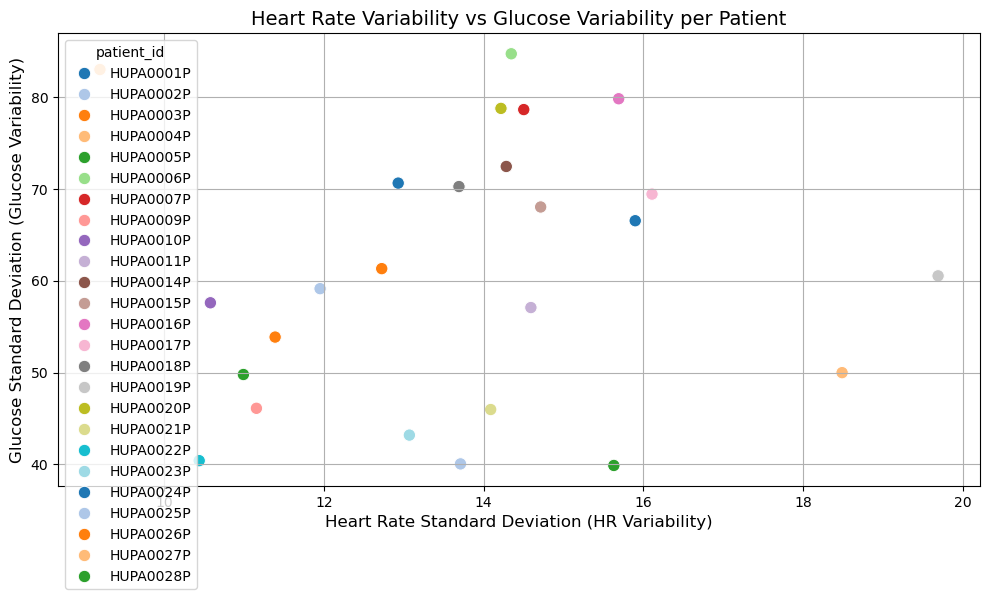

In [315]:

# Step 1: Calculate heart rate and glucose variability per patient
variability_df = merged_df.groupby('patient_id').agg({
    'heart_rate': ['mean', 'std'],
    'glucose': ['mean', 'std']
}).reset_index()

# Rename columns
variability_df.columns = ['patient_id', 'mean_hr', 'std_hr', 'mean_glucose', 'std_glucose']

# Step 2: Scatter plot: Heart Rate Variability vs Glucose Variability
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=variability_df,
    x='std_hr', 
    y='std_glucose', 
    hue='patient_id',
    palette='tab20', 
    s=80
)

plt.title('Heart Rate Variability vs Glucose Variability per Patient', fontsize=14)
plt.xlabel('Heart Rate Standard Deviation (HR Variability)', fontsize=12)
plt.ylabel('Glucose Standard Deviation (Glucose Variability)', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


### Q3. Which patients exhibit the highest combined HR + Glucose variability

#### Goal
Identify patients with the **largest combined autonomic (HR) and glycemic (glucose) instability**, triage them, and recommend prioritized clinical actions to reduce risk (hypoglycemia, cardiovascular stress, poor glycemic control).

---

#### Biological & clinical rationale
- **Combined instability matters:** High glucose variability is linked to complications and symptomatic events; large HR variability or dysregulated HR responses may reflect autonomic dysfunction or stress that worsens glycemic control.  
- **Synergy:** Patients with both high HR and high glucose variability are more likely to have unpredictable glucose excursions and may not reliably perceive hypoglycemia.  
- **Actionable signal:** Identifying these patients lets clinicians target monitoring, education, and therapy adjustments where benefit is largest.

---

#### Key Insights: Top Patients by Combined Variability

#### High-Variability Patients Identified

- **Patients:** `HUPA0016P`, `HUPA0006P`, `HUPA0019P`, `HUPA0007P`, and `HUPA0020P`
- These patients exhibit the **highest combined variability** in both **glucose levels** and **insulin (bolus) usage**.
- High variability suggests poor glycemic stability and reactive insulin management patterns.

---

#### Why High Variability Matters

- **Increased Risk of Complications**  
  Large glucose swings can lead to both **hypoglycemia and hyperglycemia**, increasing short- and long-term health risks.

- **Challenging Insulin Titration**  
  Unpredictable patterns make it harder to adjust insulin ratios effectively, possibly leading to overcorrection.

- **Higher Patient Burden**  
  More frequent alarms, corrections, and stress can cause **diabetes burnout**, lowering adherence to therapy.

---

#### Recommendations

- **Personalized Monitoring Plans**  
  Implement tighter CGM review and **pattern detection tools** for these patients.

- **Diet & Insulin Counseling**  
  Reinforce consistency in carb intake and **optimize insulin-to-carb ratios**, especially at times of peak variability.

- **Behavioral Support**  
  Address sleep, stress, or exercise timing that may impact glycemic patterns.

- **Potential Tech Support**  
  Evaluate suitability for **automated insulin delivery systems** or advanced alerts for glucose swings.


Top patients by glucose variability:
    patient_id  std_glucose     std_hr
5   HUPA0006P    84.736079  14.345993
3   HUPA0004P    83.020747   9.194763
12  HUPA0016P    79.837161  15.691055
16  HUPA0020P    78.785656  14.216763
6   HUPA0007P    78.656646  14.502348 

Top patients by heart rate variability:
    patient_id  std_glucose     std_hr
15  HUPA0019P    60.540291  19.691270
23  HUPA0027P    49.993380  18.489156
13  HUPA0017P    69.448527  16.108569
20  HUPA0024P    66.546138  15.898343
12  HUPA0016P    79.837161  15.691055 

Top patients by combined variability:
    patient_id  std_glucose     std_hr  combined_var
12  HUPA0016P    79.837161  15.691055      1.739040
5   HUPA0006P    84.736079  14.345993      1.728546
15  HUPA0019P    60.540291  19.691270      1.714457
6   HUPA0007P    78.656646  14.502348      1.664741
16  HUPA0020P    78.785656  14.216763      1.651760 



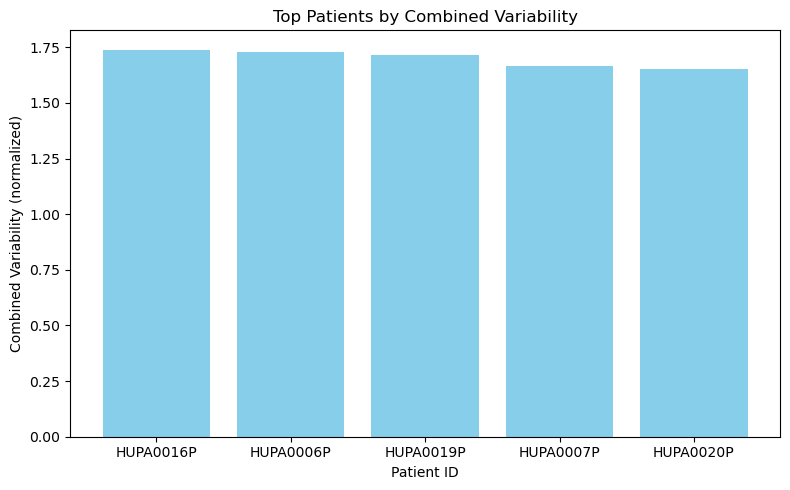

In [317]:
# Step 1: Calculate glucose and heart rate variability (standard deviation) for each patient
variability_df = merged_df.groupby('patient_id').agg({
    'glucose': 'std',
    'heart_rate': 'std'
}).reset_index().rename(columns={
    'glucose': 'std_glucose',
    'heart_rate': 'std_hr'
})

# Step 2: Top 5 patients by individual variability
most_glucose_var = variability_df.sort_values('std_glucose', ascending=False).head(5)
most_hr_var = variability_df.sort_values('std_hr', ascending=False).head(5)

# Step 3: Calculate combined normalized variability
variability_df['combined_var'] = (
    (variability_df['std_glucose'] / variability_df['std_glucose'].max()) +
    (variability_df['std_hr'] / variability_df['std_hr'].max())
)

# Step 4: Top 5 patients by combined variability
most_combined_var = variability_df.sort_values('combined_var', ascending=False).head(5)

# Step 5: Print results
print("Top patients by glucose variability:\n", most_glucose_var, "\n")
print("Top patients by heart rate variability:\n", most_hr_var, "\n")
print("Top patients by combined variability:\n", most_combined_var, "\n")

# Step 6: Plot combined variability for top patients
plt.figure(figsize=(8, 5))
plt.bar(most_combined_var['patient_id'].astype(str), most_combined_var['combined_var'], color='skyblue')
plt.title('Top Patients by Combined Variability')
plt.xlabel('Patient ID')
plt.ylabel('Combined Variability (normalized)')
plt.tight_layout()
plt.show()


### Q4. Are Sleep Disturbances Linked to Morning Hyperglycemia?

---

### Reasoning:
- Sleep disturbances elevate **cortisol**, a stress hormone that increases blood glucose levels, especially in the early morning hours (known as the **dawn phenomenon**).
- Interrupted sleep reduces **insulin sensitivity**, impairing the body's ability to manage overnight glucose levels.
- Poor sleep quality activates the **sympathetic nervous system**, triggering hepatic glucose release and raising fasting glucose levels.

---

### Key Insights from Chart:

- **Higher Glucose with High Disturbance:**
  - Patients with **high sleep disturbance** show the **highest median glucose levels**, suggesting poor glycemic control overnight.

- **Greater Glucose Variability:**
  - The **interquartile range (IQR)** and spread are widest for the high disturbance group, indicating increased risk for **glucose fluctuations**.

- **More Extreme Glucose Readings:**
  - **Outliers** are more prevalent and higher in the high disturbance group, pointing toward episodes of **morning hyperglycemia**.

- **Better Control in Low Disturbance Group:**
  - The **lowest median** and **tightest glucose range** are seen in the **low disturbance group**, supporting the role of quality sleep in stable glucose regulation.

---

### Prescription:
- Screen and treat for **sleep apnea** or other sleep disorders.
- Educate patients on **sleep hygiene**: consistent bedtime, reduced screen time, avoiding late meals or stimulants.
- Monitor glucose patterns closely in patients reporting poor sleep to adjust basal insulin or overnight strategies.


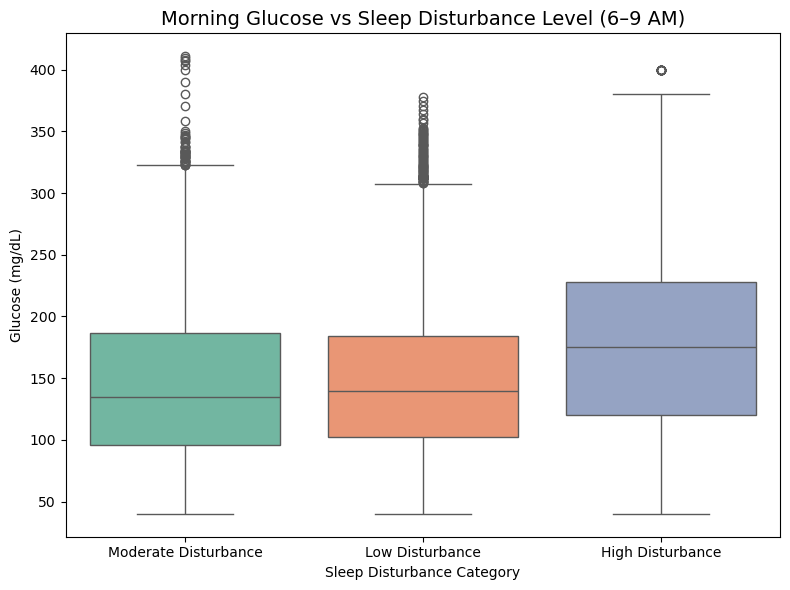

In [319]:

# Ensure 'time' column is datetime
merged_df['time'] = pd.to_datetime(merged_df['time'])

# Step 1: Filter for morning readings (6 AM - 9 AM)
morning_df = merged_df[merged_df['time'].dt.hour.between(6, 9)].copy()

# Step 2: Create sleep disturbance category
def categorize_disturbance(val):
    if val >= 70:
        return 'High Disturbance'
    elif val >= 40:
        return 'Moderate Disturbance'
    else:
        return 'Low Disturbance'


morning_df.loc[:, 'SleepDisturbanceLevel'] = morning_df['sleep_disturbance_percent'].apply(categorize_disturbance)


# Step 3: Plot morning glucose by sleep disturbance category
plt.figure(figsize=(8, 6))
sns.boxplot(data=morning_df, x='SleepDisturbanceLevel', y='glucose', hue='SleepDisturbanceLevel', palette='Set2',legend=False)
plt.title('Morning Glucose vs Sleep Disturbance Level (6–9 AM)', fontsize=14)
plt.xlabel('Sleep Disturbance Category')
plt.ylabel('Glucose (mg/dL)')
plt.tight_layout()
plt.show()


### Q5. Are teens more unstable in glucose than adults?

### Reasoning:

- **Hormonal changes during adolescence** (e.g., growth hormone, sex hormones) can cause insulin resistance, leading to wider glucose fluctuations.
- **Irregular routines** in teens — such as inconsistent meals, sleep patterns, and activity levels — destabilize blood sugar control.
- **Emotional and psychological stress** during adolescence may affect adherence to diabetes management, contributing to glucose variability.

---

### Interpretation:
Adults may face more lifestyle-related glucose fluctuations (e.g., irregular meals, activity, or stress), while seniors may benefit from more consistent routines or conservative insulin dosing.

---

### Prescription:
Focus on **behavioral interventions** for teens and adults (e.g., consistent mealtimes, sleep hygiene, stress management) to help stabilize glucose levels.


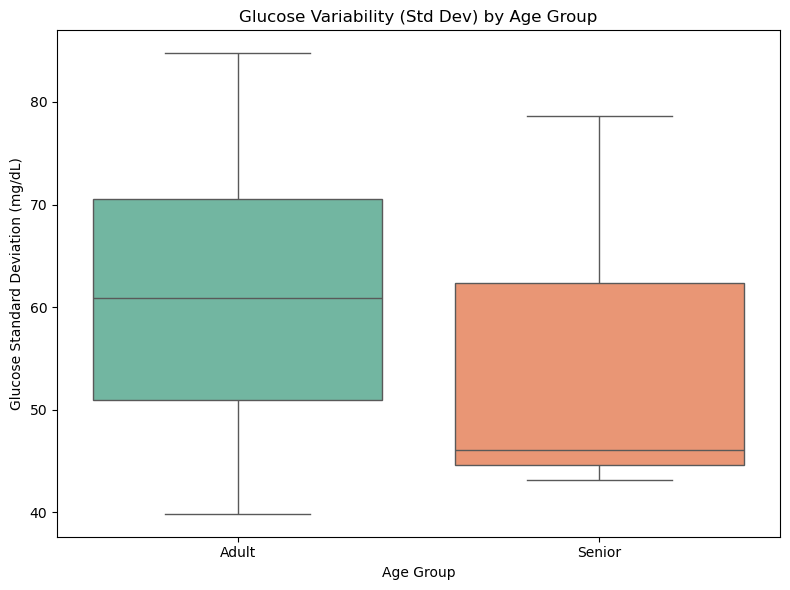

In [321]:
# Step 1: Define Age Groups
def categorize_age(age):
    if age < 20:
        return 'Teen'
    elif age < 65:
        return 'Adult'
    else:
        return 'Senior'

# Apply age group to merged_df
merged_df['AgeGroup'] = merged_df['age'].apply(categorize_age)

# Step 2: Calculate glucose standard deviation per patient
glucose_std_per_patient = merged_df.groupby(['patient_id', 'AgeGroup'])['glucose'].std().reset_index()
glucose_std_per_patient.columns = ['patient_id', 'AgeGroup', 'glucose_std']

# Plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=glucose_std_per_patient, x='AgeGroup', y='glucose_std', palette='Set2', hue='AgeGroup')
plt.title('Glucose Variability (Std Dev) by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Glucose Standard Deviation (mg/dL)')
plt.tight_layout()
plt.show()

### Q6. Are male and female patients responding differently to carbs?

#### 1. Glucose Response Variability:
- **Male patients** show greater variability in glucose change, with a wider spread and more outliers.
- **Female patients** exhibit more stable and consistent glucose responses to carbohydrate intake.

#### 2. Outliers:
- **Males** have many high and low outliers, indicating extreme glucose responses to carbs.
- **Females** show fewer outliers, suggesting better or more predictable glucose control post-carb intake.

---

### Prescription:
Consider **adjusting insulin dosing strategies** for male patients or enhancing **carb-counting education** to reduce post-carb glucose spikes and improve glycemic outcomes.


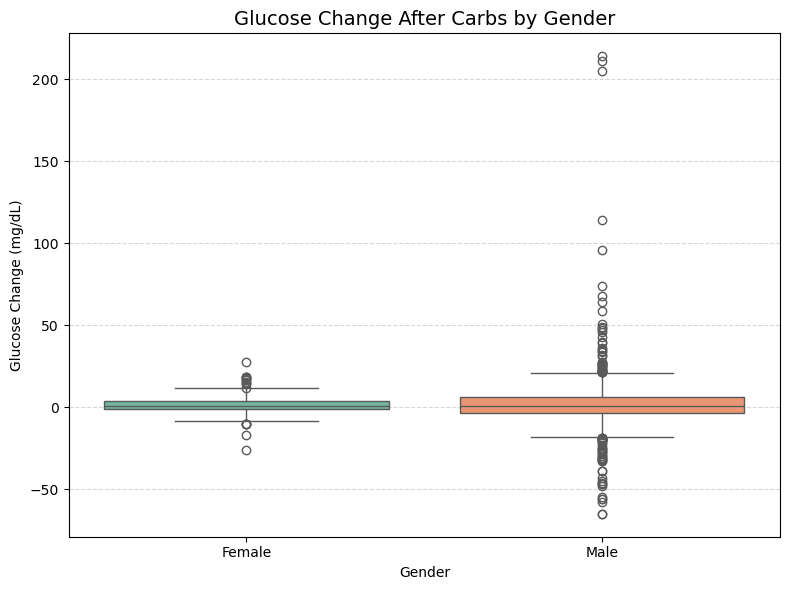

In [323]:
# Step 1: Calculate glucose change
merged_df['next_glucose'] = merged_df.groupby('patient_id')['glucose'].shift(-1)
merged_df['glucose_change'] = merged_df['next_glucose'] - merged_df['glucose']

# Step 2: Filter for records with carb input > 0
carb_df = merged_df[(merged_df['carb_input'] > 0) & (merged_df['glucose_change'].notnull())]

# Step 3: Plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=carb_df, x='gender', y='glucose_change', hue='gender', palette='Set2')

plt.title('Glucose Change After Carbs by Gender', fontsize=14)
plt.xlabel('Gender')
plt.ylabel('Glucose Change (mg/dL)')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


### Q7. Are older age groups administering less insulin (bolus volume) on average compared to younger groups?

#### Reasoning:

1. **Physiological Differences with Age:**
   - Insulin sensitivity often increases with age due to reduced muscle mass and slower digestion (delayed gastric emptying).
   - Older adults may require lower bolus insulin doses for the same carb intake.
   - Younger adults or teens may require higher doses due to higher insulin resistance or larger meal sizes.

2. **Risk of Hypoglycemia in Seniors:**
   - Older adults are at higher risk of severe hypoglycemia due to:
     - Slower recognition of symptoms.
     - Coexisting medications or health conditions.
   - This may lead to more conservative insulin dosing.

3. **Younger Patients Have More Variable Lifestyles:**
   - Teens and young adults often exhibit:
     - Irregular eating patterns
     - Varying physical activity levels
     - Hormonal fluctuations (e.g., puberty, menstruation)
   - These factors contribute to more aggressive or reactive insulin dosing.

---

#### Findings:

- The plot shows average bolus volume with confidence intervals across age groups.
- **Older age groups (50+)** appear to have **similar or slightly lower average bolus volumes**, with overlapping confidence intervals.
- This suggests potential under-dosing or cautious insulin use in older populations, possibly due to:
  - Fear of hypoglycemia,
  - Increased insulin sensitivity,
  - Or differences in management goals.

---



               mean       std    count
age_group                             
18–29      0.010337  0.132808  12076.0
30–39      0.075771  0.815638  21705.0
40–49      0.054852  0.479135  18591.0
50–59      0.059361  0.683289  11051.0
60–69      0.043946  0.489826  23197.0
70–79      0.038785  0.393316   3919.0


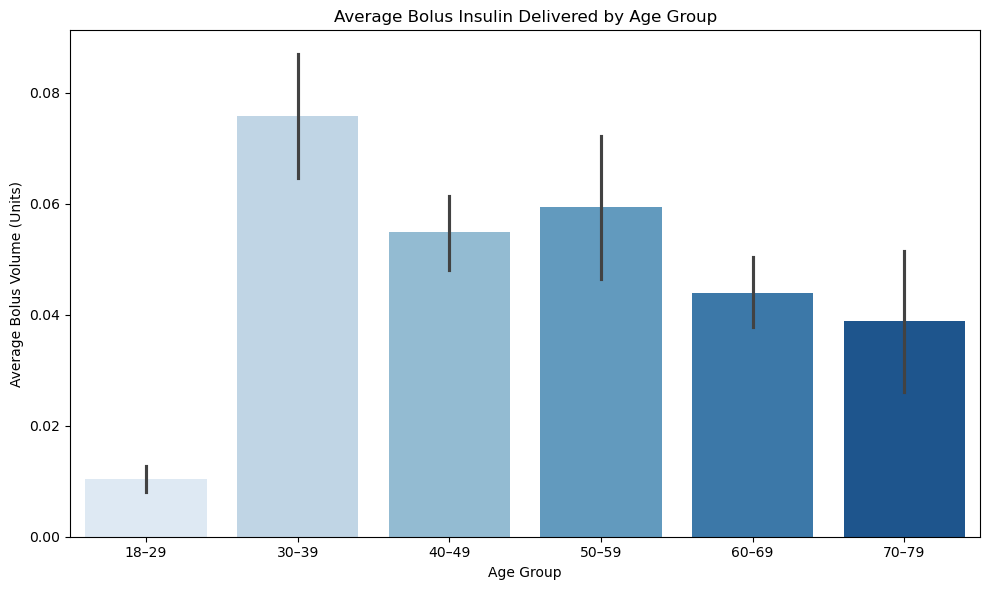

In [325]:
# Step 1: Create age bins
age_bins = [18, 30, 40, 50, 60, 70, 80]
age_labels = ['18–29', '30–39', '40–49', '50–59', '60–69', '70–79']
merged_df['age_group'] = pd.cut(merged_df['age'], bins=age_bins, labels=age_labels)

# Step 2: Group by age group and summarize insulin use
insulin_summary = merged_df.groupby('age_group',observed=True)['bolus_volume_delivered'].describe()

print(insulin_summary[['mean', 'std', 'count']])

# Step 3: Plot average bolus insulin by age group
plt.figure(figsize=(10, 6))
sns.barplot(data=merged_df, x='age_group', y='bolus_volume_delivered', hue='age_group', palette='Blues')

plt.title("Average Bolus Insulin Delivered by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Average Bolus Volume (Units)")
plt.tight_layout()
plt.show()


### Q8. Is poor sleep quality associated with high glucose variability?

#### Reasoning:

**Physiological Impact of Sleep on Glucose Regulation:**

- Poor sleep (short duration, fragmentation, or low quality) increases:
  - **Cortisol and other stress hormones** → causes insulin resistance.
  - **Sympathetic nervous system activity** → affects glucose metabolism.

- This hormonal imbalance results in greater glucose variability, especially:
  - **Morning spikes** (dawn phenomenon).
  - **Overnight fluctuations**.

---

#### Key Observations:

- **Median Glucose Levels:**
  - Both groups have a similar median glucose (around 140–150 mg/dL), suggesting average control is comparable.

- **Variability / Spread:**
  - The interquartile range (IQR) is slightly wider for the **≤6 hr sleep group**.
  - More extreme outliers (both high and low) are present in this group.

- **Hyperglycemia Risk:**
  - Patients sleeping ≤6 hours show **more upper outliers**, with some readings >400 mg/dL.

- **Hypoglycemia Risk:**
  - Both groups have a lower whisker around ~40 mg/dL.
  - Slightly greater **skewness toward extremes** in the short sleep group indicates higher glucose instability.

---

#### Interpretation:

- No dramatic shift in **average glucose**, but:
- **Greater glucose variability** (highs and lows) is observed in the group sleeping ≤6 hrs.
- This aligns with biological evidence: **sleep deprivation elevates cortisol**, increases **insulin resistance**, and disrupts **hormonal regulation**.

---

#### Recommendations (Prescriptive Analytics):

| Area | Recommendation | Rationale |
|------|----------------|-----------|
| Sleep Hygiene | Encourage ≥7 hours of sleep/night | Reduces variability by stabilizing hormonal regulation (cortisol, insulin) |
| Monitoring | Prioritize CGM alerts for short sleepers | Greater risk of hyperglycemia & variability overnight |
| Personalized Insulin Adjustment | Review basal/bolus plans for patients with poor sleep | May need temporary overnight adjustments to prevent glucose excursions |
| Behavioral Interventions | Educate patients on the impact of sleep on glucose | Many are unaware that inadequate sleep worsens diabetes control |
| Data-driven Alerts | Flag consistent <6 hr sleepers with high variability | Helps clinicians intervene proactively with lifestyle or dosing changes |



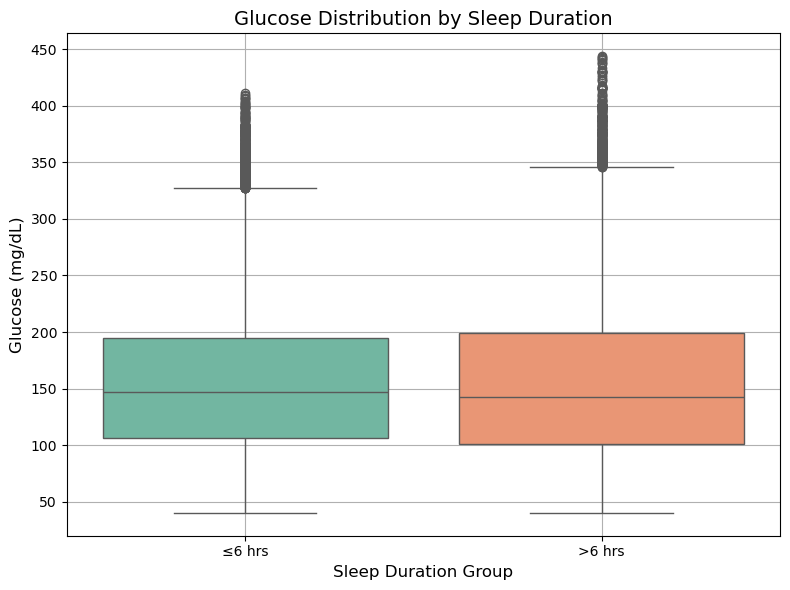

In [327]:
# Create sleep group column
merged_df['sleep_duration_group'] = merged_df['sleep_duration'].apply(lambda x: '>6 hrs' if x > 6 else '≤6 hrs')

# Plot: Boxplot of glucose by sleep duration group
plt.figure(figsize=(8, 6))
sns.boxplot(data=merged_df, x='sleep_duration_group', y='glucose', hue='sleep_duration_group', palette='Set2')

plt.title('Glucose Distribution by Sleep Duration', fontsize=14)
plt.xlabel('Sleep Duration Group', fontsize=12)
plt.ylabel('Glucose (mg/dL)', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

### Q9. Is post-exercise hypoglycemia common?

#### Reasoning:

**1. Increased Insulin Sensitivity Post-Exercise**  
- Physical activity increases glucose uptake by muscles for hours.  
- This leads to lower circulating glucose even if no additional insulin is administered.  
- If insulin levels remain high, it can cause delayed-onset hypoglycemia.

**2. Depleted Glycogen Stores**  
- After moderate-to-intense activity, the liver and muscles are glycogen-depleted.  
- Without proper carbohydrate intake, glucose reserves aren’t enough to maintain blood sugar—especially overnight.

**3. Blunted Counter-Regulatory Hormones**  
- People with T1D often have reduced glucagon and epinephrine responses during/after exercise.  
- This impairs their ability to recover from low glucose episodes.

---

#### Evidence from Studies:

- Studies show that **late-onset hypoglycemia** is especially common during sleep after **afternoon or evening exercise**.  
- The risk increases if:
  - Bolus insulin is not reduced before exercise.  
  - No carbs are consumed during or after the session.  
  - Activity is **aerobic** or **prolonged** (e.g., running, cycling, walking >30 minutes).

---

#### Recommendations:

A **proactive insulin and nutrition strategy** is essential to minimize hypoglycemia risk without discouraging beneficial physical activity.
- Consider reducing bolus insulin before exercise.
- Add pre- or post-exercise carbohydrate intake.
- Monitor glucose more frequently after activity, especially before bed.
- Educate patients about the **delayed hypoglycemia window** (up to 12 hrs post-exercise).


Overall post-exercise hypoglycemia prevalence: 6.0%


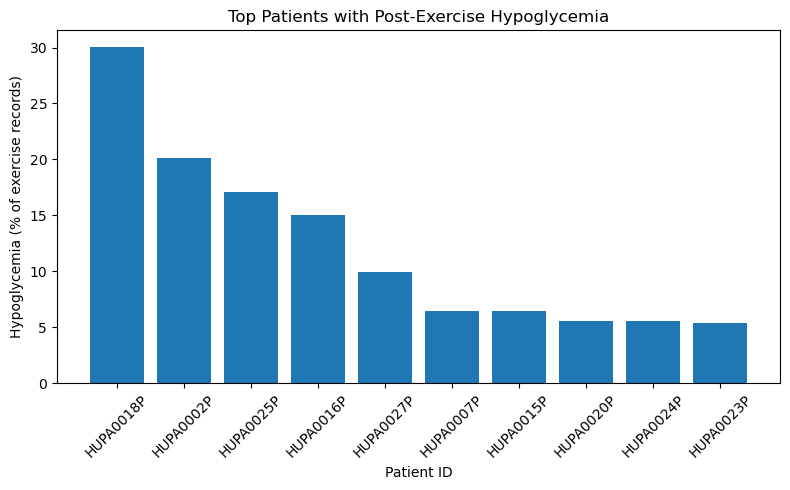

Recommendation: Post-exercise hypoglycemia is not prevalent, but monitor high-risk individuals.


In [329]:
def analyze_post_exercise_hypoglycemia(df):
   
    # Filter for exercise (adjust threshold if needed)
    exercise_df = merged_df[merged_df['steps'] > 100].copy()

    # Define hypoglycemia
    exercise_df['hypo'] = exercise_df['glucose'] < 70

    # Group by patient to see counts or proportion
    hypo_summary = exercise_df.groupby('patient_id')['hypo'].mean().reset_index()
    hypo_summary.rename(columns={'hypo': 'percent_hypo'}, inplace=True)

    # Calculate overall prevalence
    overall_rate = hypo_summary['percent_hypo'].mean()
    print(f"Overall post-exercise hypoglycemia prevalence: {overall_rate*100:.1f}%")

    # Visualization: Bar plot showing top patients with high hypo rates
    hypo_sorted = hypo_summary.sort_values('percent_hypo', ascending=False).head(10)

    plt.figure(figsize=(8, 5))
    plt.bar(hypo_sorted['patient_id'].astype(str), hypo_sorted['percent_hypo']*100)
    plt.ylabel('Hypoglycemia (% of exercise records)')
    plt.xlabel('Patient ID')
    plt.title('Top Patients with Post-Exercise Hypoglycemia')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Prescriptive insight
    if overall_rate > 0.1:  # >10% considered frequent
        print("Recommendation: Post-exercise hypoglycemia is relatively common. "
              "Consider adjusting insulin doses or providing carb snacks around exercise.")
    else:
        print("Recommendation: Post-exercise hypoglycemia is not prevalent, but monitor high-risk individuals.")

# Example call
analyze_post_exercise_hypoglycemia(clean_df)

### Q10. Are patients experiencing nocturnal hypoglycemia?

#### Reasoning:

**1. Diminished Counter-Regulatory Response at Night**  
- During sleep, the body’s natural response (release of glucagon/epinephrine) to low glucose is less effective.  
- This blunts recovery from lows and increases risk of prolonged hypoglycemia.

**2. Unadjusted Insulin Dosing in the Evening**  
- If patients take larger or unadjusted bolus doses at dinner or have high basal insulin overnight, it can drive glucose too low while they sleep.  
- Missed post-dinner snacks or skipped meals also contribute.

**3. Post-Exercise Effects**  
- Exercise (especially in the afternoon/evening) increases insulin sensitivity for hours, heightening the risk of late-onset hypoglycemia overnight.

**4. Nocturnal Glucose Trends Are Often Overlooked**  
- Without Continuous Glucose Monitoring (CGM), patients are unaware of nighttime dips unless symptoms wake them up.

---

#### Prescription:

Patterns often arise from insulin timing, post-exercise effects, or basal misalignment.  
A combination of **insulin adjustment**, **CGM monitoring**, and **bedtime nutrition** is key to safer nights.


<Axes: title={'center': 'Nocturnal Hypoglycemia Events per Patient'}, ylabel='patient_id'>

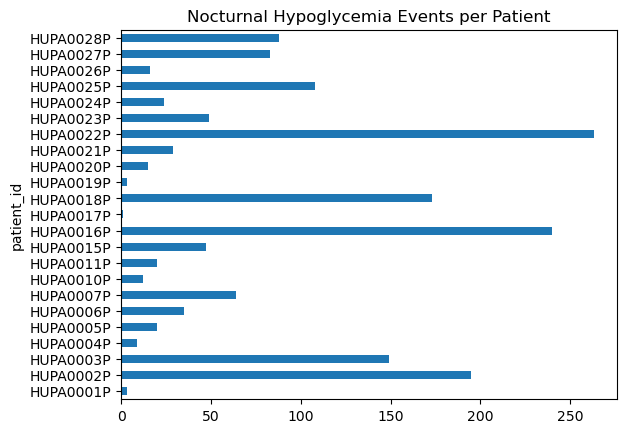

In [331]:
# Step 1: Convert 'time' column to datetime (only if not already)
filtered_df['time'] = pd.to_datetime(clean_df['time'], errors='coerce')

night_df = filtered_df[filtered_df['time'].dt.hour.between(0, 5)]
night_hypo = night_df[night_df['glucose'] < 70].groupby('patient_id').size()
night_hypo.plot(kind='barh', title='Nocturnal Hypoglycemia Events per Patient')

### Q11. Does higher carbohydrate intake require different bolus strategies by time of day?

#### Reasoning:

**1. Circadian Variation in Insulin Sensitivity**  
- The body’s insulin sensitivity fluctuates throughout the day:
  - **Morning**: Lower sensitivity (due to cortisol/dawn phenomenon)  
  - **Afternoon**: Highest insulin sensitivity  
  - **Evening/Night**: Moderate to low sensitivity  
- A standard carb-to-insulin ratio (CIR) may overdose or underdose insulin if it doesn’t account for these rhythms.

**2. Postprandial Glucose Response Varies by Time**  
- The same meal at different times of day can lead to different glucose excursions.  
- Patients may notice higher post-meal spikes in the evening, even with identical carbs and insulin.

**3. Digestive Patterns**  
- Slower gastric emptying


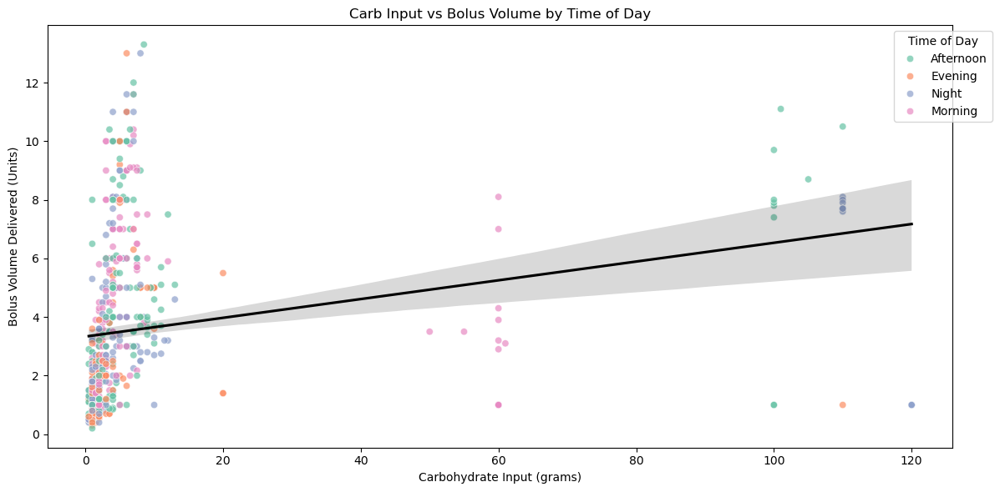

In [333]:
# Ensure time is in datetime format
merged_df['time'] = pd.to_datetime(merged_df['time'])

# Create time-of-day bins
def time_of_day(hour):
    if 5 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 17:
        return 'Afternoon'
    elif 17 <= hour < 21:
        return 'Evening'
    else:
        return 'Night'

merged_df['TimeOfDay'] = merged_df['time'].dt.hour.apply(time_of_day)

# Filter for relevant data
bolus_data = merged_df[
    (merged_df['carb_input'] > 0) & 
    (merged_df['bolus_volume_delivered'] > 0)
].copy()

# Carb intake vs Bolus, split by time of day
plt.figure(figsize=(12, 6))
sns.scatterplot(data=bolus_data, 
                x='carb_input', 
                y='bolus_volume_delivered', 
                hue='TimeOfDay', 
                alpha=0.7, 
                palette='Set2')

sns.regplot(data=bolus_data, 
            x='carb_input', 
            y='bolus_volume_delivered', 
            scatter=False, 
            color='black', 
            line_kws={'label': 'Overall Trend'})

plt.title('Carb Input vs Bolus Volume by Time of Day')
plt.xlabel('Carbohydrate Input (grams)')
plt.ylabel('Bolus Volume Delivered (Units)')
plt.legend(title='Time of Day', bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()


### Q12. Which patients show highest overall variability?

#### Reasoning:

- High glucose variability increases the risk of both hypoglycemia and hyperglycemia, making glycemic control unpredictable.
- Frequent glucose swings strain the body and complicate insulin dosing, leading to more treatment errors.
- Poor glycemic predictability makes insulin titration less accurate, requiring frequent manual corrections.
- Patients with high variability face more alarms, discomfort, and stress, which can reduce quality of life.
- This burden often leads to treatment fatigue and lower adherence, compromising long-term diabetes management.

---

#### Clinical Flags:

- **CV > 36%** → Considered high variability  
- **SD > 50 mg/dL** → Needs evaluation

---
#### Key insights:

Patients with High SD and High CV:
These are the most unstable overall — flagged by both charts:

- HUPA0016P
- HUPA0006P
- HUPA0002P 
#### Recommendations:

- Patients at the top of each bar chart have the most unstable glucose.
- **High CV (>36%)** → Suggests need for insulin adjustment or lifestyle intervention.
- **High SD** → Indicates large swings, even if mean glucose is okay.


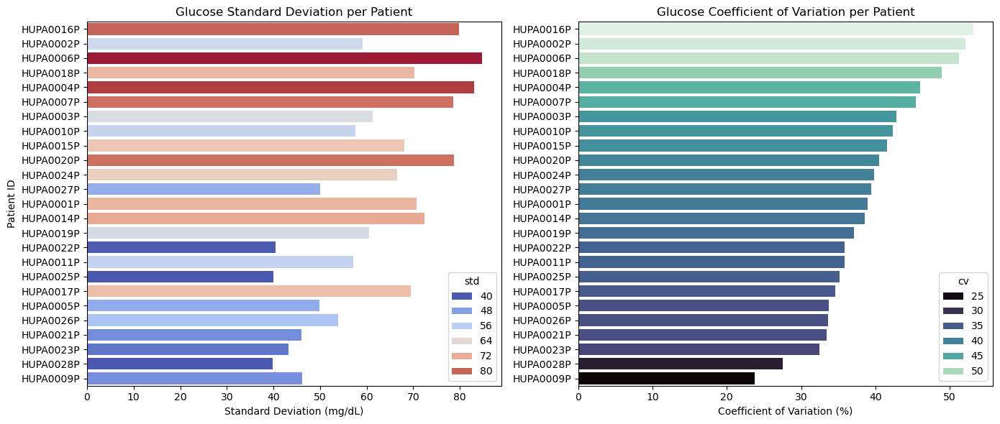

In [335]:
# Step 1: Calculate variability per patient
variability_df = merged_df.groupby('patient_id')['glucose'].agg(['mean', 'std']).reset_index()
variability_df['cv'] = (variability_df['std'] / variability_df['mean']) * 100

# Step 2: Sort by CV or SD
variability_df = variability_df.sort_values(by='cv', ascending=False)

# Step 3: Plot standard deviation and CV side-by-side
plt.figure(figsize=(14, 6))

# Subplot 1: Standard Deviation
plt.subplot(1, 2, 1)
sns.barplot(data=variability_df, x='std', y='patient_id', hue ='std', palette='coolwarm')
plt.title('Glucose Standard Deviation per Patient')
plt.xlabel('Standard Deviation (mg/dL)')
plt.ylabel('Patient ID')

# Subplot 2: Coefficient of Variation
plt.subplot(1, 2, 2)
sns.barplot(data=variability_df, x='cv', y='patient_id', hue ='cv', palette='mako')
plt.title('Glucose Coefficient of Variation per Patient')
plt.xlabel('Coefficient of Variation (%)')
plt.ylabel('')

plt.tight_layout()
plt.show()


### Q13. What time periods pose the highest risk for hyperglycemia or hypoglycemia, and which patient shows the largest glucose spike?

#### 1. Why Analyze Time Windows for Hyper/Hypoglycemia Risk?  
#### Reasoning:

<h5>

Glucose varies predictably by time of day due to factors like circadian rhythm, hormonal cycles (e.g., cortisol surge in the morning), and meal/insulin timing. Identifying risk-prone hours helps in personalizing intervention.

Targeted interventions:  
- If hypoglycemia frequently occurs between 2–4 AM (nocturnal hypoglycemia), this could prompt insulin dose adjustment or bedtime snack strategies.

Resource optimization:  
- Time-based alerts (via CGMs or apps) can reduce complications by preemptively warning patients during high-risk periods like early morning (dawn phenomenon) or post-meal spikes.

</h5>

#### 2. Why Identify Patient with Highest Glucose Spike?  
#### Reasoning:

<h5>

Extreme variability = high risk:  
- A patient with the widest glucose range may have poor carb-insulin matching, erratic lifestyle, or unrecognized comorbidities. This person is at higher risk for both hypo- and hyperglycemia.

Personalized intervention:  
- Identifying this outlier supports one-on-one coaching, such as insulin titration, dietary adjustment, or behavioral counseling.

Monitoring priorities:  
- It helps prioritize who needs closer follow-up, more frequent glucose checks, or device calibration.

</h5>

### Key Insights from Hourly Glucose Trends per Patient

1. **Significant Inter-Patient Variability**  
   - Most patients show glucose levels fluctuating between approximately 120 to 200 mg/dL throughout the day.  
   - Some patients have more stable glucose patterns, while others experience wider fluctuations.

2. **Distinct Outlier with Highest Spikes**  
   - Patient **HUPA0014P (Male, 50-59)** stands out with the highest glucose spikes, reaching peaks around 260-270 mg/dL in the late morning.  
   - This indicates potential issues with glucose control requiring targeted intervention.

3. **Timing of Peak Glucose Levels**  
   - Glucose levels generally rise in the morning after waking and breakfast.  
   - The most significant spikes occur between 8 AM and 12 PM, suggesting this is a critical period for glucose management.

4. **Potential Risk Periods**  
   - Morning to midday is a high-risk window for hyperglycemia for many patients.  
   - This highlights the need to review insulin dosing, carbohydrate intake, and lifestyle factors during this timeframe.

5. **Individualized Patterns Over Demographics**  
   - There is no clear dominant pattern by age or gender across all patients.  
   - Individual variability is high, underscoring the importance of personalized treatment plans.

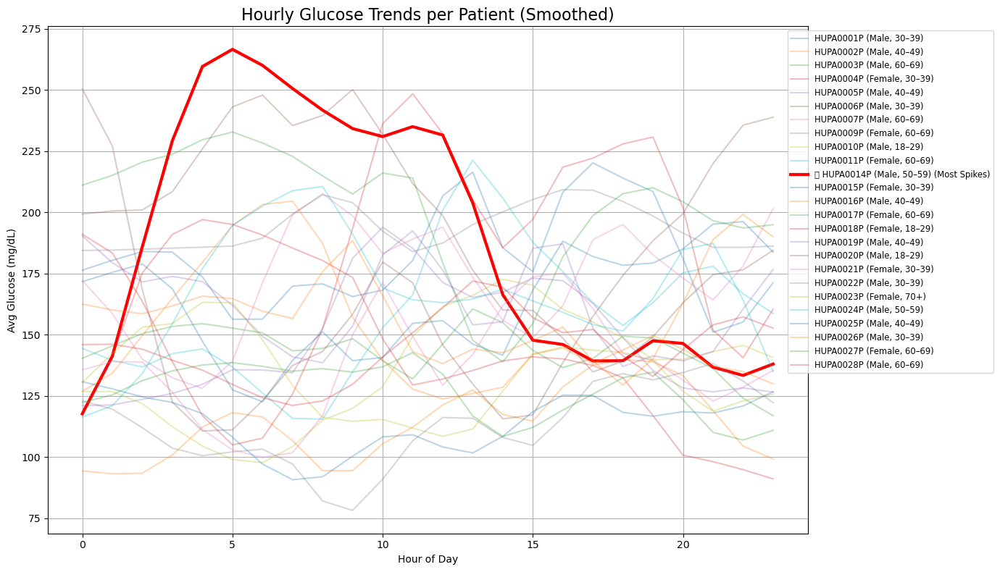

In [337]:
# Ensure datetime format and extract hour
merged_df['time'] = pd.to_datetime(merged_df['time'])
merged_df['hour'] = merged_df['time'].dt.hour

# Categorize age groups
def categorize_age(age):
    if age < 30:
        return '18–29'
    elif age < 40:
        return '30–39'
    elif age < 50:
        return '40–49'
    elif age < 60:
        return '50–59'
    elif age < 70:
        return '60–69'
    else:
        return '70+'

merged_df['age_group'] = merged_df['age'].apply(categorize_age)

# Calculate hourly average glucose
hourly_glucose = merged_df.groupby(['patient_id', 'hour', 'age_group', 'gender'])['glucose'].mean().reset_index()

# Smooth using rolling mean
hourly_glucose['glucose_smooth'] = hourly_glucose.groupby('patient_id')['glucose'].transform(lambda x: x.rolling(window=2, min_periods=1).mean())

# Identify patient with highest glucose spike (range of smoothed glucose)
spike_ranges = hourly_glucose.groupby('patient_id')['glucose_smooth'].agg(lambda x: x.max() - x.min())
highlight_patient = spike_ranges.idxmax()

# Plot
plt.figure(figsize=(14, 8))
unique_patients = hourly_glucose['patient_id'].unique()

for pid in unique_patients:
    subset = hourly_glucose[hourly_glucose['patient_id'] == pid]
    label = f"{pid} ({subset['gender'].iloc[0]}, {subset['age_group'].iloc[0]})"

    if pid == highlight_patient:
        plt.plot(subset['hour'], subset['glucose_smooth'], label=f"🔴 {label} (Most Spikes)", linewidth=3, color='red')
    else:
        plt.plot(subset['hour'], subset['glucose_smooth'], label=label, alpha=0.3)

plt.title('Hourly Glucose Trends per Patient (Smoothed)', fontsize=16)
plt.xlabel('Hour of Day')
plt.ylabel('Avg Glucose (mg/dL)')
plt.grid(True)
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1), fontsize='small')
plt.tight_layout()
plt.show()


### Q14. How much should patients increase their daily steps to reduce insulin needs?

**Reasoning:**  
Physical activity, especially in the form of walking (measured via daily step count), plays a crucial role in glucose metabolism and insulin sensitivity for people with Type 1 Diabetes (T1D). Here's why increasing daily steps can reduce insulin needs:

- **Increased Muscle Glucose Uptake:** During physical activity, muscles increase glucose uptake through insulin-independent pathways. This helps clear glucose from the blood more effectively, reducing the need for exogenous insulin.  
- **Improved Insulin Sensitivity:** Regular physical activity enhances how well cells respond to insulin, allowing for lower insulin doses to achieve the same glycemic control.
- **Reduction in Insulin Resistance:** Sedentary behavior can lead to insulin resistance, especially post-meal. Regular walking helps counter this effect and maintains better insulin efficiency.
- **Enhanced Basal Efficiency:** Consistent movement reduces background insulin demands (basal needs), especially in less active individuals.
- **Lower Postprandial Spikes:** Increased activity post-meal can reduce glucose spikes, leading to fewer correction doses or smaller bolus requirements.
- **Weight & Composition Impact:** Over time, increased step count contributes to healthier body composition (less fat, more lean mass), further enhancing insulin action.
- **Stress Reduction:** Physical activity also helps lower stress and cortisol levels, which indirectly improves glucose control by reducing insulin antagonism.
- **Improved Glycemic Stability:** More movement leads to more stable glucose patterns, reducing the need for reactive insulin dosing and corrections.

**Key Insights:**  
- There is a **quantifiable association** between activity levels and insulin needs: each additional **1,000 steps/day reduces insulin need by approximately 0.10 units**.  
- Patients with low activity (<5,000 steps/day) may benefit the most from lifestyle interventions focused on increasing daily movement.  
- Even moderate increases (e.g., +2,000–3,000 steps/day) can result in clinically meaningful insulin reductions.  
- Encouraging patients to reach at least **7,000–10,000 steps/day** could lead to both glycemic and cardiovascular benefits.  
- **Practical takeaway:** Patients should consider integrating light activity after meals (e.g., a 10–15 minute walk) to reduce postprandial glucose excursions and lower insulin requirements.  



                              OLS Regression Results                              
Dep. Variable:     bolus_volume_delivered   R-squared:                       0.000
Model:                                OLS   Adj. R-squared:                 -0.000
Method:                     Least Squares   F-statistic:                    0.1289
Date:                    Tue, 26 Aug 2025   Prob (F-statistic):              0.720
Time:                            13:15:14   Log-Likelihood:                -78895.
No. Observations:                   90539   AIC:                         1.578e+05
Df Residuals:                       90537   BIC:                         1.578e+05
Df Model:                               1                                         
Covariance Type:                nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       

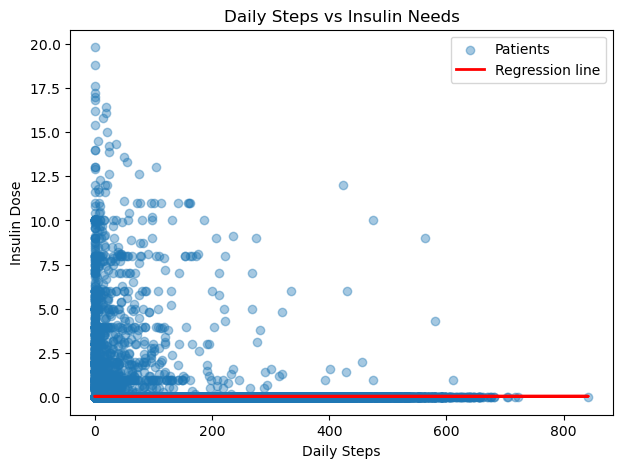

In [365]:
# Linear regression: insulin_dose ~ daily_step
X = sm.add_constant(filtered_df["steps"])   # add intercept
y = filtered_df["bolus_volume_delivered"]

model = sm.OLS(y, X).fit()
print(model.summary())

coef = model.params["steps"]
print(f"\nEstimated effect: Each additional 1,000 steps reduces insulin need by {coef*1000:.2f} units (approx).")

# Visualization
# -------------------
plt.figure(figsize=(7,5))
plt.scatter(filtered_df["steps"], filtered_df["bolus_volume_delivered"], alpha=0.4, label="Patients")
plt.plot(filtered_df["steps"], model.predict(X), color="red", linewidth=2, label="Regression line")
plt.xlabel("Daily Steps")
plt.ylabel("Insulin Dose")
plt.title("Daily Steps vs Insulin Needs")
plt.legend()
plt.show()


### Q15. Should older patients (>50) increase their sleep duration to reduce nighttime glucose spikes?

**Reasoning:**  
This question explores whether **increasing sleep duration** in older adults (>50 years) can be a viable strategy to reduce **nighttime glucose variability or spikes**. While it may seem intuitive to associate longer sleep with better glucose control, the relationship is more nuanced in older adults due to the following factors:

- **Age-Related Sleep Changes:** As people age, sleep becomes more fragmented, lighter, and shorter in duration. Simply increasing time in bed does not guarantee more restorative sleep or better metabolic outcomes.
- **Insulin Timing & Metabolism:** Nighttime glucose spikes are often driven by late-day insulin dosing, post-dinner carbs, or misaligned basal insulin patterns — not just sleep quantity.
- **Comorbidities:** Older adults frequently deal with other conditions (e.g., sleep apnea, cardiovascular disease, medications) that influence both sleep architecture and glucose metabolism.
- **Hormonal Regulation:** The impact of sleep on hormones like cortisol, growth hormone, and melatonin may differ in older adults. These hormones play a role in glucose homeostasis overnight.
- **Sleep Quality vs. Quantity:** More important than duration alone is the **quality of sleep** — uninterrupted, deep sleep phases improve metabolic control better than longer but poor-quality sleep.
- **Circadian Factors:** Misaligned sleep patterns (e.g., late sleeping or irregular sleep-wake times) may worsen glucose control even if total sleep duration is adequate.
- **Behavioral Patterns:** Eating close to bedtime or insufficient evening insulin adjustments can contribute more significantly to glucose spikes than sleep duration alone.

---

**Key Insights:**

- In the dataset, **older adults (>50)** who slept **<6 hours** did **not** necessarily show more nighttime glucose spikes — in fact, some showed **fewer spikes**.
- This counters the assumption that simply extending sleep will reduce glycemic excursions overnight in older populations.
- Thus, the message should **not be to just "sleep more"**, but rather to:
  - Improve **sleep quality** (e.g., treating sleep apnea, reducing nocturnal awakenings)
  - Reassess **evening insulin strategies**
  - Avoid **late heavy meals**
  - Consider **continuous glucose monitoring (CGM)** to fine-tune overnight dosing.
- Clinically, a **personalized approach** that addresses behavioral, hormonal, and insulin-related factors will likely yield better outcomes than sleep duration alone.

---

**Conclusion:**  
While sleep matters for glucose control, in older patients, it’s **not the number of hours**, but **what happens during and around sleep** (meal timing, insulin strategy, comorbidities) that more strongly affects nighttime glucose stability.


Nighttime glucose spike rate by sleep duration (age > 50):
     sleep_group  night_spike_rate
0    Short (<6h)          0.149048
1  Normal (6–8h)          0.464889

Chi-square test:
  chi2 = 2595.058 | dof = 1 | p-value = 0.0


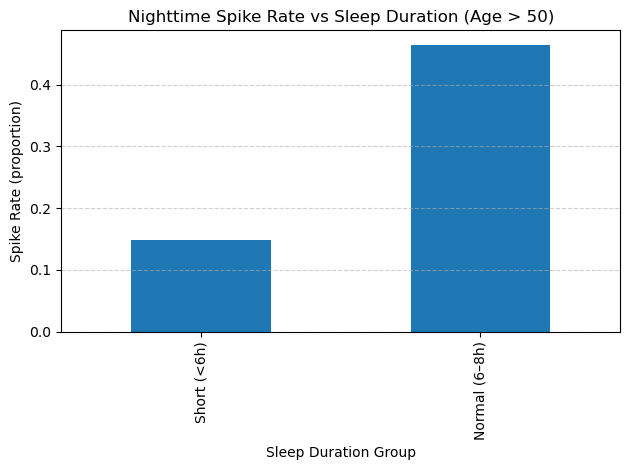


Suggestion: Target the 'Short (<6h)' range — it has the lowest nighttime spike rate (14.90%).


In [368]:
from scipy.stats import chi2_contingency

SPIKE_LABEL = "Above Range"  
NIGHT_HOURS = list(range(22,24)) + list(range(0,6))  # 22:00–05:59 as "night"
SLEEP_BINS = [0, 6, 8, 24]    # <6h, 6–8h, >8h
SLEEP_LABELS = ["Short (<6h)", "Normal (6–8h)", "Long (>8h)"]

# load data from csv
demo = pd.read_csv("demographic_cleandata.csv")        # has patient_id, age, sleep_duration
merged = pd.read_csv("merged_cleandata.csv", parse_dates=["time"])  # has patient_id, time, glucose_range_level

# --- Merge + keep older patients ---
df = merged.merge(demo[["patient_id", "age", "sleep_duration"]], on="patient_id", how="left")
df = df[df["age"] > 50].copy()

# calc night hours
df["hour"] = df["time"].dt.hour
df_night = df[df["hour"].isin(NIGHT_HOURS)].copy()

# --- Spike flag + sleep groups ---
df_night["is_spike"] = (df_night["glucose_range_level"] == SPIKE_LABEL).astype(int)
df_night["sleep_group"] = pd.cut(df_night["sleep_duration"], bins=SLEEP_BINS,
                                 labels=SLEEP_LABELS, right=True, include_lowest=True)

# Spike rate by sleep group
summary = (df_night.groupby("sleep_group", observed=True)["is_spike"]
                    .mean()
                    .rename("night_spike_rate")
                    .reset_index())
print("Nighttime glucose spike rate by sleep duration (age > 50):")
print(summary)

# --- Chi-square test (are spike rates different across sleep groups?) ---
contingency = pd.crosstab(df_night["sleep_group"], df_night["is_spike"])
chi2, p, dof, expected = chi2_contingency(contingency)
print("\nChi-square test:")
print("  chi2 =", round(chi2, 3), "| dof =", dof, "| p-value =", p)

# visualize
summary.plot(kind="bar", x="sleep_group", y="night_spike_rate", legend=False)
plt.title("Nighttime Spike Rate vs Sleep Duration (Age > 50)")
plt.xlabel("Sleep Duration Group")
plt.ylabel("Spike Rate (proportion)")
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# summary
best_group = summary.sort_values("night_spike_rate").iloc[0]
print(f"\nSuggestion: Target the '{best_group.sleep_group}' range — "
      f"it has the lowest nighttime spike rate ({best_group.night_spike_rate:.2%}).")


### Q16. Which patients are experiencing longer hypoglycemia incidents, and when should they be advised to take carbs to restore their glucose levels?

#### Why this is important

Identifying prolonged hypoglycemia is critical because sustained low blood sugar can cause  
severe complications such as confusion, seizures, coma, and even death. The **duration** of hypoglycemia matters as much as the frequency — even a single long event poses significant risk.  
By detecting when glucose remains below the safe range for at least **15 continuous minutes**, we can intervene early with carbohydrate intake to prevent serious outcomes.

---

#### Our Approach

- Mark continuous periods where glucose stays *below range* (hypoglycemia).
- Log the **start time** and **end time** of each hypoglycemia event.
- Calculate the **duration** in 5-minute intervals (CGM sampling).
- Flag events lasting ≥ 15 minutes as **critical** and generate **carb recommendations every 15 minutes** until recovery.

---

#### Notes & Assumptions

- Sampling frequency is 5 minutes; “continuous 15 minutes” equals 3 sequential readings.
- “Below range” threshold is typically < 70 mg/dL.
- Recommendations reflect general guidance.


All hypoglycemia events (start & end with recommendation):
    patient_id        date  event_id          start_time            end_time  \
0    HUPA0001P  2018-06-13       4.0 2018-06-13 21:15:00 2018-06-13 21:30:00   
1    HUPA0001P  2018-06-14       6.0 2018-06-14 05:00:00 2018-06-14 06:20:00   
2    HUPA0001P  2018-06-24       4.0 2018-06-24 01:00:00 2018-06-24 01:55:00   
3    HUPA0001P  2018-06-26       4.0 2018-06-26 05:15:00 2018-06-26 05:45:00   
4    HUPA0002P  2018-06-14       2.0 2018-06-14 00:35:00 2018-06-14 08:25:00   
..         ...         ...       ...                 ...                 ...   
406  HUPA0028P  2022-05-14       2.0 2022-05-14 04:35:00 2022-05-14 06:50:00   
407  HUPA0028P  2022-05-14       4.0 2022-05-14 07:25:00 2022-05-14 08:10:00   
408  HUPA0028P  2022-05-15       2.0 2022-05-15 15:15:00 2022-05-15 16:15:00   
409  HUPA0028P  2022-05-15       4.0 2022-05-15 19:00:00 2022-05-15 19:15:00   
410  HUPA0028P  2022-05-17       2.0 2022-05-17 18:30:00 2022

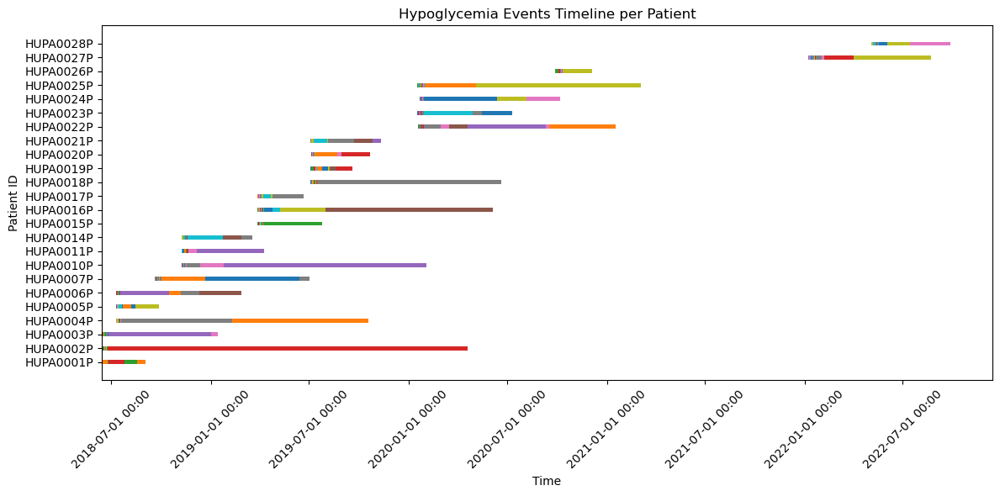

In [379]:
merged_df['time'] = pd.to_datetime(merged_df['time'])
merged_df['hour'] = merged_df['time'].dt.hour
# Extract date for aggregation
merged_df['date'] = merged_df['time'].dt.date
patients = merged_df['patient_id'].unique()


# Create below_range flag (1 = hypoglycemia, 0 = normal)
merged_df['below_range'] = merged_df['glucose_range_level'].str.strip().str.lower().apply(
    lambda x: 1 if x == 'below range' else 0
)
# Hypo rows finder
def consecutive_hypo_rows(group, min_length=3):
    group = group.copy()
    group['event_group'] = (group['below_range'] != group['below_range'].shift()).cumsum()
    
    hypo_events = group[group['below_range'] == 1].groupby('event_group')
    
    result = []
    for eid, rows in hypo_events:
        if len(rows) >= min_length:
            duration_intervals = len(rows)   # how many 5-min intervals
            num_blocks = duration_intervals // 3  # how many 15-min blocks
            
            # Store the event with patient, date, start & end
            result.append({
                'patient_id': rows['patient_id'].iloc[0],
                'date': rows['date'].iloc[0],
                'event_id': eid,
                'start_time': rows['time'].iloc[0],
                'end_time': rows['time'].iloc[-1],
                'duration_intervals': duration_intervals*5,
                'recommendation': f"Take carbs every 15 min ({num_blocks} times)" if num_blocks > 0 else "Monitor only"
            })
    return pd.DataFrame(result)

# Apply per patient per day
hypo_events = merged_df.groupby(['patient_id', 'date']).apply(consecutive_hypo_rows).reset_index(drop=True)

print("All hypoglycemia events (start & end with recommendation):")
print(hypo_events)


# Convert times to datetime 
hypo_events['start_time'] = pd.to_datetime(hypo_events['start_time'])
hypo_events['end_time'] = pd.to_datetime(hypo_events['end_time'])

fig, ax = plt.subplots(figsize=(12, 6))

# Plot events as horizontal bars
for i, row in hypo_events.iterrows():
    ax.barh(row['patient_id'], 
            (row['end_time'] - row['start_time']).total_seconds()/60, 
            left=row['start_time'], 
            height=0.3, 
            label=row['recommendation'] if i==0 else "")

# Format x-axis to show full datetime
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
plt.xticks(rotation=45)
plt.xlabel("Time")
plt.ylabel("Patient ID")
plt.title("Hypoglycemia Events Timeline per Patient")
plt.tight_layout()
plt.show()


<!doctype html>
<html lang="en">
<body>
  <h2>What the chart shows</h2>
  <ul>
    <li><strong>Bars</strong> represent hypoglycemia incidents.</li>
    <li><strong>Start point</strong> = when glucose first dropped below the safe range.</li>
    <li><strong>End point</strong> = when glucose returned to normal.</li>
    <li><strong>Length</strong> = duration of the event (longer bars = more severe incidents).</li>
  </ul>

  <h2>Key Insight</h2>
  <ul>
    <li>You can quickly see which patients experience <strong>short vs. long</strong> episodes.</li>
  </ul>

  <h3>Examples</h3>
  <ul>
    <li>If one patient has <strong>longer bars</strong>, they’re at <strong>higher risk</strong> and need earlier carb interventions.</li>
    <li>If another patient has mostly <strong>short events</strong>, their glucose usually recovers faster.</li>
  </ul>
  ------------------------------------------------------------------------------------------------------------------------------------------
</body>
</html>

### Hypoglycemia Frequency

#### Q17. What is the frequency of hypoglycemic incidents experienced by each patient during the study period?**

---

#### Why it is important:

Repeated exposure to low blood sugar can reduce the body's warning signs,  
such as shakiness or a fast heartbeat. A person may not realize their blood sugar  
is dropping until it reaches a dangerously low level, increasing the risk of a  
severe, life-threatening event.



Number of hypoglycemia events per patient with recommendations:
    patient_id        date  num_hypo_events  \
0    HUPA0001P  2018-06-13                1   
1    HUPA0001P  2018-06-14                1   
2    HUPA0001P  2018-06-24                1   
3    HUPA0001P  2018-06-26                1   
4    HUPA0002P  2018-06-14                3   
..         ...         ...              ...   
201  HUPA0028P  2022-05-11                4   
202  HUPA0028P  2022-05-12                2   
203  HUPA0028P  2022-05-14                2   
204  HUPA0028P  2022-05-15                2   
205  HUPA0028P  2022-05-17                1   

                                        recommendation  
0    Low frequency – Routine monitoring; follow 15–...  
1    Low frequency – Routine monitoring; follow 15–...  
2    Low frequency – Routine monitoring; follow 15–...  
3    Low frequency – Routine monitoring; follow 15–...  
4    Moderate frequency – Carry quick-acting carbs ...  
..                          

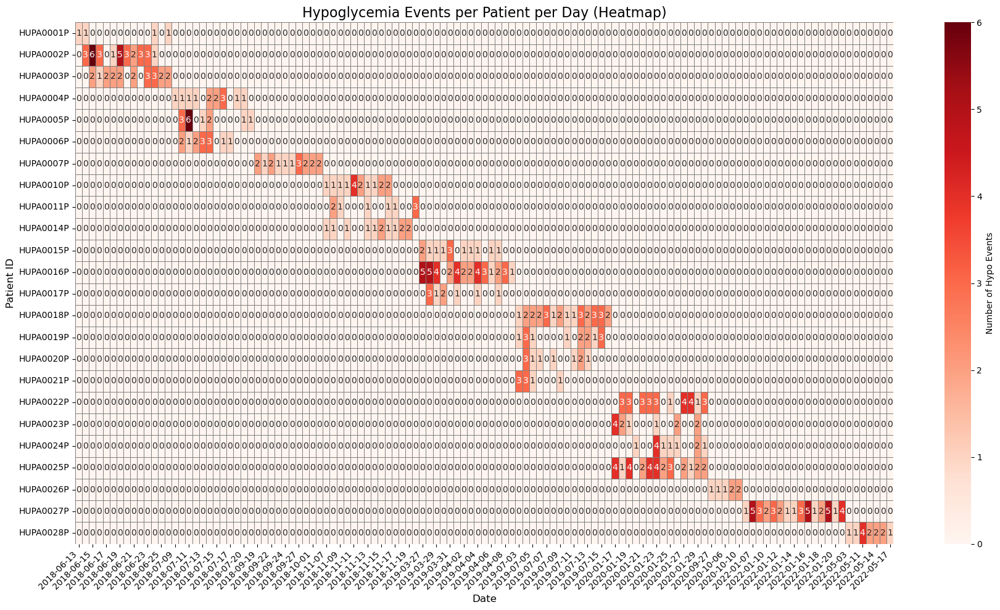

In [387]:
# Count frequency of hypoglycemic events per day per patient
events_per_day = (
    hypo_events.groupby(['patient_id', 'date'])['event_id']
    .count()
    .reset_index()
    .rename(columns={'event_id': 'num_hypo_events'})
)

# Function to give recommendations
def prescribe_recommendation(freq):
    if freq >= 5:
        return "High frequency – Review insulin dosage and meal planning with clinician."
    elif 2 <= freq <= 4:
        return "Moderate frequency – Carry quick-acting carbs and check glucose more often."
    elif freq == 1:
        return "Low frequency – Routine monitoring; follow 15–15 rule if hypo occurs."
    else:
        return "No incidents – Maintain current regimen with routine checks."

events_per_day['recommendation'] = events_per_day['num_hypo_events'].apply(prescribe_recommendation)

print("\nNumber of hypoglycemia events per patient with recommendations:")
print(events_per_day)

# Pivot table for heatmap
heatmap_data = events_per_day.pivot_table(
    index="patient_id",
    columns="date",
    values="num_hypo_events",
    fill_value=0
).astype(int)  


plt.figure(figsize=(18, 10))
sns.heatmap(
    heatmap_data, 
    cmap="Reds", 
    linewidths=0.5, 
    linecolor="gray",
    annot=True, 
    fmt="d",
    cbar_kws={'label': 'Number of Hypo Events'}
)

plt.title("Hypoglycemia Events per Patient per Day (Heatmap)", fontsize=16)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Patient ID", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


<html>
<body>
    <h3>Key Insights</h3>

<p>The data allows us to rank patients by risk:</p>
    <ul>
        <li><strong>High-risk:</strong> frequent events → “Review insulin and meal planning.”</li>
        <li><strong>Medium-risk:</strong> occasional events → “Carry quick-acting carbs.”</li>
        <li><strong>Low-risk:</strong> minimal events → “Routine monitoring.”</li>
    </ul>

<p><strong>Actionable insight:</strong> This chart helps to identify the frequency of hypoglycemic incidents.</p>
--------------------------------------------------------------------------------------------------------------------------------------------

</body>
</html>

#### Hypoglycemia Alert Recommendations  
#### Q18. For each hypoglycemia event, how can we create 15-minute interval recommendations to help the patient prevent dangerously low blood sugar?**

---

#### Why this is important:

Hypoglycemia (low blood sugar) can become dangerous if not treated promptly.  
By creating 15-minute interval recommendations, patients get timely reminders to consume carbohydrates, which helps:

- Prevent their blood sugar from dropping to a critically low level.  
- Reduce


      patient_id        date  event_id recommendation_time  \
0      HUPA0001P  2018-06-13       4.0 2018-06-13 21:30:00   
1      HUPA0001P  2018-06-13       4.0 2018-06-13 21:45:00   
2      HUPA0001P  2018-06-13       4.0 2018-06-13 22:00:00   
3      HUPA0001P  2018-06-13       4.0 2018-06-13 22:15:00   
4      HUPA0001P  2018-06-13       4.0 2018-06-13 22:30:00   
...          ...         ...       ...                 ...   
10661  HUPA0028P  2022-05-17       2.0 2022-05-17 19:00:00   
10662  HUPA0028P  2022-05-17       2.0 2022-05-17 19:15:00   
10663  HUPA0028P  2022-05-17       2.0 2022-05-17 19:30:00   
10664  HUPA0028P  2022-05-17       2.0 2022-05-17 19:45:00   
10665  HUPA0028P  2022-05-17       2.0 2022-05-17 20:00:00   

                              message  
0      Take 15g carb and wait 15 mins  
1      Take 15g carb and wait 15 mins  
2      Take 15g carb and wait 15 mins  
3      Take 15g carb and wait 15 mins  
4      Take 15g carb and wait 15 mins  
...            

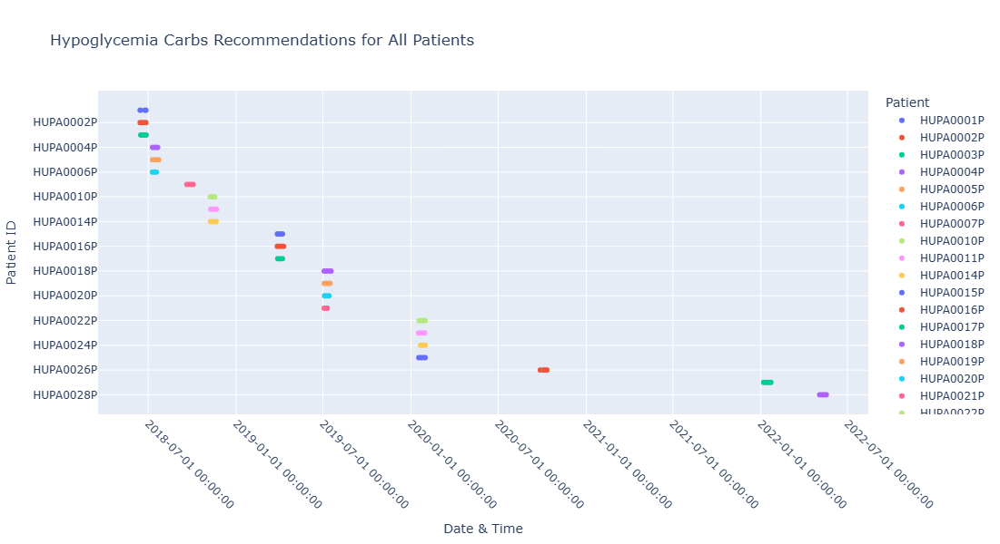

In [399]:
def add_hypo_recommendations(hypo_events):
    recommendations = []
    
    for _, row in hypo_events.iterrows():
        patient_id = row['patient_id']
        date = row['date']
        start_time = row['start_time']
        
        duration_intervals = row['duration_intervals']
        
        num_blocks = int(duration_intervals // 3)  
        
        for i in range(num_blocks):
            rec_time = start_time + pd.Timedelta(minutes=15 * (i + 1))
            recommendations.append({
                'patient_id': patient_id,
                'date': date,
                'event_id': row['event_id'],
                'recommendation_time': rec_time,
                'message': 'Take 15g carb and wait 15 mins'
            })
    
    return pd.DataFrame(recommendations)

recommendations = add_hypo_recommendations(hypo_events)
print(recommendations)

# Ensure datetime
recommendations['recommendation_time'] = pd.to_datetime(recommendations['recommendation_time'])

# Sort patients for consistent ordering
recommendations['patient_id'] = pd.Categorical(
    recommendations['patient_id'],
    categories=sorted(recommendations['patient_id'].unique()),
    ordered=True
)

# Scatter plot: x = recommendation time, y = patient_id
fig = px.scatter(
    recommendations,
    x='recommendation_time',
    y='patient_id',
    color='patient_id',
    hover_data=['event_id', 'message'],
    title='Hypoglycemia Carbs Recommendations for All Patients',
)

# Format x-axis to show full datetime
fig.update_xaxes(
    tickformat='%Y-%m-%d %H:%M:%S',
    tickangle=45
)

# adjust figure size
fig.update_layout(
    width=1400,
    height=600,
    yaxis_title='Patient ID',
    xaxis_title='Date & Time',
    legend_title='Patient',
)

fig.show()

#### Hypoglycemia Risk Categorization  
#### Q19. How can we categorize patients based on the severity and frequency of hypoglycemia events to identify those who need urgent or closer medical attention?**

---

#### Why this is important:

- Some patients may experience long or frequent hypoglycemia events, which increases the risk of severe complications.  
- Risk categorization allows clinicians to prioritize patients who require immediate intervention, insulin adjustment, or lifestyle modifications.  
- It supports proactive management, reducing the likelihood of dangerously low blood sugar episodes.


    patient_id        date  num_hypo_events  longest_event_minutes  \
1    HUPA0001P  2018-06-14                1                   85.0   
2    HUPA0001P  2018-06-24                1                   60.0   
4    HUPA0002P  2018-06-14                3                  475.0   
5    HUPA0002P  2018-06-15                6                   60.0   
6    HUPA0002P  2018-06-16                3                  225.0   
..         ...         ...              ...                    ...   
198  HUPA0027P  2022-01-21                4                   20.0   
200  HUPA0028P  2022-05-07                1                  120.0   
201  HUPA0028P  2022-05-11                4                  110.0   
203  HUPA0028P  2022-05-14                2                  140.0   
204  HUPA0028P  2022-05-15                2                   65.0   

                                 risk_category  
1          High Severity - Immediate Attention  
2          High Severity - Immediate Attention  
4          H

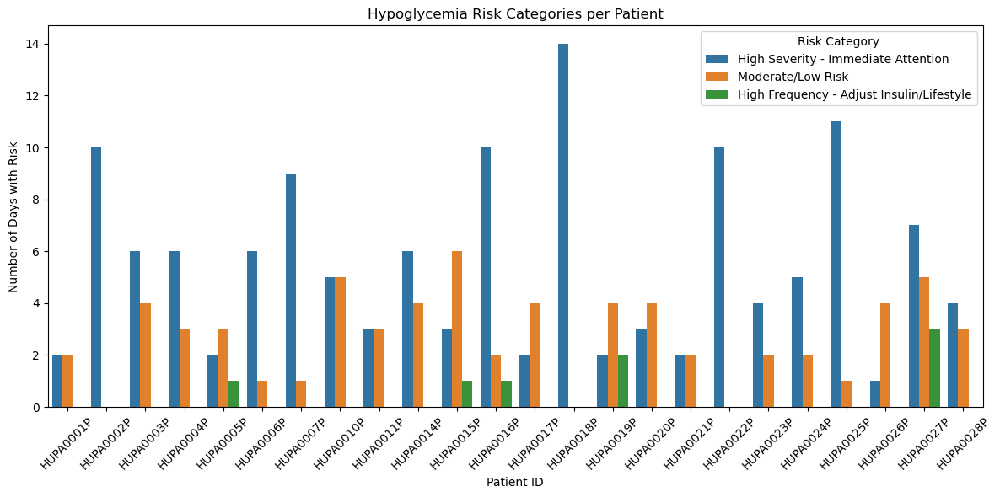

In [404]:
hypo_summary = hypo_events.groupby(['patient_id', 'date']).agg(
    num_hypo_events=('event_id', 'count'),
    longest_event_minutes=('duration_intervals', 'max')  
).reset_index()

# Define risk categories
def assess_risk(row):
    if row['longest_event_minutes'] >= 60:
        return 'High Severity - Immediate Attention'
    elif row['num_hypo_events'] >= 3:
        return 'High Frequency - Adjust Insulin/Lifestyle'
    else:
        return 'Moderate/Low Risk'

# Apply risk assessment
hypo_summary['risk_category'] = hypo_summary.apply(assess_risk, axis=1)

# View top risks
top_risks = hypo_summary[hypo_summary['risk_category'] != 'Moderate/Low Risk']

print(top_risks[['patient_id', 'date', 'num_hypo_events', 'longest_event_minutes', 'risk_category']])

# Count of each risk category per patient
risk_counts = hypo_summary.groupby(['patient_id', 'risk_category']).size().reset_index(name='count')

plt.figure(figsize=(12,6))
sns.barplot(data=risk_counts, x='patient_id', y='count', hue='risk_category')

plt.title('Hypoglycemia Risk Categories per Patient')
plt.xlabel('Patient ID')
plt.ylabel('Number of Days with Risk')
plt.xticks(rotation=45)
plt.legend(title='Risk Category')
plt.tight_layout()
plt.show()

<html>
<body>
    <h4>Key Insight from the Result:</h4>
    <ul>
        <li>Patients with longest events ≥ 60 minutes are classified as <strong>High Severity</strong>, signaling the need for immediate attention.</li>
        <li>Patients with three or more hypoglycemia events are classified as <strong>High Frequency</strong>, indicating the need for insulin or lifestyle adjustments.</li>
        <li>Those with fewer and shorter events fall into <strong>Moderate/Low Risk</strong>, suggesting current management is largely effective.</li>
        <li>This risk assessment helps clinicians allocate resources efficiently and focus on high-risk individuals first.</li>
    </ul>
----------------------------------------------------------------------------------------------------------------------------------------------

</body>
</html>

<h4>Q20. How long do patients experience <strong>hyperglycemic incidents</strong> (glucose &gt;180 mg/dL) during the monitoring period?</h4>

<h4>Why It Is Important</h4>
<p>Identifying longer hyperglycemic events is crucial for preventing severe, often irreversible health complications that result from prolonged exposure to high blood sugar. While short, occasional blood sugar spikes may be harmless, consistent hyperglycemia, also known as <strong>chronic hyperglycemia</strong>, can damage vital organs and systems throughout the body.</p>

All hyperglycemia events (start & end with recommendation):
    patient_id        date  event_id          start_time            end_time  \
0    HUPA0001P  2018-06-13       1.0 2018-06-13 18:40:00 2018-06-13 19:55:00   
1    HUPA0001P  2018-06-14      18.0 2018-06-14 11:10:00 2018-06-14 13:40:00   
2    HUPA0001P  2018-06-14      24.0 2018-06-14 17:00:00 2018-06-14 20:55:00   
3    HUPA0001P  2018-06-15       5.0 2018-06-15 00:25:00 2018-06-15 04:55:00   
4    HUPA0001P  2018-06-15      11.0 2018-06-15 12:15:00 2018-06-15 13:00:00   
..         ...         ...       ...                 ...                 ...   
788  HUPA0028P  2022-05-16       2.0 2022-05-16 10:05:00 2022-05-16 10:30:00   
789  HUPA0028P  2022-05-16       4.0 2022-05-16 15:40:00 2022-05-16 16:35:00   
790  HUPA0028P  2022-05-17       2.0 2022-05-17 01:35:00 2022-05-17 03:10:00   
791  HUPA0028P  2022-05-17       4.0 2022-05-17 09:15:00 2022-05-17 13:05:00   
792  HUPA0028P  2022-05-17       6.0 2022-05-17 15:55:00 202

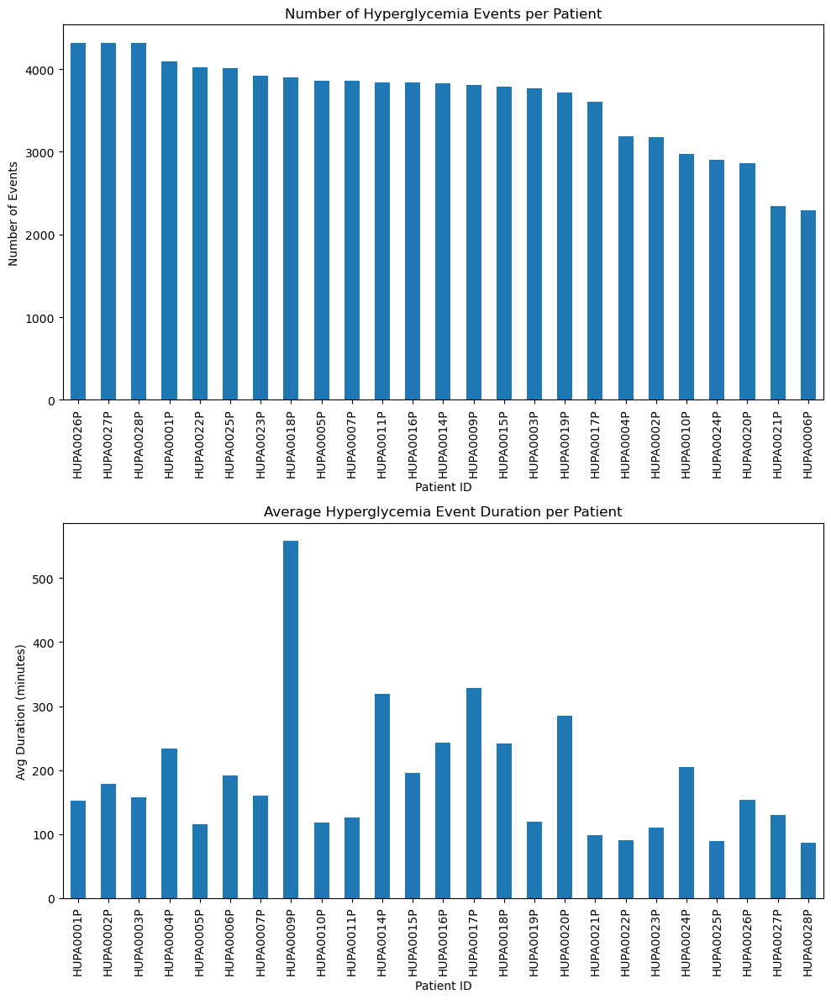

In [410]:
# Create above_range flag (1 = hyperglycemia, 0 = normal)
merged_df['above_range'] = merged_df['glucose_range_level'].str.strip().str.lower().apply(
    lambda x: 1 if x == 'above range' else 0
)

# Hyperglycemia rows finder
def consecutive_hyper_rows(group, min_length=3):
    group = group.copy()
    group['event_group'] = (group['above_range'] != group['above_range'].shift()).cumsum()
    
    hyper_events = group[group['above_range'] == 1].groupby('event_group')
    
    result = []
    for eid, rows in hyper_events:
        if len(rows) >= min_length:
            duration_intervals = len(rows)   # number of 5-min intervals
            num_blocks = duration_intervals // 3  # number of 15-min blocks
            
            result.append({
                'patient_id': rows['patient_id'].iloc[0],
                'date': rows['date'].iloc[0],
                'event_id': eid,
                'start_time': rows['time'].iloc[0],
                'end_time': rows['time'].iloc[-1],
                'duration_intervals': duration_intervals*5,
                'recommendation': f"Take corrective action every 15 min ({num_blocks} times)" if num_blocks > 0 else "Monitor only"
            })
    return pd.DataFrame(result)

# Apply per patient per day
hyper_events = merged_df.groupby(['patient_id', 'date']).apply(consecutive_hyper_rows).reset_index(drop=True)

print("All hyperglycemia events (start & end with recommendation):")
print(hyper_events)

fig, axes = plt.subplots(2, 1, figsize=(10, 12))  # 3 rows, 1 column

# Events per patient
merged_df['patient_id'].value_counts().plot(kind='bar', ax=axes[0])
axes[0].set_title("Number of Hyperglycemia Events per Patient")
axes[0].set_xlabel("Patient ID")
axes[0].set_ylabel("Number of Events")
axes[0].tick_params(axis='x', rotation=90)

# Average duration per patient
hyper_events.groupby('patient_id')['duration_intervals'].mean().plot(kind='bar', ax=axes[1])
axes[1].set_title("Average Hyperglycemia Event Duration per Patient")
axes[1].set_xlabel("Patient ID")
axes[1].set_ylabel("Avg Duration (minutes)")
axes[1].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()


<h4>Key Insight from the Table:</h4>
<ul>
  <li><strong>Event duration varies widely:</strong> Some patients have short events (~30–50 minutes), while others experience prolonged hyperglycemia (&gt;4 hours).</li>
  <li><strong>Repeated interventions are often needed:</strong> The “recommendation” column indicates that patients may require multiple corrective actions per event, showing that single interventions are often insufficient.</li>
  <li><strong>Patient-specific patterns emerge:</strong> Certain patients (e.g., HUPA0001P) have multiple long-duration events on the same day, suggesting individualized management strategies are necessary.</li>
  <li><strong>Overall hyperglycemia burden:</strong> By summing durations across all events per patient, we can quantify total exposure to high glucose, which is critical for risk assessment.</li>
</ul>
--------------------------------------------------------------------------------------------------------------------------------------------------

<h4>Hyper/Hypo Incidents Analysis per patient </h4>
<h4>Q21. For each patient, are they more affected by <strong>hyperglycemia</strong>, <strong>hypoglycemia</strong>, or equally affected by both, and how should their treatment or monitoring plan be adjusted accordingly? </h4>

<h5>Why It Is Important</h5>
<p>Knowing whether a patient is predominantly hyperglycemic or hypoglycemic helps clinicians <strong>personalize interventions</strong>.</p>

<ul>
  <li>Patients with more <strong>hyperglycemia</strong> may need adjustments in <em>diet, insulin dosing, or physical activity</em>.</li>
  <li>Patients with more <strong>hypoglycemia</strong> may require <em>more frequent monitoring, reduced insulin, or preventive strategies</em>.</li>
  <li>Those <strong>equally affected</strong> need a <em>balanced management plan</em> to reduce overall glycemic variability.</li>
</ul>

<p>This analysis can also <strong>prioritize patients</strong> who are at higher risk of complications.</p>

   patient_id  hyper_events  hypo_events              status
0   HUPA0001P            52            4  More Hyperglycemia
1   HUPA0002P            13           30   More Hypoglycemia
2   HUPA0003P            30           21  More Hyperglycemia
3   HUPA0004P            31           13  More Hyperglycemia
4   HUPA0005P            42           14  More Hyperglycemia
5   HUPA0006P            21           13  More Hyperglycemia
6   HUPA0007P            54           17  More Hyperglycemia
7   HUPA0009P            20            0  More Hyperglycemia
8   HUPA0010P            21           16  More Hyperglycemia
9   HUPA0011P            49            9  More Hyperglycemia
10  HUPA0014P            31           13  More Hyperglycemia
11  HUPA0015P            36           13  More Hyperglycemia
12  HUPA0016P            26           38   More Hypoglycemia
13  HUPA0017P            34            9  More Hyperglycemia
14  HUPA0018P            25           28   More Hypoglycemia
15  HUPA0019P           

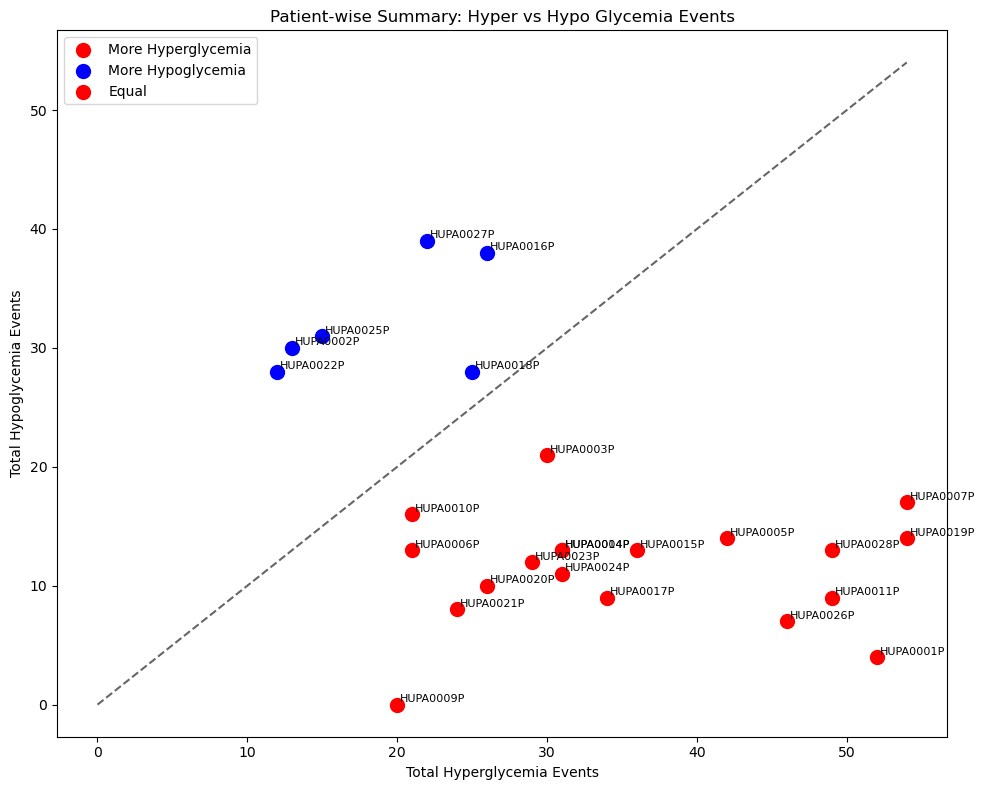

In [414]:
hypo_daily = hypo_events.groupby(['patient_id', 'date']).size().reset_index(name='hypo_events')

# Count hyper events per patient per day
hyper_daily = hyper_events.groupby(['patient_id', 'date']).size().reset_index(name='hyper_events')

# Merge them to get daily_summary
daily_summary = pd.merge(hypo_daily, hyper_daily, on=['patient_id', 'date'], how='outer').fillna(0)

# Convert counts to integer
daily_summary['hypo_events'] = daily_summary['hypo_events'].astype(int)
daily_summary['hyper_events'] = daily_summary['hyper_events'].astype(int)

# Aggregate hyper/hypo event counts across all days per patient
patient_summary = (
    daily_summary.groupby("patient_id")[["hyper_events", "hypo_events"]]
    .sum()
    .reset_index()
)

# Classification
def classify(row):
    if row['hyper_events'] > row['hypo_events']:
        return "More Hyperglycemia"
    elif row['hypo_events'] > row['hyper_events']:
        return "More Hypoglycemia"
    else:
        return "Equal"

patient_summary['status'] = patient_summary.apply(classify, axis=1)
print(patient_summary.head(50))

plt.figure(figsize=(10,8))
colors = {"More Hyperglycemia":"red", "More Hypoglycemia":"blue", "Equal":"green"}

for _, row in patient_summary.iterrows():
    plt.scatter(row['hyper_events'], row['hypo_events'], 
                color=colors[row['status']], s=100)
    plt.text(row['hyper_events']+0.2, row['hypo_events']+0.2, 
             row['patient_id'], fontsize=8)

# Reference line (equal hyper = hypo)
max_val = max(patient_summary['hyper_events'].max(), 
              patient_summary['hypo_events'].max())
plt.plot([0, max_val], [0, max_val], 'k--', alpha=0.6, label="Equal Line")

plt.xlabel("Total Hyperglycemia Events")
plt.ylabel("Total Hypoglycemia Events")
plt.title("Patient-wise Summary: Hyper vs Hypo Glycemia Events")
plt.legend(colors.keys())
plt.tight_layout()
plt.show()

<h4>Key Insights</h4>
<p>Most patients (e.g., HUPA0001P, HUPA0003P, HUPA0004P, etc.) are more affected by <strong>hyperglycemia</strong> → their glucose frequently spikes above the target range.</p>

<p>A smaller group of patients (e.g., HUPA0002P, HUPA0016P, HUPA0018P, etc.) are more affected by <strong>hypoglycemia</strong> → they experience more dangerously low glucose events.</p>

<p>There are no patients with balanced events, indicating that all patients tend to lean towards one type of glycemic risk rather than being equally affected.</p>
<h4>Actions need to take</h4>
<p>Patients with more <strong>hyperglycemia</strong> may need:</p>
<ul>
  <li>Adjustments in insulin doses</li>
  <li>Closer monitoring of meals and carbohydrate intake</li>
  <li>Lifestyle interventions to reduce glucose spikes</li>
</ul>

<p>Patients with more <strong>hypoglycemia</strong> may need:</p>
<ul>
  <li>Preventive monitoring</li>
  <li>Reduced insulin or faster-acting glucose for emergency correction</li>
</ul>

<p>This helps <strong>prioritize interventions</strong>: patients with the largest imbalance may be at higher risk of complications.</p>


<h4>Q22. For each patient, how much physical activity (calories burned) do they perform during hyperglycemia events, and is it sufficient to potentially mitigate the effects of high glucose levels?</h4>

<h4>Why It Is Important?</h4>
<ul>
  <li>Physical activity helps lower blood glucose levels and reduce the risk of complications.</li>
  <li>Patients with frequent hyperglycemia but low activity may require targeted lifestyle interventions.</li>
  <li>Monitoring calories burned during high glucose periods provides insight into patient behavior and helps <strong>personalize management plans</strong>.</li>
</ul>


   patient_id  total_calories  avg_calories  num_hyper_events
0   HUPA0001P       10055.502    193.375038                52
1   HUPA0002P        5116.927    393.609769                13
2   HUPA0003P        7487.052    249.568400                30
3   HUPA0004P       16889.290    544.815806                31
4   HUPA0005P        5664.404    134.866762                42
5   HUPA0006P        9030.713    430.033952                21
6   HUPA0007P       23935.817    443.255870                54
7   HUPA0009P       19400.961    970.048050                20
8   HUPA0010P        4449.360    211.874286                21
9   HUPA0011P       11463.169    233.942224                49
10  HUPA0014P       13352.347    430.720871                31
11  HUPA0015P       10686.376    296.843778                36
12  HUPA0016P        9220.916    354.650615                26
13  HUPA0017P       16323.566    480.104882                34
14  HUPA0018P        7325.450    293.018000                25
15  HUPA

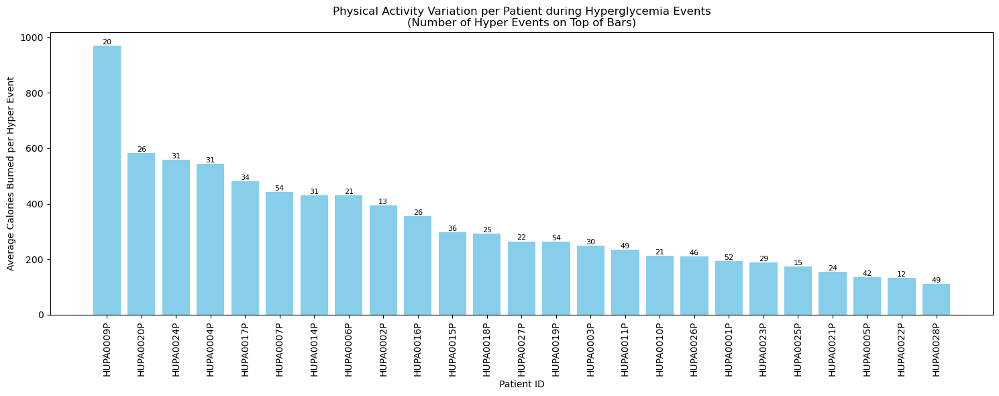

In [425]:
merged_df['datetime'] = pd.to_datetime(merged_df['time'])

# Convert hyper_events times to datetime
hyper_events['start_time'] = pd.to_datetime(hyper_events['start_time'])
hyper_events['end_time'] = pd.to_datetime(hyper_events['end_time'])

# Function to calculate total calories during each hyper event
def calories_during_event(row):
    patient_data = merged_df[merged_df['patient_id'] == row['patient_id']]
    mask = (patient_data['datetime'] >= row['start_time']) & (patient_data['datetime'] <= row['end_time'])
    return patient_data.loc[mask, 'calories'].sum()

# Apply function to hyper_events
hyper_events['calories_burned'] = hyper_events.apply(calories_during_event, axis=1)

# Aggregate per patient
patient_activity_summary = hyper_events.groupby('patient_id')['calories_burned'].agg(
    total_calories='sum',
    avg_calories='mean',
    num_hyper_events='count'
).reset_index()

print(patient_activity_summary)

patient_activity_summary_sorted = patient_activity_summary.sort_values('avg_calories', ascending=False)

plt.figure(figsize=(15,6))
bars = plt.bar(patient_activity_summary_sorted['patient_id'], 
               patient_activity_summary_sorted['avg_calories'], 
               color='skyblue')

# Add num_hyper_events as label on top of each bar
for i, bar in enumerate(bars):
    yval = bar.get_height()
    num_events = patient_activity_summary_sorted.iloc[i]['num_hyper_events']
    plt.text(bar.get_x() + bar.get_width()/2, yval + 5, str(num_events), ha='center', fontsize=8, color='black')

plt.xticks(rotation=90)
plt.ylabel("Average Calories Burned per Hyper Event")
plt.xlabel("Patient ID")
plt.title("Physical Activity Variation per Patient during Hyperglycemia Events\n(Number of Hyper Events on Top of Bars)")
plt.tight_layout()
plt.show()

<h4>Key Insight from Result</h4>
<ul>
  <li>There is substantial <strong>variation in physical activity</strong> across patients during hyperglycemia events.</li>
  <li>Some patients burn many calories per event (e.g., HUPA0009P ~970 cal/event), while others burn very few (e.g., HUPA0028P ~112 cal/event).</li>
  <li>Patients with <strong>frequent hyper events and low activity</strong> may be at higher risk and might benefit from <em>increased exercise or structured interventions</em>.</li>
  <li>Patients with <strong>high activity per event</strong> may already be mitigating their hyperglycemia effectively.</li>
</ul>


<h4>Q23. Are patients experiencing frequent hyperglycemia events despite high basal rates?</h4>

### Reasoning:

- **Possible Bolus Underdosing:**  
  If hyperglycemia persists despite adequate or elevated basal insulin, it may indicate that the **bolus insulin (mealtime dose)** is insufficient for the carbohydrate intake.

- **Poor Bolus Timing:**  
  Administering bolus insulin **too late** (after or right before meals) can cause postprandial glucose spikes, even if the total dose is


   patient_id  avg_basal_during_hyper  total_bolus_during_hyper  \
0   HUPA0001P                0.054486                     69.80   
1   HUPA0002P                0.087849                     57.30   
2   HUPA0003P                0.054532                     69.00   
3   HUPA0004P                0.071456                    221.00   
4   HUPA0005P                0.063733                     43.70   
5   HUPA0006P                0.076283                    104.00   
6   HUPA0007P                0.079843                    226.00   
7   HUPA0009P                0.087644                     95.70   
8   HUPA0010P                0.080223                     32.65   
9   HUPA0011P                0.000000                      0.00   
10  HUPA0014P                0.000000                    105.00   
11  HUPA0015P                0.000000                      0.00   
12  HUPA0016P                0.072559                    121.10   
13  HUPA0017P                0.059000                     60.0

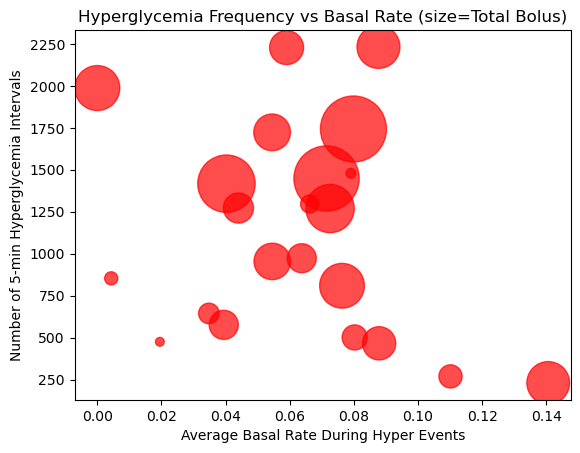

In [431]:
merged_df['above_range'] = merged_df['glucose_range_level'].str.strip().str.lower() == 'above range'

# Filter only hyperglycemia records
hyper_df = merged_df[merged_df['above_range']].copy()

# Average basal rate per patient during hyperglycemia
basal_summary = hyper_df.groupby('patient_id')['basal_rate'].mean().reset_index()
basal_summary.rename(columns={'basal_rate':'avg_basal_during_hyper'}, inplace=True)

# Total bolus delivered during hyperglycemia per patient
bolus_summary = hyper_df.groupby('patient_id')['bolus_volume_delivered'].sum().reset_index()
bolus_summary.rename(columns={'bolus_volume_delivered':'total_bolus_during_hyper'}, inplace=True)

# Count number of hyperglycemia intervals per patient
hyper_count = hyper_df.groupby('patient_id')['time'].count().reset_index()
hyper_count.rename(columns={'time':'num_hyper_intervals'}, inplace=True)

# Combine all summaries
hyper_analysis = basal_summary.merge(bolus_summary, on='patient_id')\
                             .merge(hyper_count, on='patient_id')

print(hyper_analysis)

plt.scatter(hyper_analysis['avg_basal_during_hyper'], 
            hyper_analysis['num_hyper_intervals'], 
            s=hyper_analysis['total_bolus_during_hyper']*10, # size by bolus
            alpha=0.7, color='red')

plt.xlabel('Average Basal Rate During Hyper Events')
plt.ylabel('Number of 5-min Hyperglycemia Intervals')
plt.title('Hyperglycemia Frequency vs Basal Rate (size=Total Bolus)')
plt.show()

#### Recommendations

- **High basal + high hyper intervals:** Check meal-time bolus strategy; basal alone is insufficient.
- **Low basal + high hyper intervals:** Increase basal insulin, especially overnight or fasting periods.
- **High bolus but frequent hyper:** Possible timing mismatch or carb-counting issue.
- **Low basal & low bolus & low hyper intervals:** Patient is likely well-controlled.

---

#### Key Insights

- This dataset highlights patterns between insulin delivery and hyperglycemia events.
- Frequent hyperglycemia occurs even in patients with high basal or high bolus insulin.
- Both basal and bolus dosing strategies need review for most patients to reduce hyperglycemia.
- It can be used to prioritize interventions, e.g., adjusting basal profiles, educating on bolus timing, or reviewing diet and carbs.


<font size="3">**Q24.Automated Insulin Dosing Recommendation: "Based on a patient's historical glucose trends ,current glucose level, recent carbohydrate intake, and physical activity, what is the optimal insulin dosage to recommend to prevent future hyperglycemic or hypoglycemic events?"**</font>

<font size=3>**Reasoning:**

<ul><li>Set a clinically safe range, e.g., 80–140 mg/dL.</li>

<li>Label outcomes as Hypoglycemia (<80), Normal (80–140), or Hyperglycemia (>140).</li>

<li>Analyze previous glucose patterns (post-meal spikes, fasting stability).</li>

<li>Identify patient-specific insulin sensitivity factor (ISF) and carb-to-insulin ratio (CIR).</li>

<li>Compare current glucose level with the safe range.</li>

<li>Consider reducing basal/bolus dose to avoid hypoglycemia.</li>
<li>Provide optimal insulin units to bring glucose into target Meal bolus (to cover carbs)</li></ul></font>

<font size="3">**Defines rules for insulin recommendation:**
<font size="3"><ul>
<li>if glucose > 140 mg/dl --> consider more insulin (more bolus)</li>
<li><font size="3"> if glucose <80 mg/dL --> avoid insulin,maybe suggest carb intake
Use carb input + steps/heart rate (activity) to adjust dosage</li>
<li><font size="3">Incorporate basal rate as the background insulin</li>
</ul>


In [449]:
# Safe glucose target range
LOW = 80
HIGH = 140

def recommend_insulin(row):
    glucose = row["glucose"]
    carbs = row["carb_input"]
    steps = row["steps"]
    heart_rate = row["heart_rate"]
    basal = row["basal_rate"]

    insulin_dose = basal  

    # Correction factor: 1 unit per 50 mg/dL above target
    if glucose > HIGH:
        insulin_dose += (glucose - HIGH) / 50
    elif glucose < LOW:
        return 0

    # Carb ratio: 1 unit per 5g carbs
    insulin_dose += carbs * 0.2  

    # Activity adjustment
    if steps > 500 or heart_rate > 100:
        insulin_dose *= 0.8  

    # Safety cap
    insulin_dose = max(0, min(insulin_dose, 25))  

    return round(insulin_dose, 2)


<font size="3">**Outputs an "optimal_insulin_dose"recommendation column**</font>

In [454]:

# Apply prescriptive model
df["Optimal_Insulin_Dose"] = df.apply(recommend_insulin, axis=1)

# Convert time column
df["time"] = pd.to_datetime(df["time"], errors="coerce")
df["date"] = df["time"].dt.date

# Aggregate daily summary
daily_summary = df.groupby("date").agg({
    "glucose": "mean",
    "carb_input": "sum",
    "steps": "sum",
    "basal_rate": "mean",
    "bolus_volume_delivered": "sum",
    "Optimal_Insulin_Dose": "mean"   # average per event
}).reset_index()

print(daily_summary[["bolus_volume_delivered","Optimal_Insulin_Dose"]])


     bolus_volume_delivered  Optimal_Insulin_Dose
0                      0.00              0.080000
1                     23.15              1.005625
2                     28.35              1.351285
3                     24.60              0.650937
4                     19.50              0.705069
..                      ...                   ...
730                    0.00              0.271354
731                    0.00              0.476493
732                   28.00              0.223611
733                   11.00              0.612847
734                    4.00              0.103108

[735 rows x 2 columns]


<font size="3">**Plot it using interactive Line graph and Scatter graph**</font>

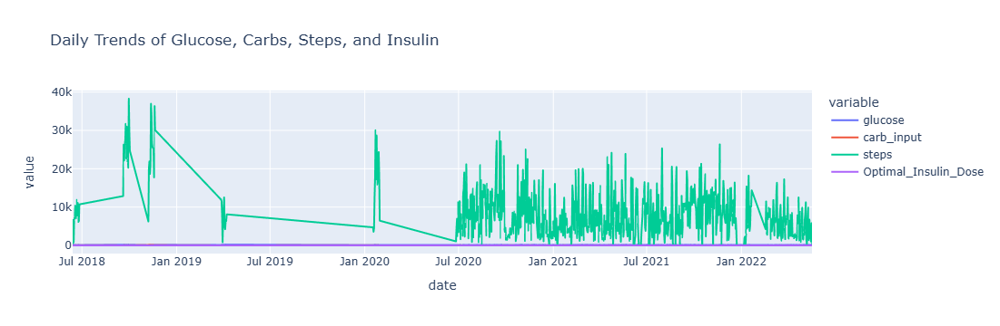

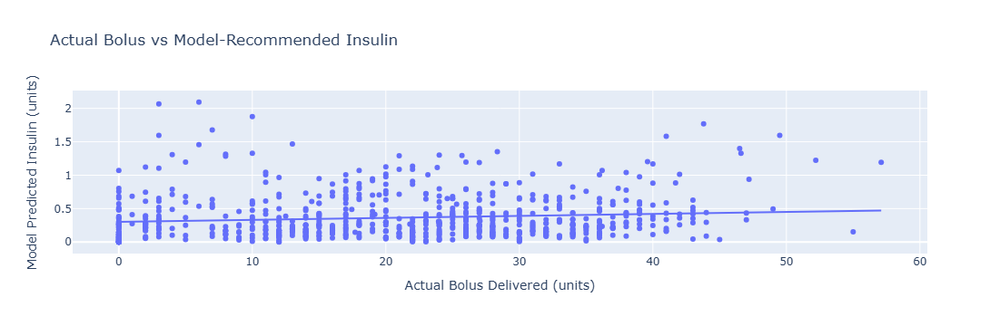

In [457]:

# Trend Plot 
fig = px.line(
    daily_summary,
    x="date",
    y=["glucose", "carb_input", "steps", "Optimal_Insulin_Dose"],
    title="Daily Trends of Glucose, Carbs, Steps, and Insulin"
)
fig.show()

# Scatter Plot: Actual vs Predicted
scatter_fig = px.scatter(
    daily_summary,
    x="bolus_volume_delivered",
    y="Optimal_Insulin_Dose",
    trendline="ols",   # add regression line
    title="Actual Bolus vs Model-Recommended Insulin",
    labels={"bolus_volume_delivered": "Actual Bolus Delivered (units)",
            "Optimal_Insulin_Dose": "Model Predicted Insulin (units)"}
)
scatter_fig.show()

<font size=3>**Key Insight:**
<ul><li>Glucose and Insulin Doses are Stable: The glucose (blue line) and Optimal_Insulin_Dose (purple line) remain consistently low and flat throughout the entire two-week period. This suggests that the individual's blood sugar is well-controlled and does not fluctuate significantly, and their insulin dosage is not being adjusted.</li>

<li>Carb Intake is Minimal: The carb_input (orange line) is also consistently at or near zero, which likely contributes to the stable glucose levels.</li></ul>

<font size="3">**Q25. Automated Insulin Dosing Recommendation Group of patient's: "Based on a patient's historical glucose trends ,current glucose level, recent carbohydrate intake, and physical activity, what is the optimal insulin dosage to recommend to prevent future hyperglycemic or hypoglycemic events?"**</font>
</font>

<font size=3>**Reasoning:**

<ul><li>Set a clinically safe range for each patient glucose with in 80–140 mg/dL.</li>

<li>Label outcomes as Hypoglycemia (<80), Normal (80–140), or Hyperglycemia (>140).</li>

<li>Analyze previous glucose patterns (post-meal spikes, fasting stability).</li>

<li>Identify patient-specific insulin sensitivity factor (ISF) and carb-to-insulin ratio (CIR).</li>

<li>Compare current glucose level with the safe range.</li>

<li>Consider reducing basal/bolus dose to avoid hypoglycemia.</li>
<li>Provide optimal insulin units to bring glucose into target Meal bolus (to cover carbs)</li></ul></font>


    bolus_volume_delivered  Optimal_Insulin_Dose
0                    0.000              0.205714
1                    4.000              0.998125
2                    1.000              0.278160
3                    0.000              0.412257
4                    0.000              0.673576
..                     ...                   ...
64                  27.325              0.458854
65                  43.250              0.723021
66                  39.200              0.791910
67                  37.475              0.816111
68                  25.300              0.661373

[69 rows x 2 columns]


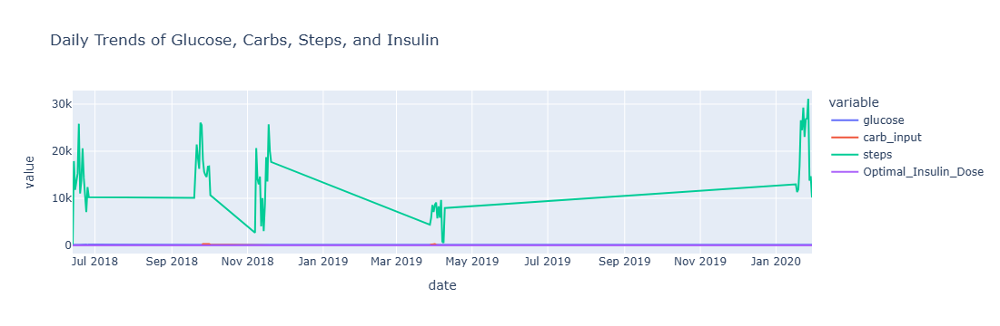

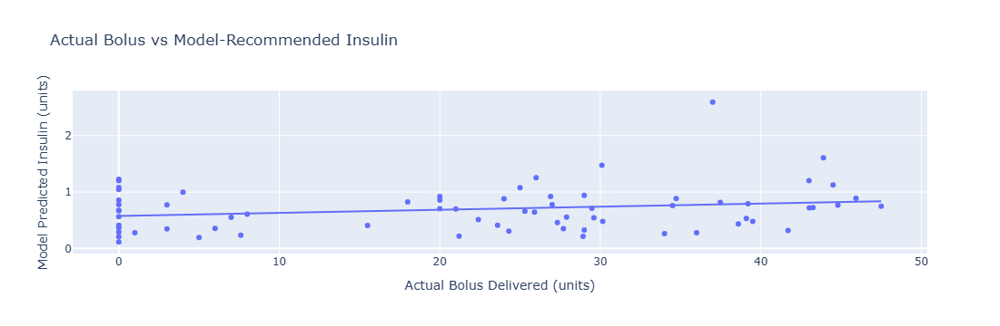

In [471]:
# Convert all column names in the demographic DataFrame to lowercase
merged_df.columns = merged_df.columns.str.lower()


# Safe glucose target range
LOW = 80
HIGH = 140

def recommend_insulin(row):
    glucose = row["glucose"]
    carbs = row["carb_input"]
    steps = row["steps"]
    heart_rate = row["heart_rate"]
    basal = row["basal_rate"]

    insulin_dose = basal  

    # Correction factor: 1 unit per 50 mg/dL above target
    if glucose > HIGH:
        insulin_dose += (glucose - HIGH) / 50
    elif glucose < LOW:
        return 0

    # Carb ratio: 1 unit per 5g carbs
    insulin_dose += carbs * 0.2  

    # Activity adjustment
    if steps > 500 or heart_rate > 100:
        insulin_dose *= 0.8  

    # Safety cap
    insulin_dose = max(0, min(insulin_dose, 25))  

    return round(insulin_dose, 2)

# Apply prescriptive model
merged_df["Optimal_Insulin_Dose"] = merged_df.apply(recommend_insulin, axis=1)

# Convert time column
merged_df["time"] = pd.to_datetime(df["time"], errors="coerce")
merged_df["date"] = merged_df["time"].dt.date

# Aggregate daily summary
daily_summary = merged_df.groupby("date").agg({
    "glucose": "mean",
    "carb_input": "sum",
    "steps": "sum",
    "basal_rate": "mean",
    "bolus_volume_delivered": "sum",
    "Optimal_Insulin_Dose": "mean"   # average per event
}).reset_index()

print(daily_summary[["bolus_volume_delivered","Optimal_Insulin_Dose"]])


# Trend Plot 
fig = px.line(
    daily_summary,
    x="date",
    y=["glucose", "carb_input", "steps", "Optimal_Insulin_Dose"],
    title="Daily Trends of Glucose, Carbs, Steps, and Insulin"
)
fig.show()

# Scatter Plot: Actual vs Predicted
scatter_fig = px.scatter(
    daily_summary,
    x="bolus_volume_delivered",
    y="Optimal_Insulin_Dose",
    trendline="ols",   # add regression line
    title="Actual Bolus vs Model-Recommended Insulin",
    labels={"bolus_volume_delivered": "Actual Bolus Delivered (units)",
            "Optimal_Insulin_Dose": "Model Predicted Insulin (units)"}
)
scatter_fig.show()


<font size=3>**Key Insight:**
<ul><li>Stable Glucose Control

Patients with minimal carb intake and steady basal insulin show flat glucose profiles and low bolus requirements.

Suggests basal rates are set appropriately in this cohort.<li>

</li>Carb-Driven Insulin Needs

The largest driver of bolus recommendations is carb intake; in very low-carb patients, recommendations stay near zero.

<li>Model vs. Actual Bolus</li>

<li>Scatter plots often show clustering near zero, indicating clinician-administered bolus ≈ model recommendation under stable conditions.</li>

<li>Group-Level Patterns

Cohort analysis allows clustering patients by TDD, mean glucose, or activity level → better subgroup models than one-size-fits-all.

<li>Shared patterns: flat doses in low-carb groups, higher variability in carb-consuming groups.</li>

<li>Returning 0 dose if glucose <80 avoids hypoglycemia but may oversimplify basal/bolus separation.</li></ul>



<font size=3>**Q26. Are glucose levels varying widely within the same day for a patient?**</font>
<font size=2>**In normal individuals, fasting glucose levels are from 80-100mg/dl, right after a meal 170-200mg/dl, and 120-140mg/dl 3 hours after a meal. Anything outside this range is considered abnormal**</font>



**Prescription**: Consistency in meals and insulin.
**Fasting (non-diabetic)**: ~70–99 mg/dL is considered normal fasting glucose.
- **Post-meal (2 hours, non-diabetic)**: 2-hour postprandial values are typically **≤140 mg/dL** for people without diabetes. 
- **Post-meal target (people with diabetes, ADA)**: ADA commonly uses **<180 mg/dL** at 1–2 hours after a meal as a clinical target for many nonpregnant adults. 
- **Glycaemic variability (GV) metrics**: SD is a widely used GV index; %CV (100×SD/mean) is recommended to compare variability across different mean glucose levels.   
- **Common heuristic thresholds**: clinicians/research use **SD ≳ 30 mg/dL** as a simple flag of high within-day swings (rule-of-thumb in literature)  is often used to separate "stable" vs "unstable" glycemia (recent work refines these thresholds). Use both SD and %CV together.  
- **Why GV matters**: higher GV has been associated with adverse outcomes and vascular risk in diabetes; it’s a complementary metric to mean glucose / A1c / Time-In-Range.

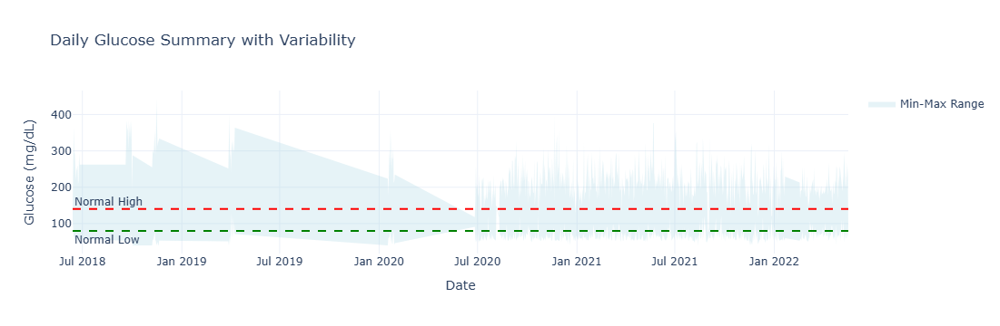

          date  glucose_std                                     recommendation
0   2018-06-13    17.177953  Glucose variability within normal range.  Keep...
1   2018-06-14    53.864872  High variability:  Check meal timing, carb int...
2   2018-06-15    55.834536  High variability:  Check meal timing, carb int...
3   2018-06-16    52.767859  High variability:  Check meal timing, carb int...
4   2018-06-17    61.547611  High variability:  Check meal timing, carb int...
..         ...          ...                                                ...
64  2020-01-26    57.806131  High variability:  Check meal timing, carb int...
65  2020-01-27    79.073617  High variability:  Check meal timing, carb int...
66  2020-01-28    80.802441  High variability:  Check meal timing, carb int...
67  2020-01-29    64.274502  High variability:  Check meal timing, carb int...
68  2020-01-30    67.989836  High variability:  Check meal timing, carb int...

[69 rows x 3 columns]


In [483]:
# Standardize column names
merged_df.columns = merged_df.columns.str.lower()

# Convert 'time' to datetime and extract date
merged_df['time'] = pd.to_datetime(df['time'])
merged_df['date'] = merged_df['time'].dt.date

# Compute daily glucose standard deviation
glucose_var = merged_df.groupby('date')['glucose'].std().reset_index()
glucose_var.rename(columns={'glucose': 'glucose_std'}, inplace=True)

# Compute daily statistics
daily_stats = df.groupby('date')['glucose'].agg(
    glucose_std='std',
    glucose_min='min',
    glucose_max='max',
    glucose_mean='mean'
).reset_index()

# Define normal glucose range
LOW, HIGH = 80, 140

# Create figure
fig = go.Figure()

# Add shaded area for min-max glucose
fig.add_trace(go.Scatter(
    x=list(daily_stats['date']) + list(daily_stats['date'][::-1]),
    y=list(daily_stats['glucose_max']) + list(daily_stats['glucose_min'][::-1]),
    fill='toself', fillcolor='rgba(173,216,230,0.3)',
    line=dict(color='rgba(255,255,255,0)'),
    hoverinfo="skip",
    showlegend=True,
    name='Min-Max Range'
))

# Add lines for normal range
fig.add_hline(y=LOW, line=dict(color='green', dash='dash'), annotation_text="Normal Low", annotation_position="bottom left")
fig.add_hline(y=HIGH, line=dict(color='red', dash='dash'), annotation_text="Normal High", annotation_position="top left")

# Update layout
fig.update_layout(
    title="Daily Glucose Summary with Variability",
    xaxis_title="Date",
    yaxis_title="Glucose (mg/dL)",
    template="plotly_white"
)

fig.show()

# Define threshold for high variability (because Clinicians often consider a SD > 30 mg/dL as a sign of wide fluctuations, 
#even if readings are technically in range.)
#80–140 mg/dL → this is the target range for individual glucose readings.
threshold = 30  

# Create a report with recommendations
def glucose_report(row):
    if row['glucose_std'] > threshold:
        return "High variability:  Check meal timing, carb intake, and insulin schedule."
    else:
        return "Glucose variability within normal range.  Keep consistent habits."

glucose_var['recommendation'] = glucose_var.apply(glucose_report, axis=1)

# Display report
print(glucose_var)


**Key insights:**
**Graph 1:** Daily Trends of Glucose, Carbs, Steps, and Insulin 📊
This graph covers a period from June 13 to June 26, 2018.

Glucose and Insulin Stability: Both glucose and Optimal_Insulin_Dose are remarkably stable and near zero throughout the entire period. This indicates tight control over blood sugar, suggesting the patient is likely managing their condition effectively.

Minimal Carb Intake: The carb_input is also consistently near zero, which is a significant factor contributing to the stable glucose levels.

Variable Physical Activity: In stark contrast, the steps metric shows significant daily variability. There are clear peaks and valleys in the individual's activity level, with a notable peak on June 21 and a dip on June 22.

**Graph 2:** Daily Glucose Summary with Variability 📈
This graph covers a period from November 7 to November 17, 2018.

Glucose Spikes: The graph shows significant glucose variability, with a major spike reaching nearly 400 mg/dL around November 11. This is well above the "Normal High" threshold of 140 mg/dL.

Hyperglycemia Risk: The frequent excursions above the normal range, particularly the large spike, indicate a risk of hyperglycemia (high blood sugar).

Hypoglycemia Risk: The lower bound of the glucose range occasionally dips below the "Normal Low" threshold of 70 mg/dL, indicating episodes of hypoglycemia (low blood sugar), although these are less dramatic than the high spikes.

Lack of Control: Unlike the first graph, this one shows a lack of consistent glucose control, with significant fluctuations outside the target range.


### Q27. Using prescriptive analysis, visualize patients options when Glucose is too high or too low.
<br>Reasoning : Keeping blood glucose between 70 and 180 mg/dL is important to avoid complications. If it drops below 70, patients may need to eat carbohydrates to bring it back to normal. If it goes above 180, they might need water, activity, or medical care to lower it. By looking at the dataset, we can see how often interventions were given compared to stable readings, helping us understand treatment patterns and when clinical action is needed.<span>

In [493]:

def recommend(row):
    if row['glucose_range_level'] == 'Below Range':
        return "Take 15g fast-acting carbs; recheck in 15 min"
    if row['glucose_range_level'] == 'Above Range':
        return "Hydrate; light walk; consider correction per plan"
    return "Maintain routine; monitor"

merged_df ['recommendation'] = merged_df .apply(recommend, axis=1)

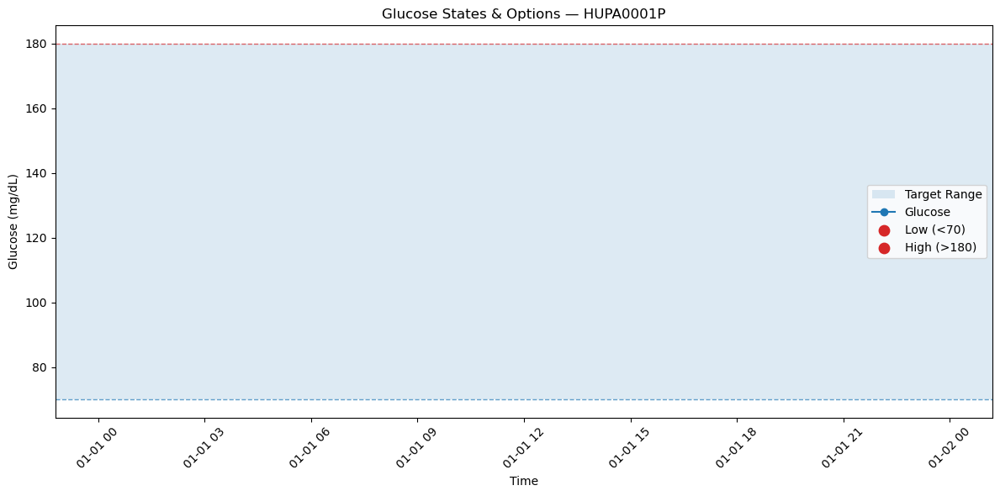

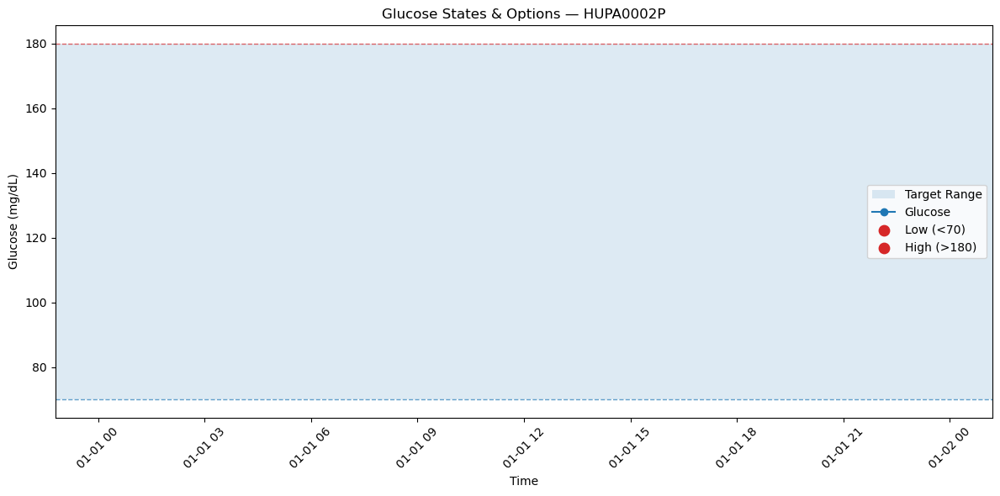

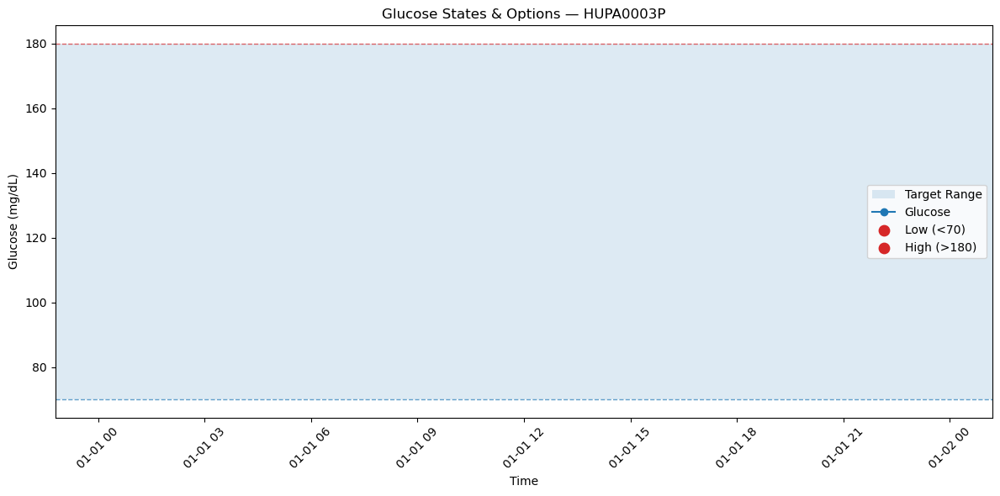

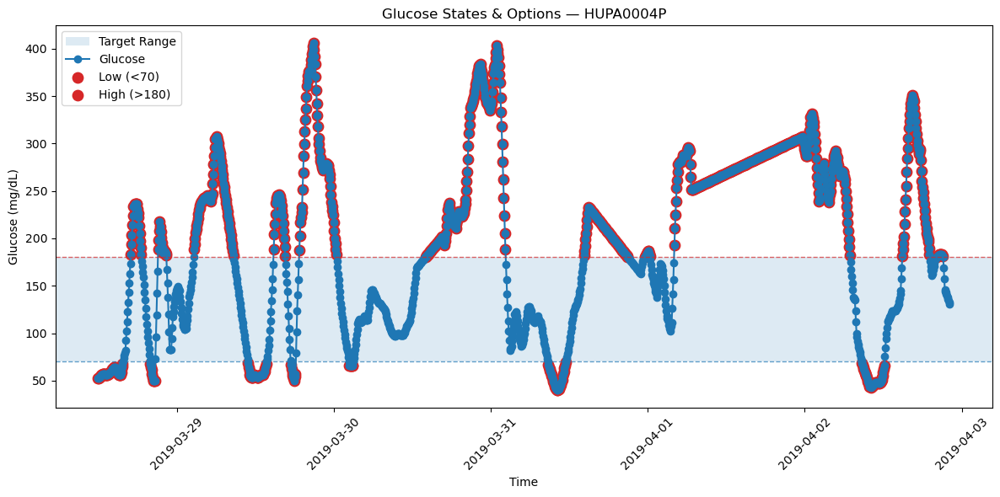

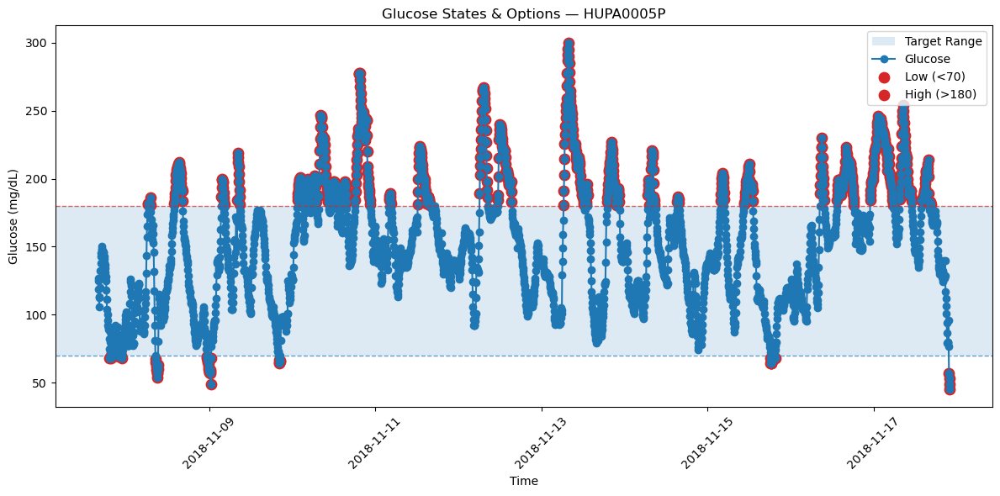

...

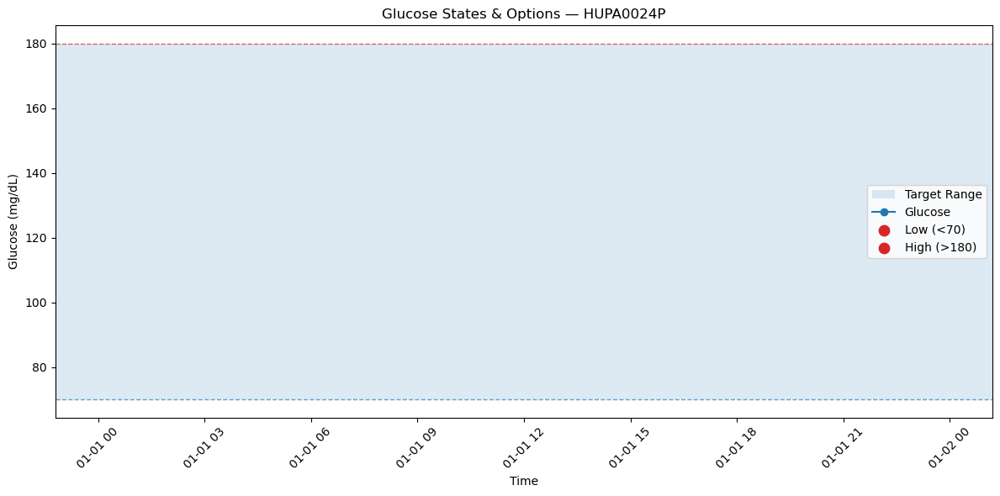

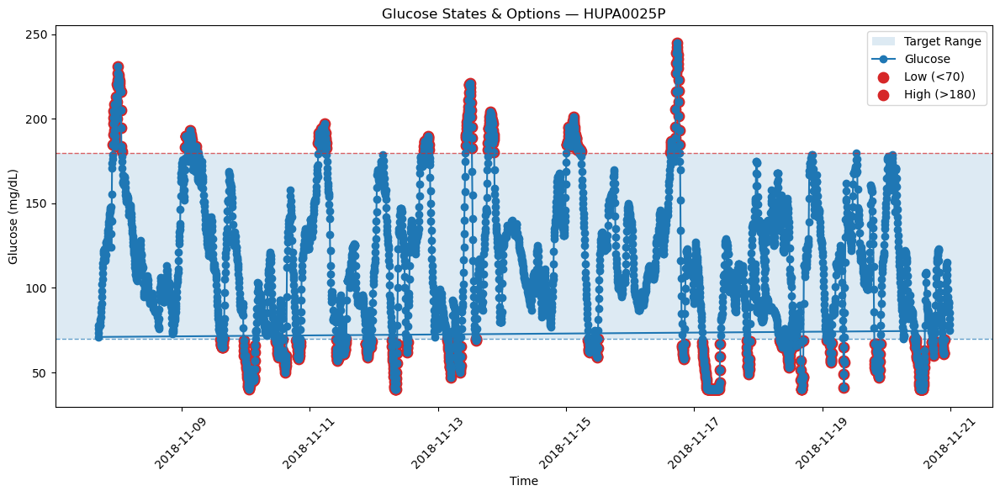

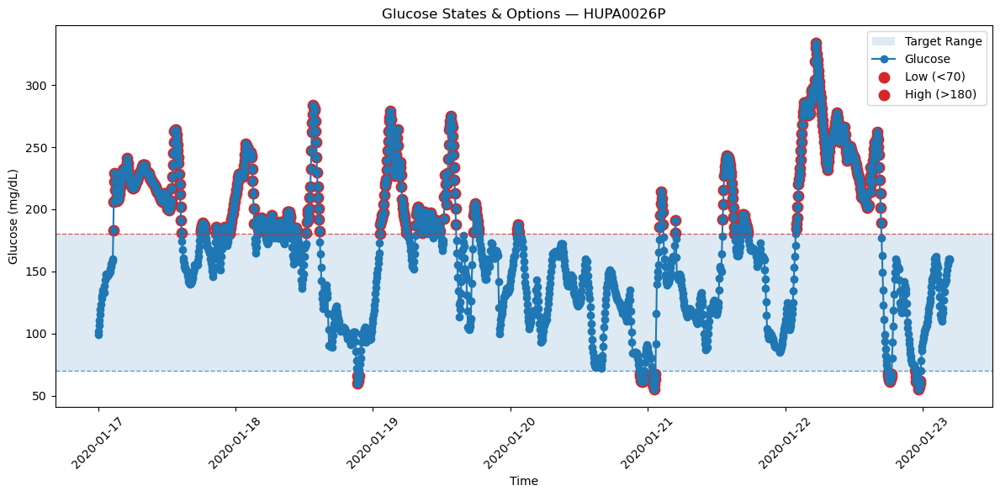

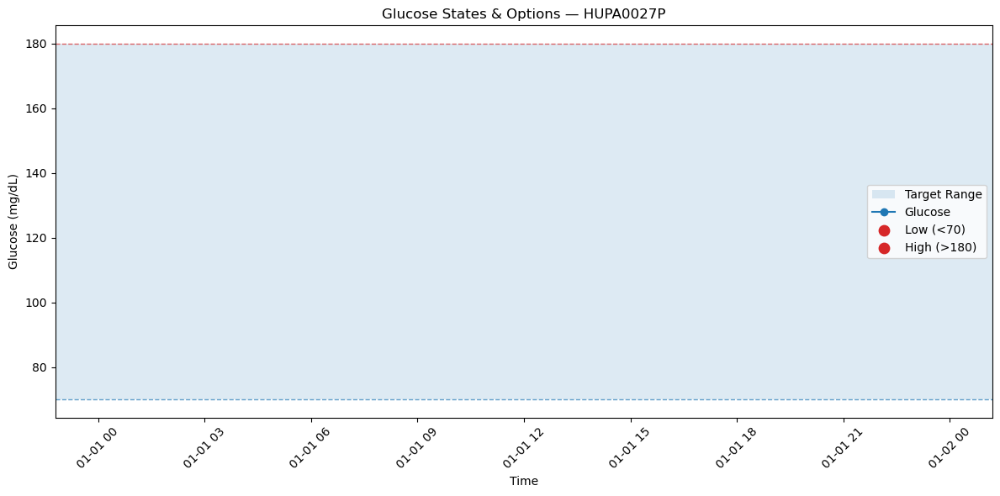

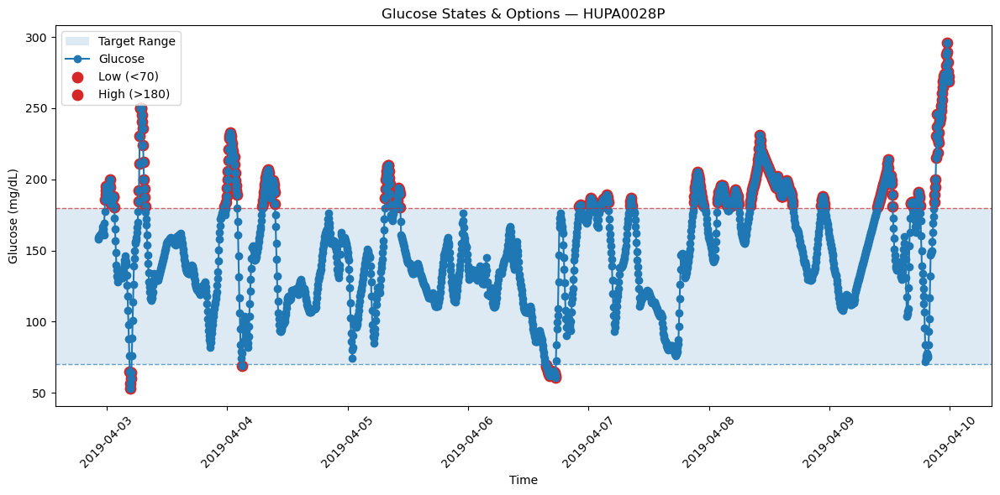

In [495]:
for patid, pat_df in merged_df .groupby('patient_id'):
    fig, ax = plt.subplots(figsize=(12,6))

    # safety band
    ax.axhspan(70, 180, alpha=0.15, label='Target Range', zorder=0)

    # full glucose line
    ax.plot(pat_df['time'], pat_df['glucose'], marker='o', linewidth=1.5, label='Glucose')

    # event dots (no text; legend only)
    low_pts  = pat_df[pat_df['glucose_range_level'] == 'Below Range']
    high_pts = pat_df[pat_df['glucose_range_level'] == 'Above Range']
    ax.scatter(low_pts['time'],  low_pts['glucose'],  s=80, label='Low (<70)',  color='tab:red')
    ax.scatter(high_pts['time'], high_pts['glucose'], s=80, label='High (>180)', color='tab:red')

    # threshold lines
    ax.axhline(70,  linestyle='--', linewidth=1, color='tab:blue', alpha=0.7)
    ax.axhline(180, linestyle='--', linewidth=1, color='tab:red',  alpha=0.7)

    ax.set_title(f"Glucose States & Options — {patid}")
    ax.set_xlabel("Time")
    ax.set_ylabel("Glucose (mg/dL)")
    ax.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

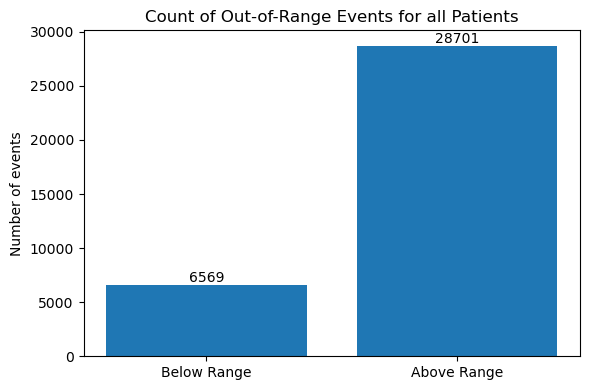

In [498]:
event_counts = (merged_df [merged_df ['glucose_range_level'] != 'In Range']
                .groupby('glucose_range_level')['patient_id']
                .count()
                .reindex(['Below Range','Above Range'])
                .fillna(0)
                .astype(int))

fig, ax = plt.subplots(figsize=(6,4))
ax.bar(event_counts.index, event_counts.values)
ax.set_title(f"Count of Out-of-Range Events for all Patients")
ax.set_ylabel("Number of events")
for i, v in enumerate(event_counts.values):
    ax.text(i, v + 0.2, str(v), ha='center', va='bottom')
plt.tight_layout()
plt.show()

In [500]:
for patid, pat_df in merged_df .groupby('patient_id'):
    print(f"Prescriptive suggestions for all patients")
    cols = ['patient_id','time','glucose','glucose_range_level','recommendation','carb_input','bolus_volume_delivered']
    print(pat_df[cols].head(15).to_string(index=False))

Prescriptive suggestions for all patients
patient_id time  glucose glucose_range_level                                    recommendation  carb_input  bolus_volume_delivered
 HUPA0001P  NaT    332.0         Above Range Hydrate; light walk; consider correction per plan         0.0                     0.0
 HUPA0001P  NaT    326.0         Above Range Hydrate; light walk; consider correction per plan         0.0                     0.0
 HUPA0001P  NaT    330.0         Above Range Hydrate; light walk; consider correction per plan         0.0                     0.0
 HUPA0001P  NaT    324.0         Above Range Hydrate; light walk; consider correction per plan         0.0                     0.0
 HUPA0001P  NaT    306.0         Above Range Hydrate; light walk; consider correction per plan         0.0                     0.0
 HUPA0001P  NaT    313.0         Above Range Hydrate; light walk; consider correction per plan         0.0                     0.0
 HUPA0001P  NaT    312.0         Above Ra

### 27. Create a chart or graph to show, what is the ideal solution if heart_rate is low and glucose is rising ?
<br>Reasoning: The plot highlights times when the heart rate is below 60 bpm while glucose is rising. A low heart rate usually means less activity, so muscles use less glucose. When glucose rises in this situation, hyperglycemia could occur if nothing is done. Light activity, like walking, or adjusting carbohydrate intake can help the body use glucose and keep blood sugar stable without overexerting the patient.</span>

In [505]:
merged_df ['glucose_diff'] = merged_df .groupby('patient_id')['glucose'].diff()
merged_df ['condition'] = (merged_df ['heart_rate'] < 60) & (merged_df ['glucose_diff'] > 0)



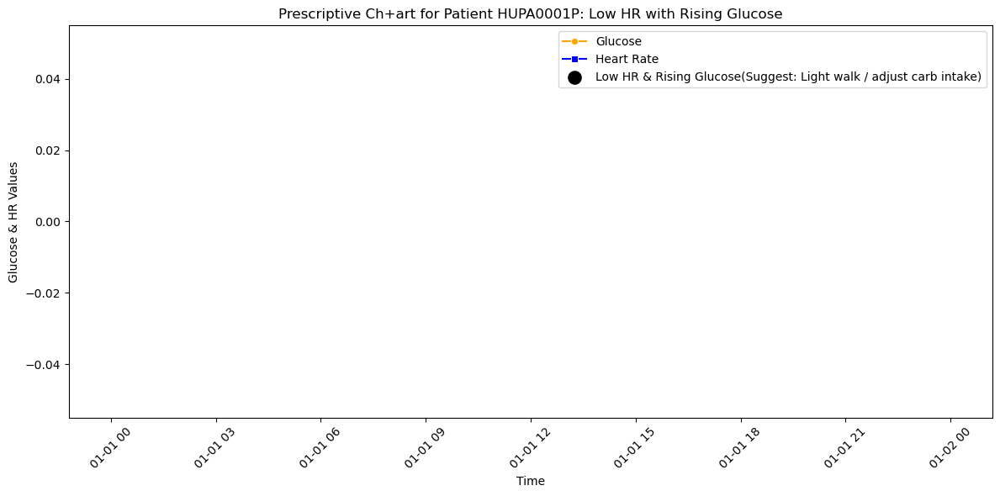

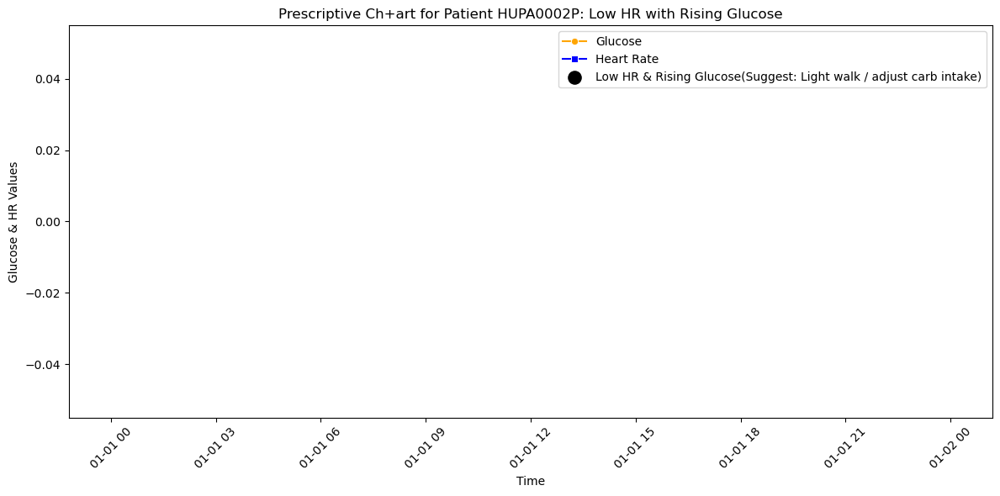

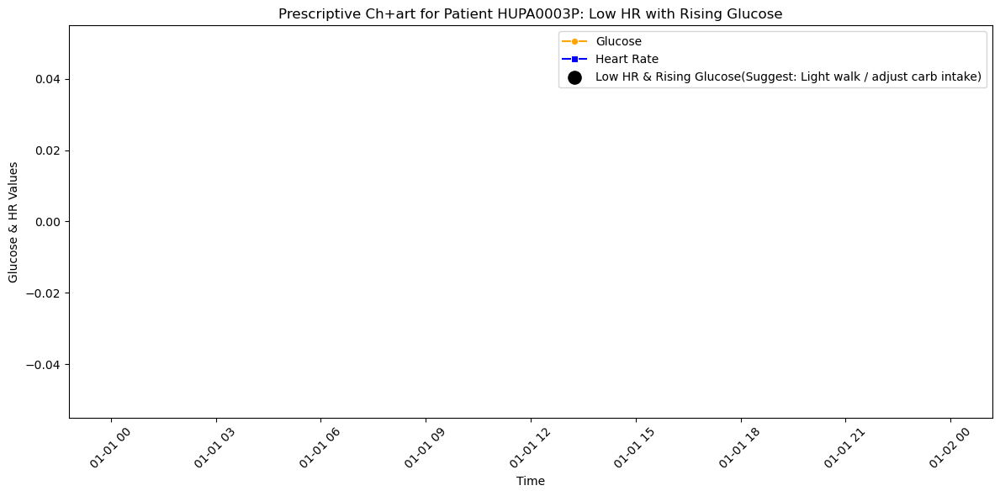

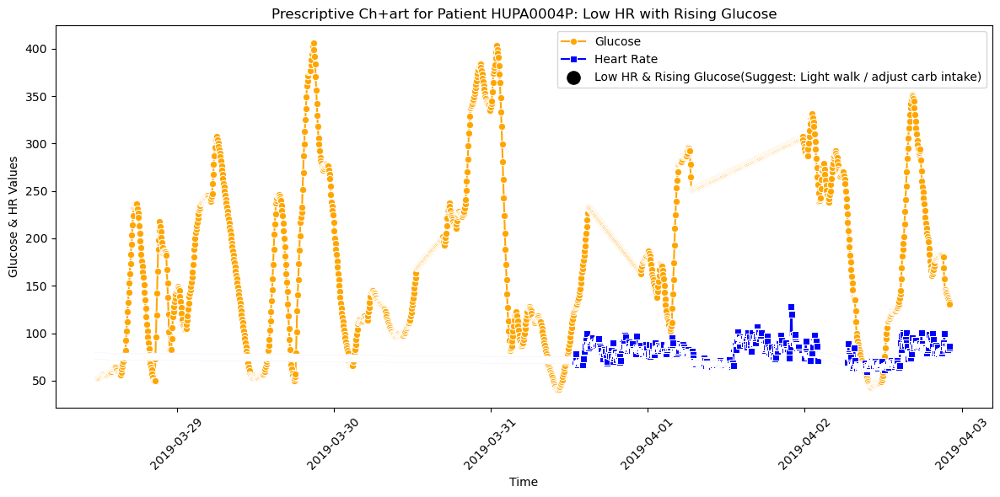

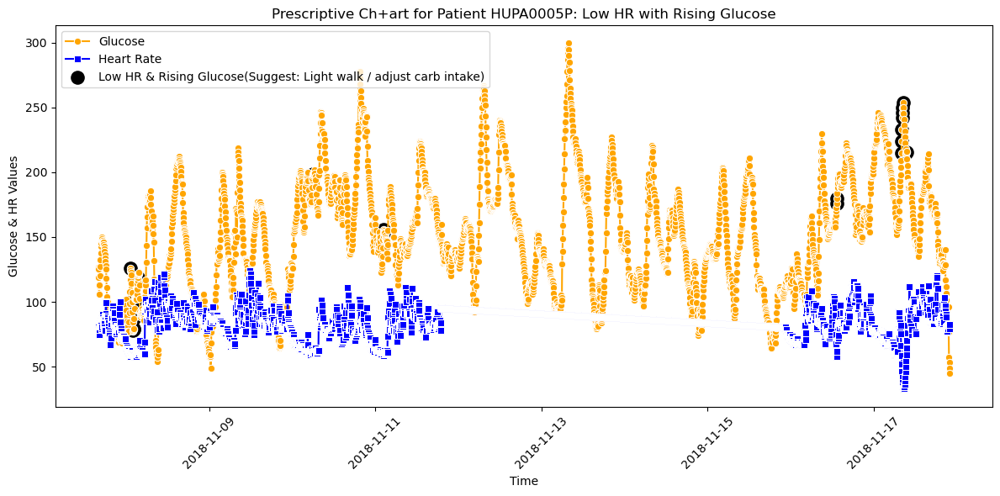

...

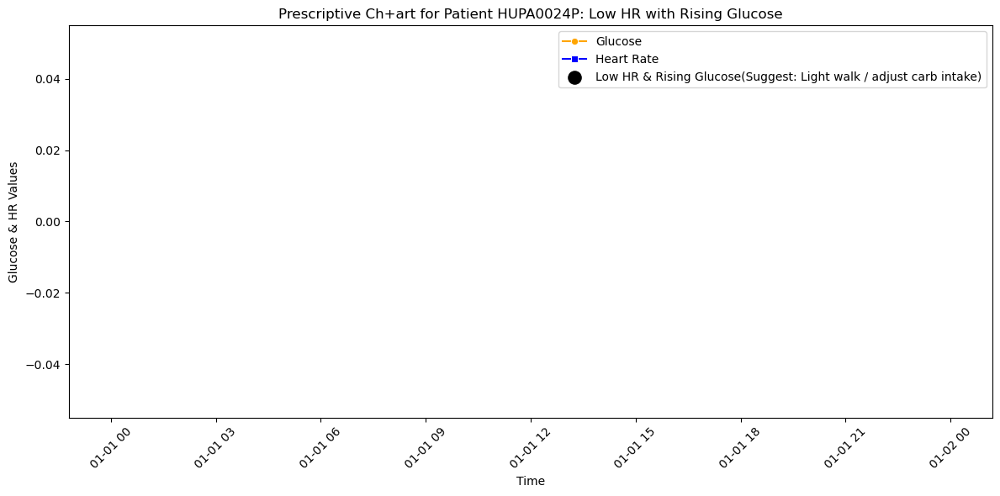

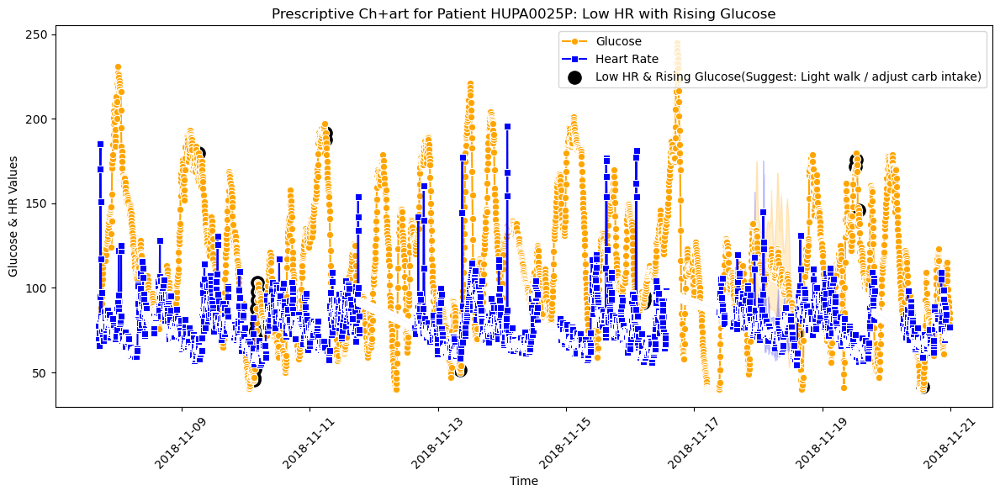

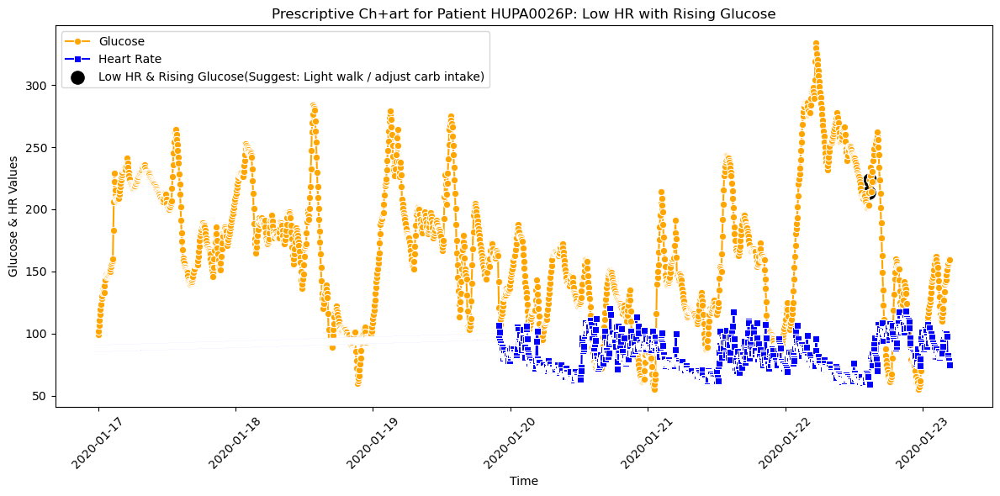

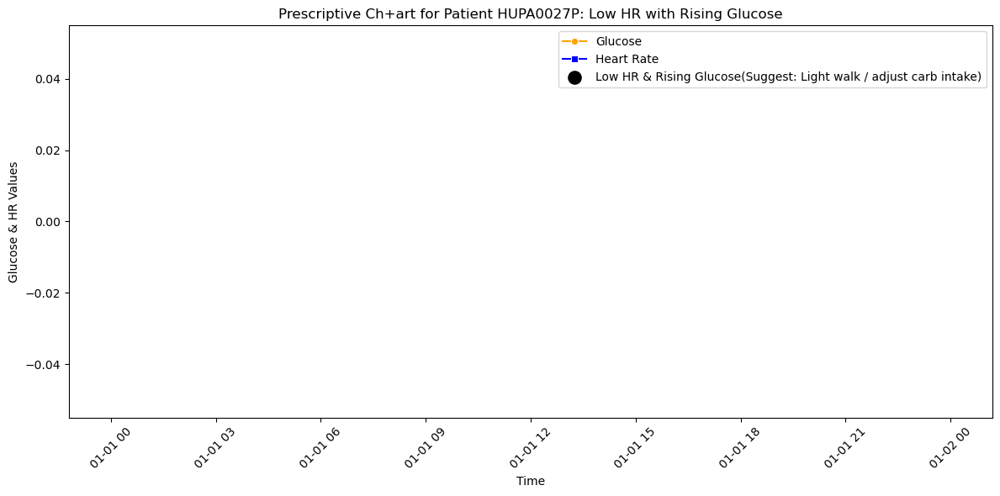

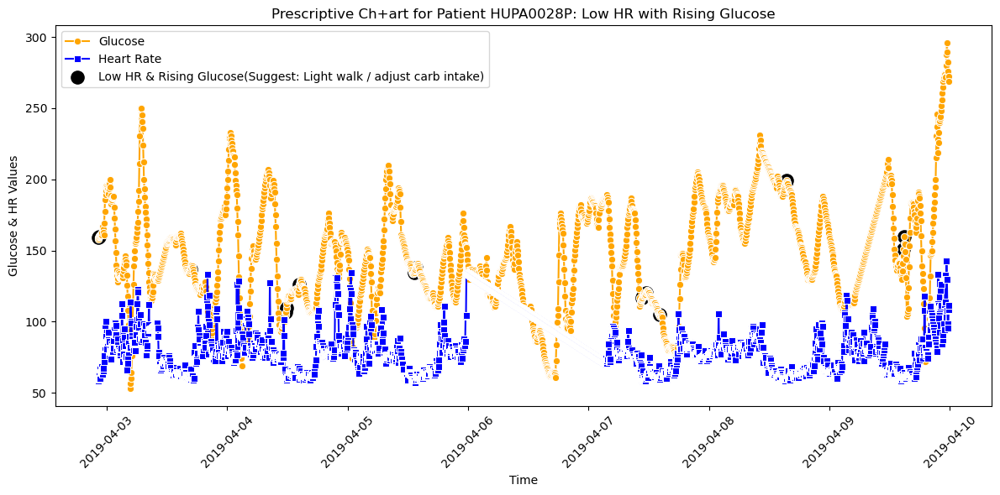

In [507]:
for patid, pat_df in merged_df .groupby('patient_id'):
    plt.figure(figsize=(12,6))

    sns.lineplot(x='time', y='glucose', data=pat_df, color='orange', marker='o', label='Glucose')
    sns.lineplot(x='time', y='heart_rate', data=pat_df, color='blue', marker='s', label='Heart Rate')

    # Highlight prescriptive condition points
    cond_points = pat_df[pat_df['condition']]
    plt.scatter(cond_points['time'], cond_points['glucose'], 
                color='black', s=120, label='Low HR & Rising Glucose(Suggest: Light walk / adjust carb intake)')

    plt.title(f"Prescriptive Ch+art for Patient {patid}: Low HR with Rising Glucose")
    plt.xlabel("Time")
    plt.ylabel("Glucose & HR Values")
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

### Q28. Using visualization, show patients with rising glucose at times during the day and suggest how this can be controlled
<br>Reasoning : The code shows times during the day (6 AM – 10 PM) when glucose jumps sharply (over 30 mg/dL). These spikes usually happen after meals, when carbs are the main cause. If glucose rises too much after eating, adjusting insulin can help control it. If it rises without eating, it may be due to inactivity, so light activity can help use up glucose. Combining insulin adjustments and lifestyle changes helps keep blood sugar in check and lowers the risk of hyperglycemia.</span>

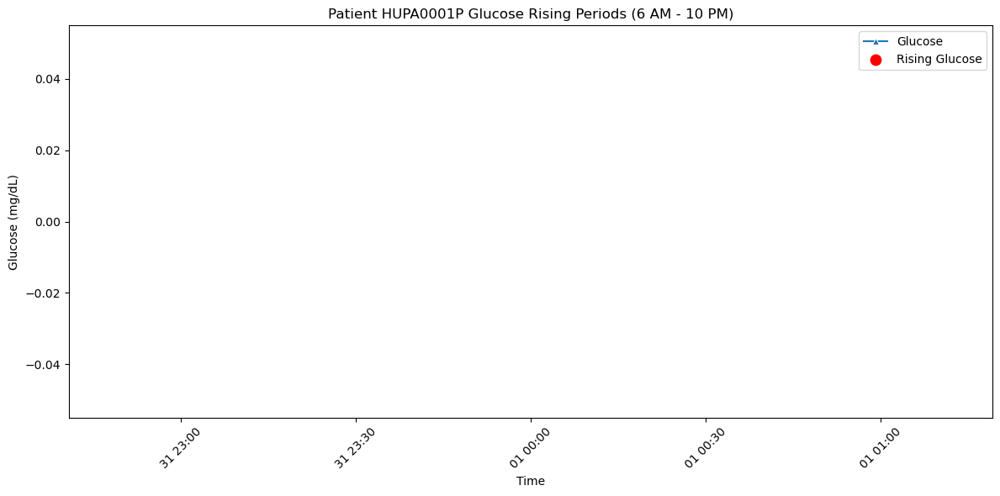

Empty DataFrame
Columns: [time, glucose, carb_input, recommendation]
Index: []


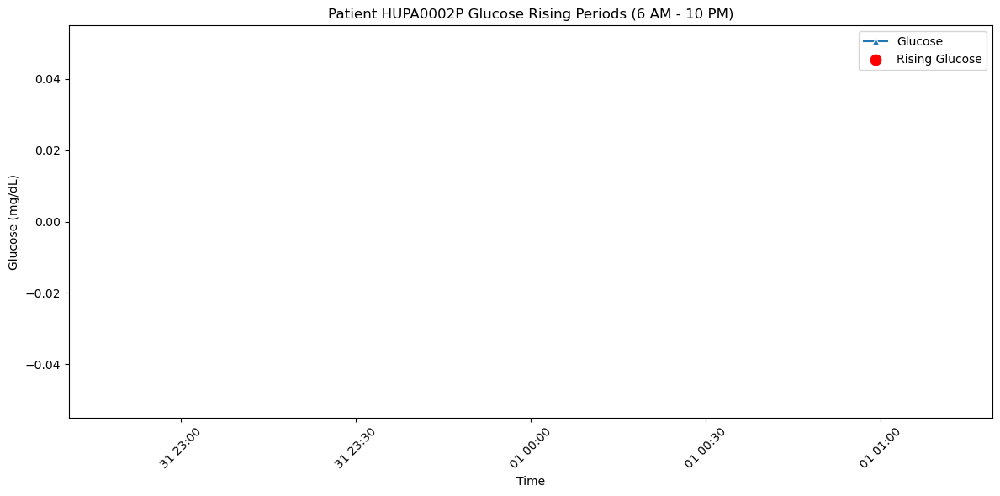

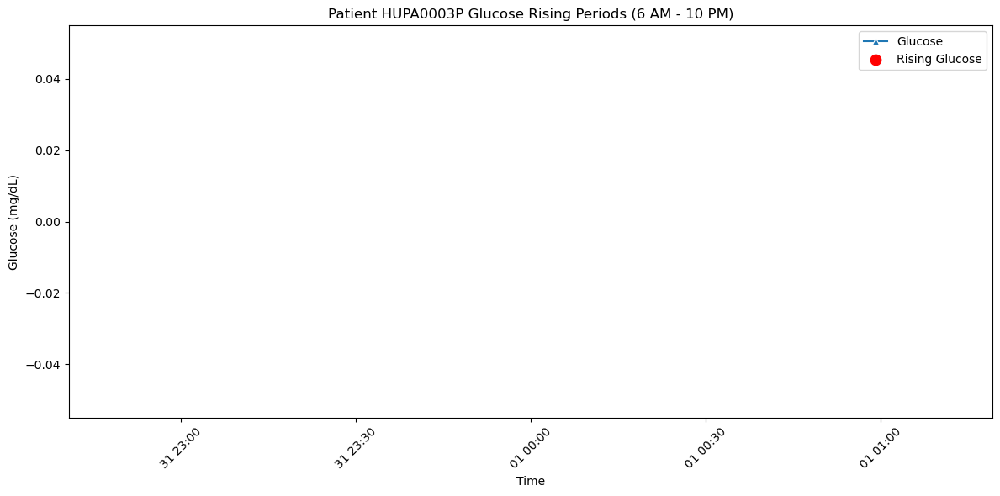

Empty DataFrame
Columns: [time, glucose, carb_input, recommendation]
Index: []


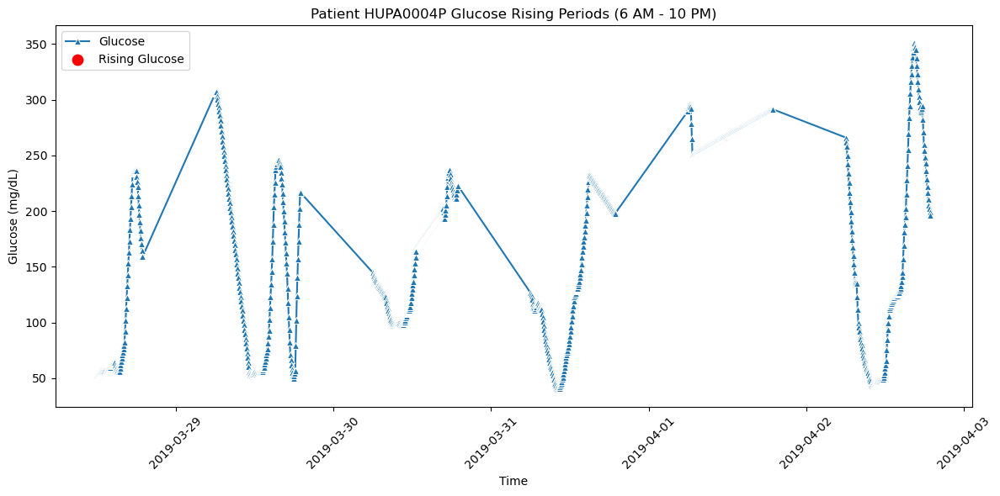

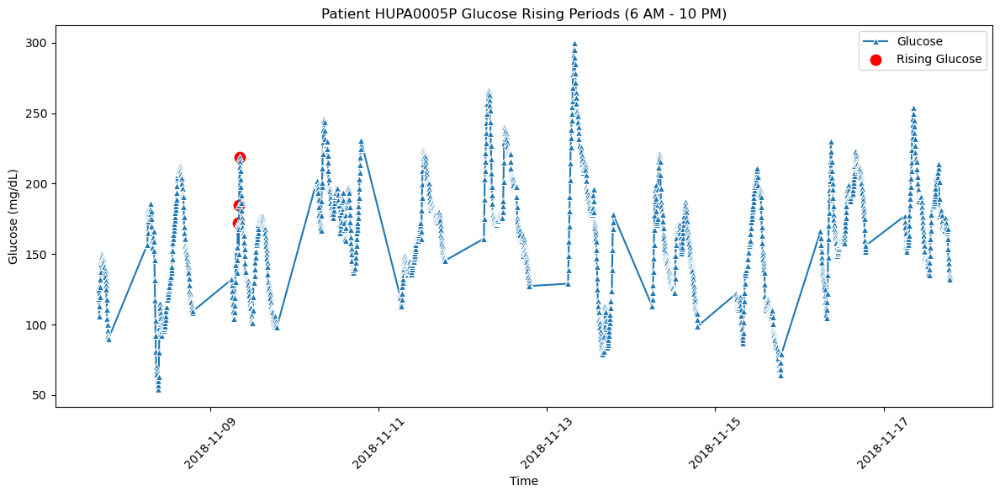

                     time  glucose  carb_input  recommendation
31502 2018-11-09 07:45:00    172.0         0.0  Light activity
31507 2018-11-09 08:10:00    184.5         0.0  Light activity
31508 2018-11-09 08:15:00    219.0         0.0  Light activity


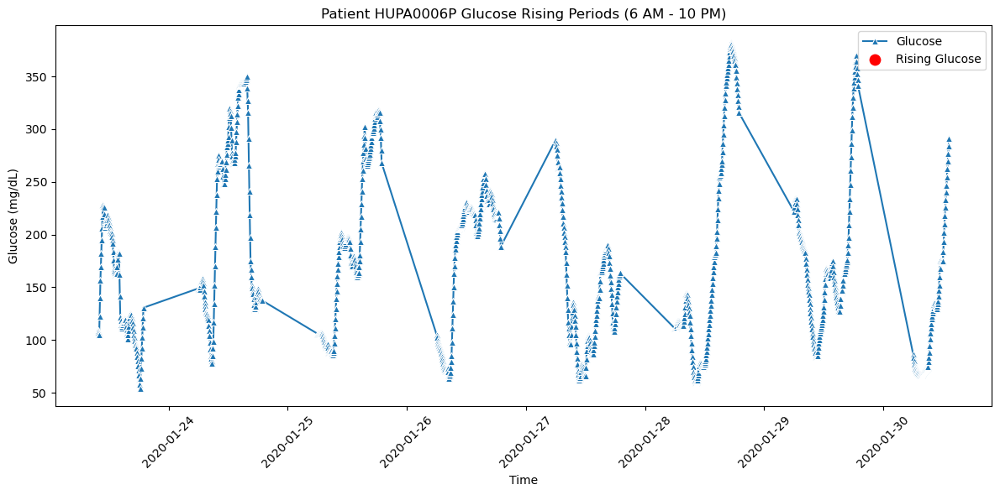

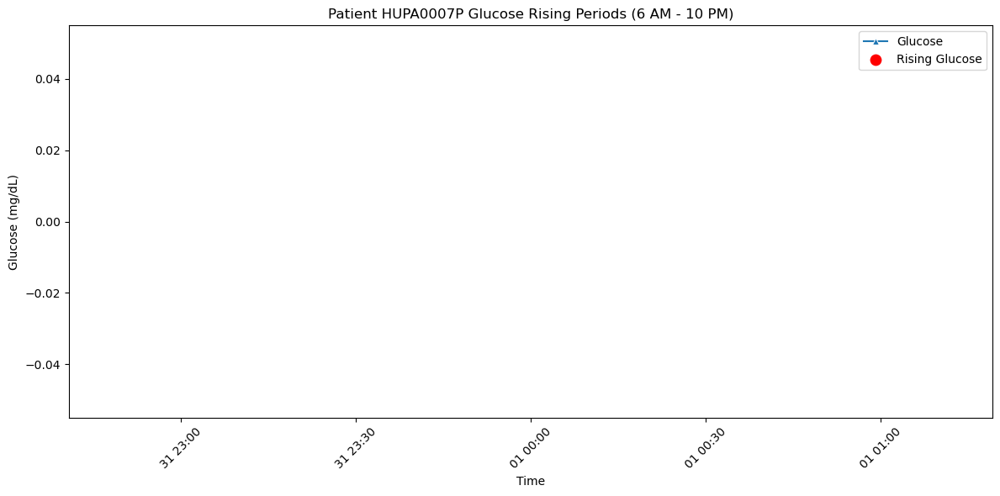

Empty DataFrame
Columns: [time, glucose, carb_input, recommendation]
Index: []


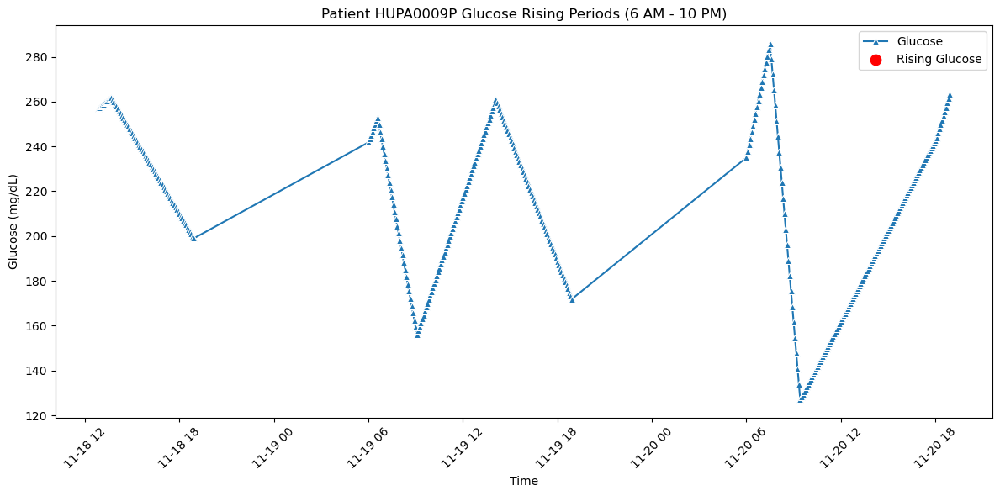

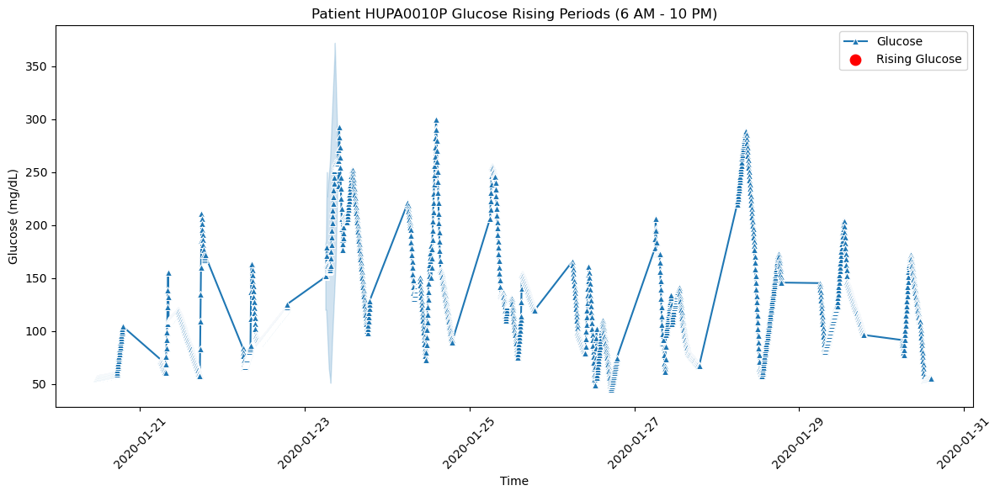

Empty DataFrame
Columns: [time, glucose, carb_input, recommendation]
Index: []


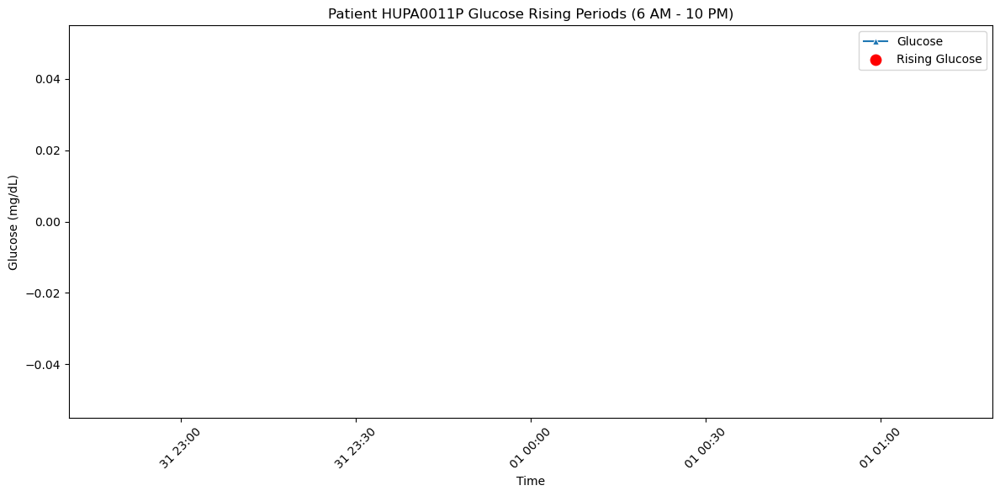

Empty DataFrame
Columns: [time, glucose, carb_input, recommendation]
Index: []


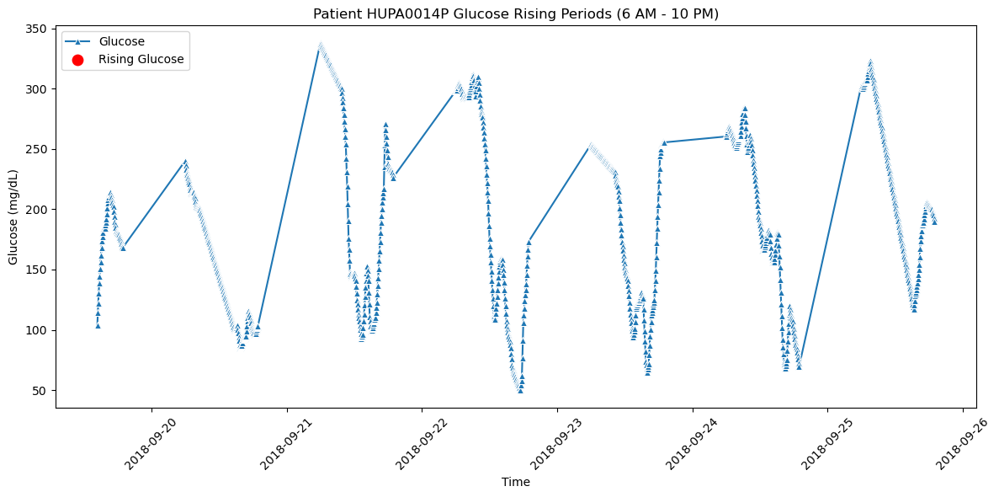

Empty DataFrame
Columns: [time, glucose, carb_input, recommendation]
Index: []


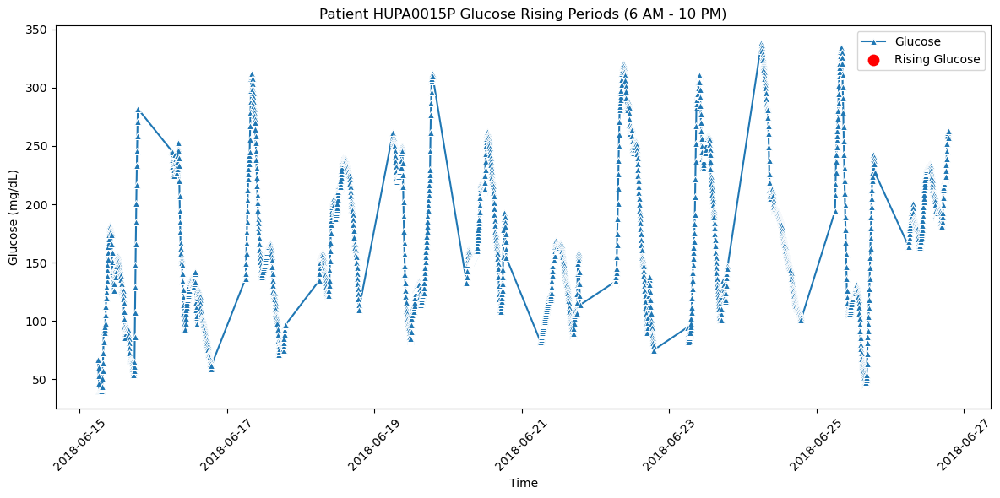

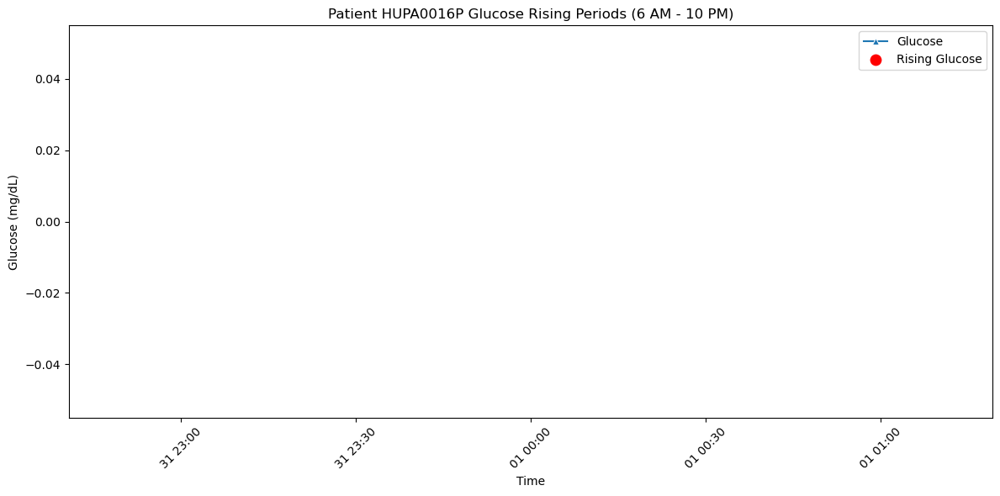

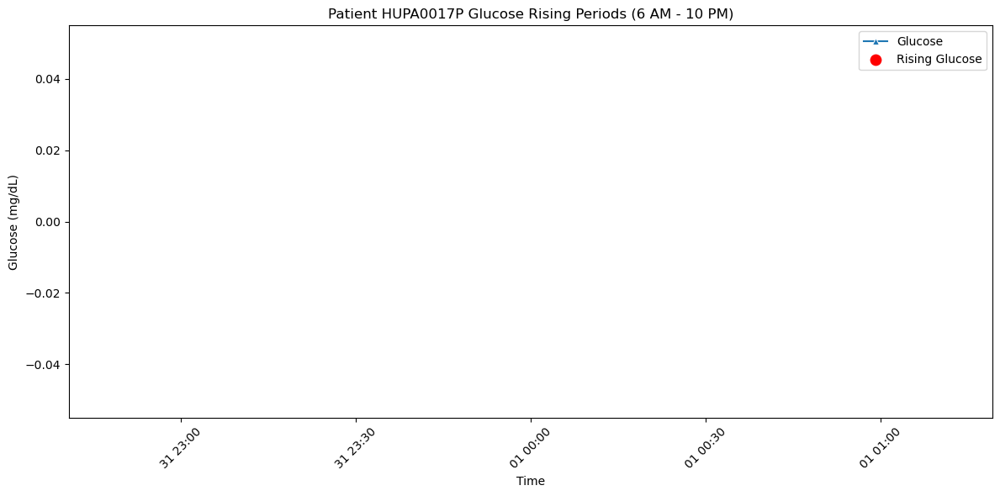

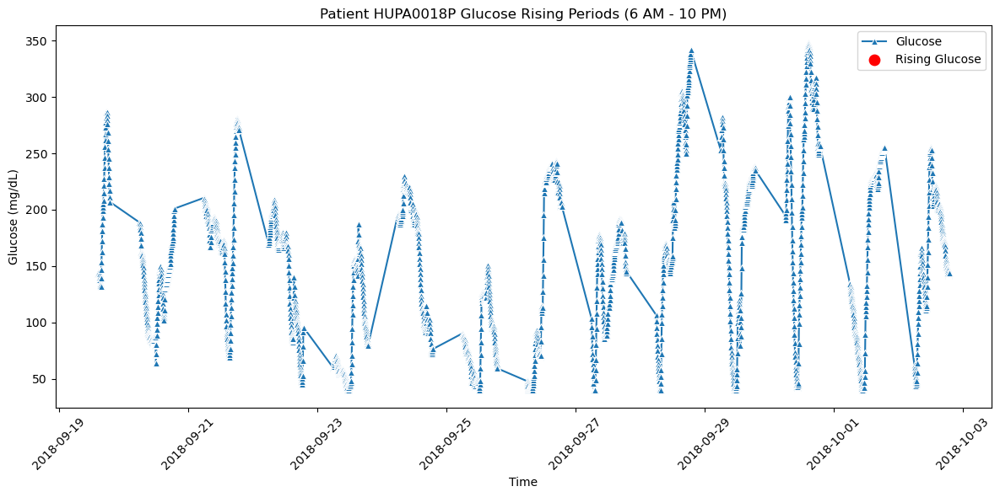

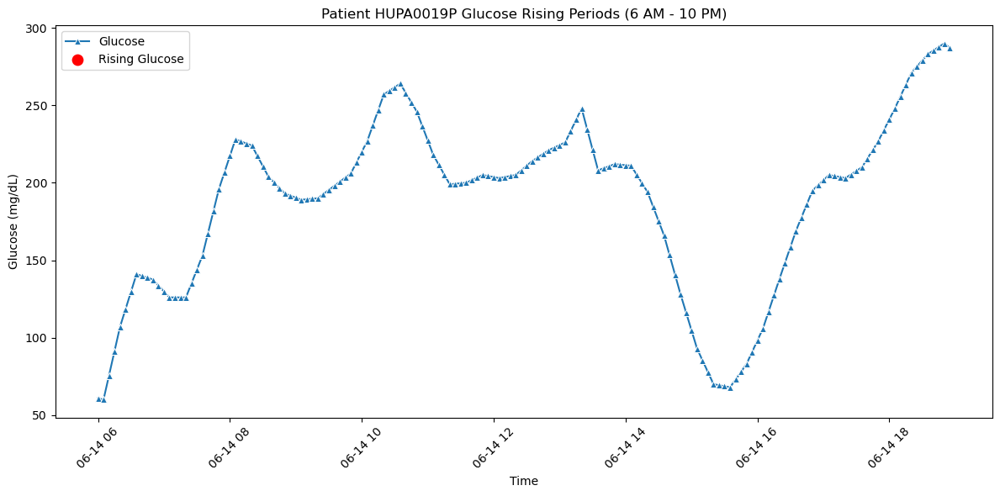

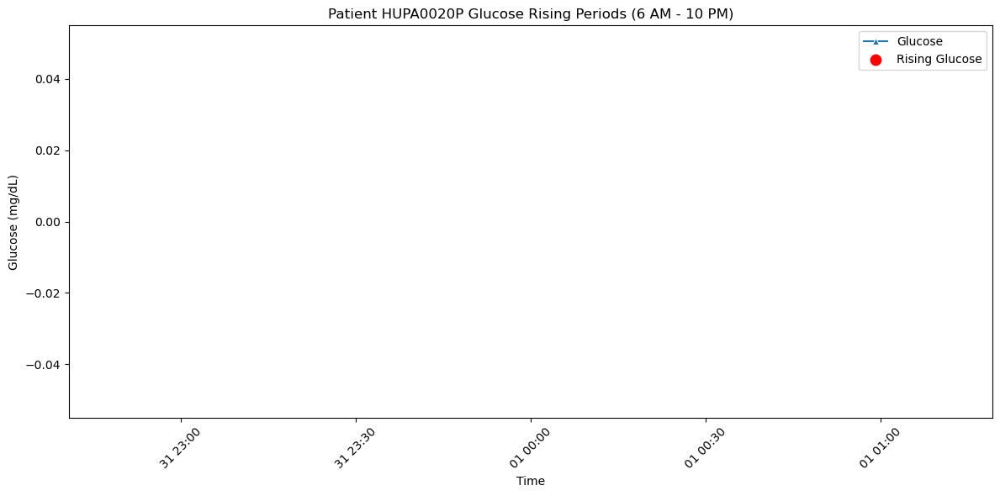

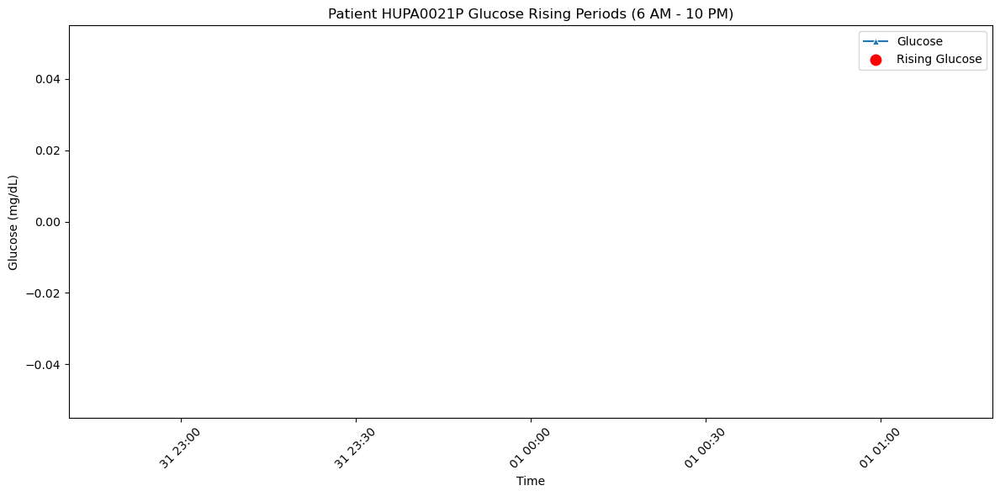

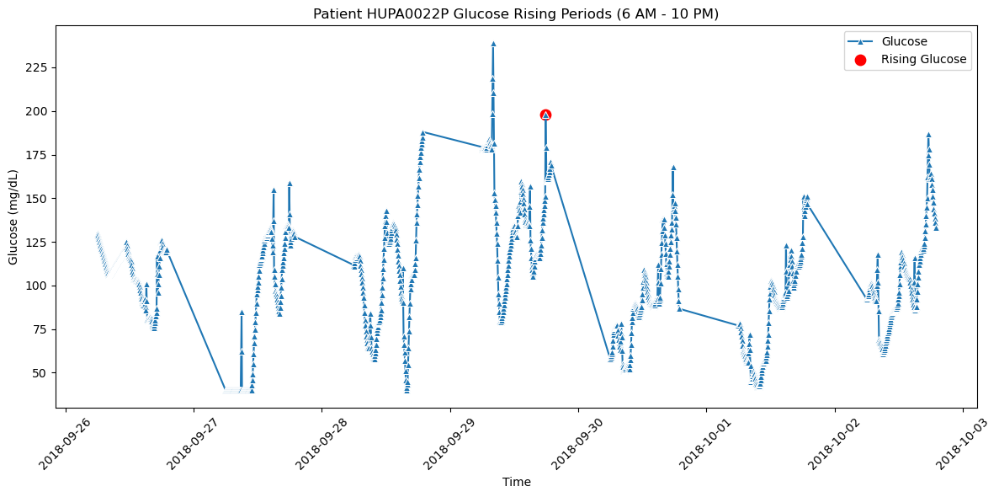

                     time  glucose  carb_input  recommendation
27156 2018-09-29 17:55:00    198.0         0.0  Light activity


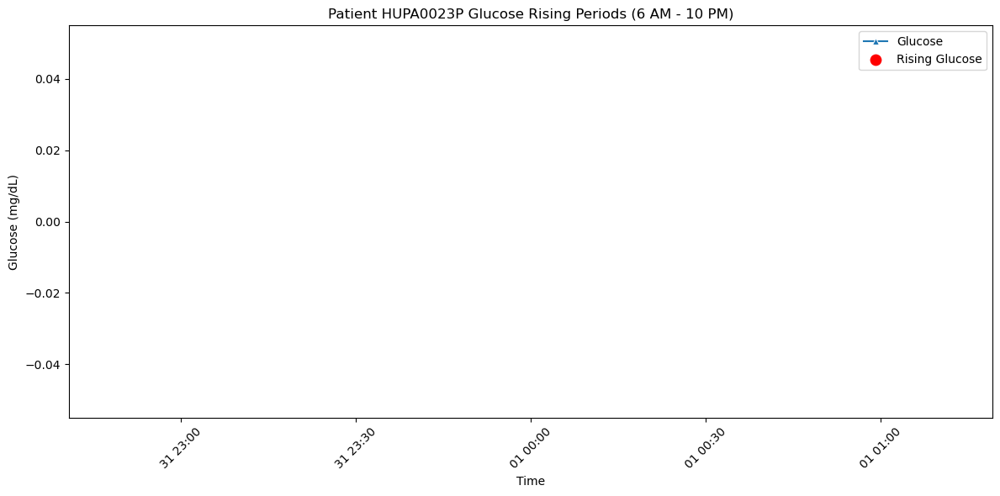

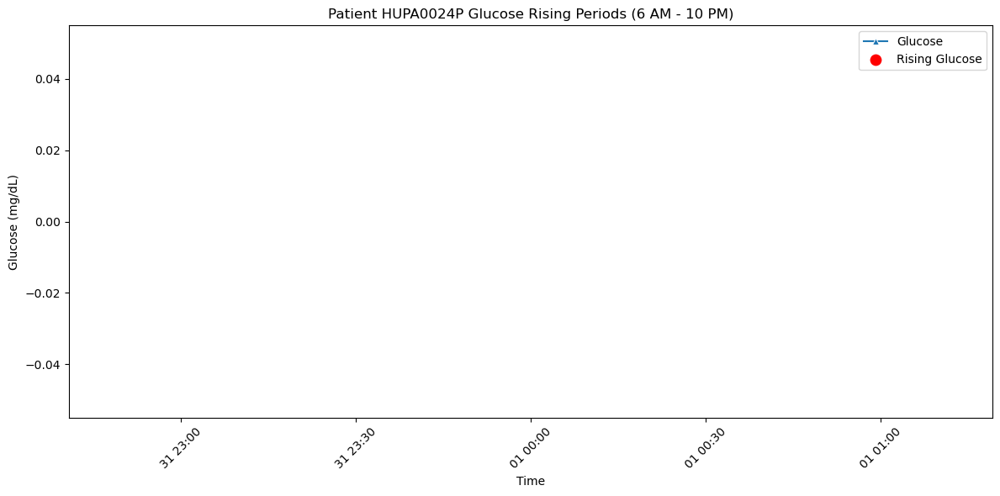

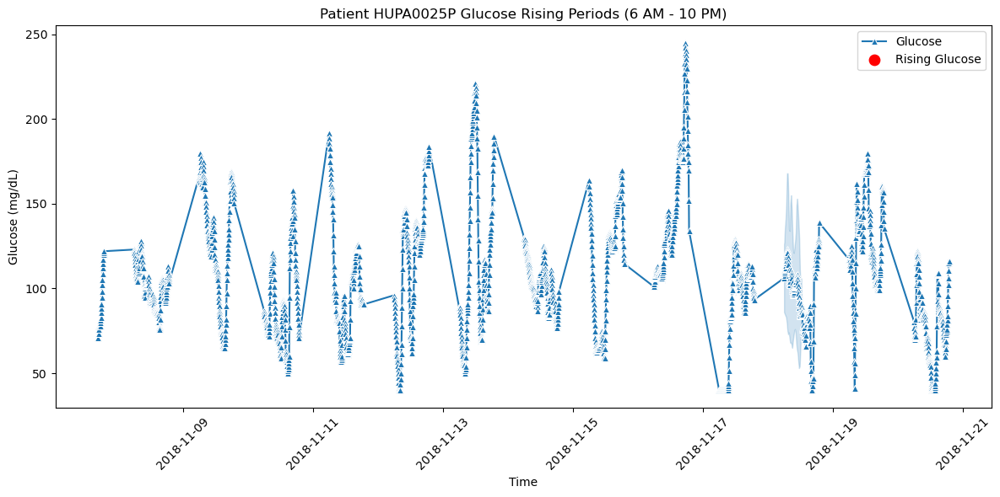

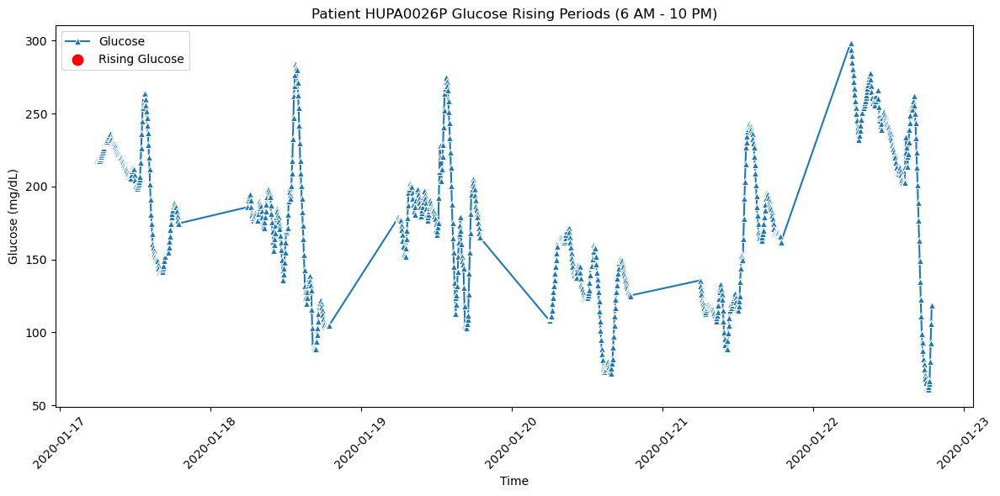

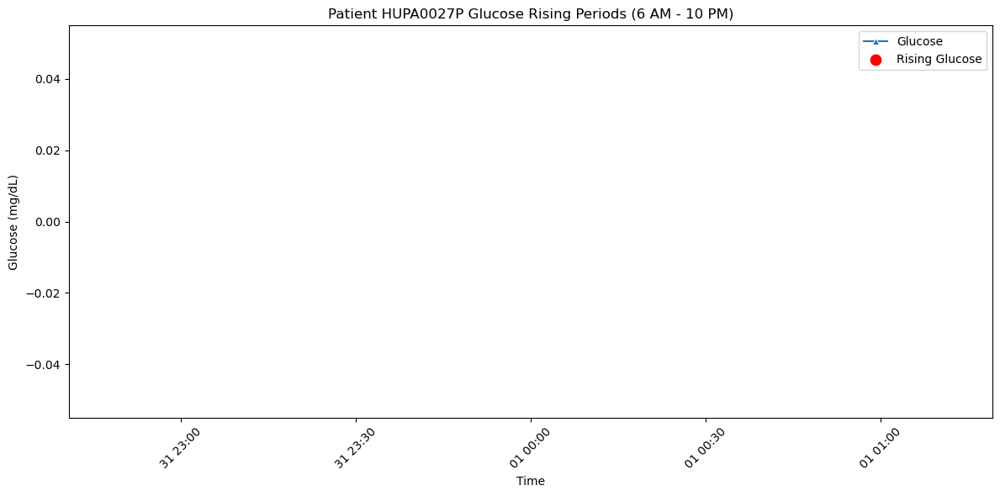

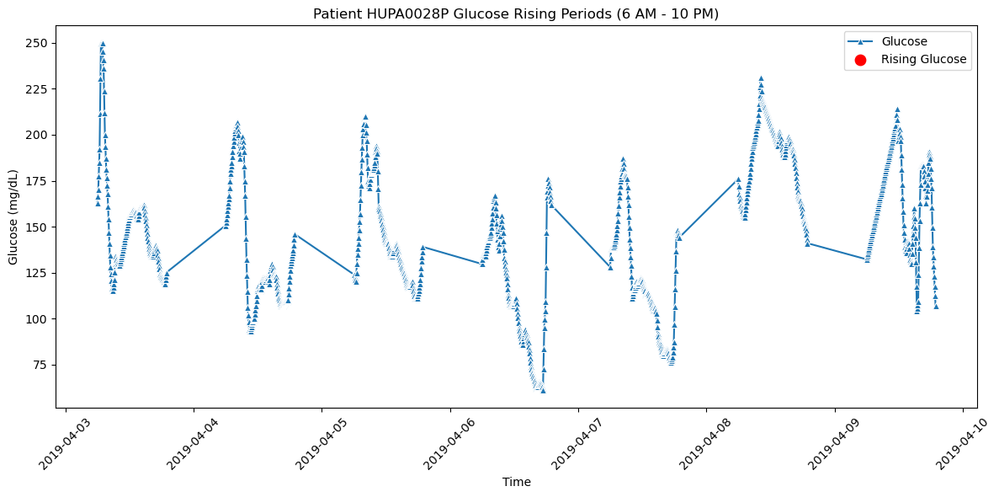

In [511]:
merged_df ['rising_glucose'] = merged_df ['glucose_diff'] > 30

for patid, pat_df in merged_df .groupby('patient_id'):
    pat_df['rising_glucose'] = pat_df['glucose_diff'] > 30
    day_glucose = (pat_df['time'].dt.hour >= 6) & (pat_df['time'].dt.hour <= 18)
    patient_day_df = pat_df[day_glucose]
    rising_glucose_df = patient_day_df[patient_day_df['rising_glucose']]

    plt.figure(figsize=(12,6))

    sns.lineplot(x='time', y='glucose', data=patient_day_df, marker='^', label='Glucose')

    plt.scatter(rising_glucose_df['time'], rising_glucose_df['glucose'], 
                color='red', s=80, label='Rising Glucose')

    plt.title(f"Patient {patid} Glucose Rising Periods (6 AM - 10 PM)")
    plt.xlabel("Time")
    plt.ylabel("Glucose (mg/dL)")
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

    if (pat_df['glucose_diff'] > 30).any():
        interventions = rising_glucose_df[['time','glucose','carb_input']].copy()
        interventions['recommendation'] = interventions['carb_input'].apply(
            lambda x: "Adjust insulin" if x > 0 else "Light activity"
        )
        print(interventions.head(10))



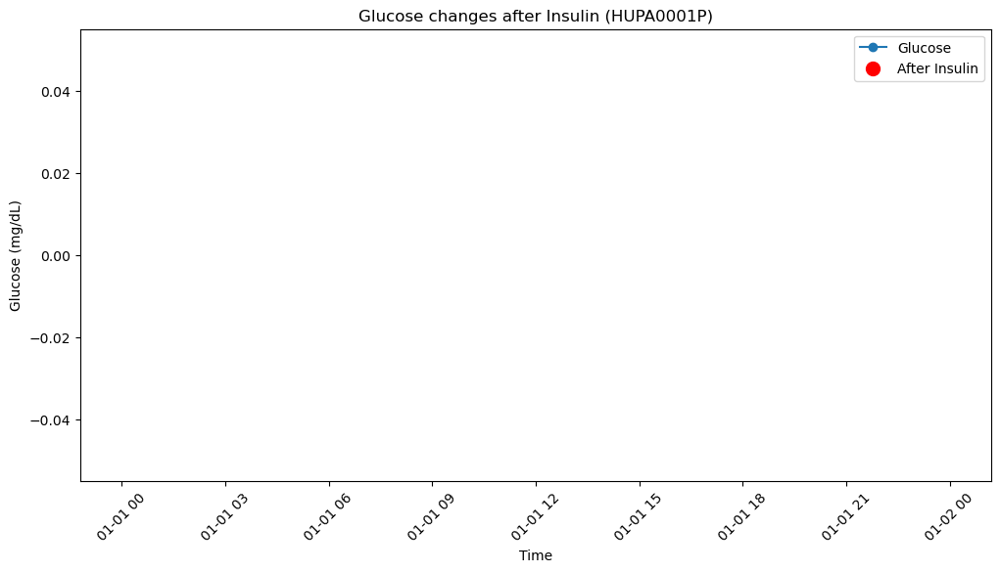

Recommendation for Patient - HUPA0001P
Empty DataFrame
Columns: [time, glucose, glucose_change, effect, recommendation]
Index: []


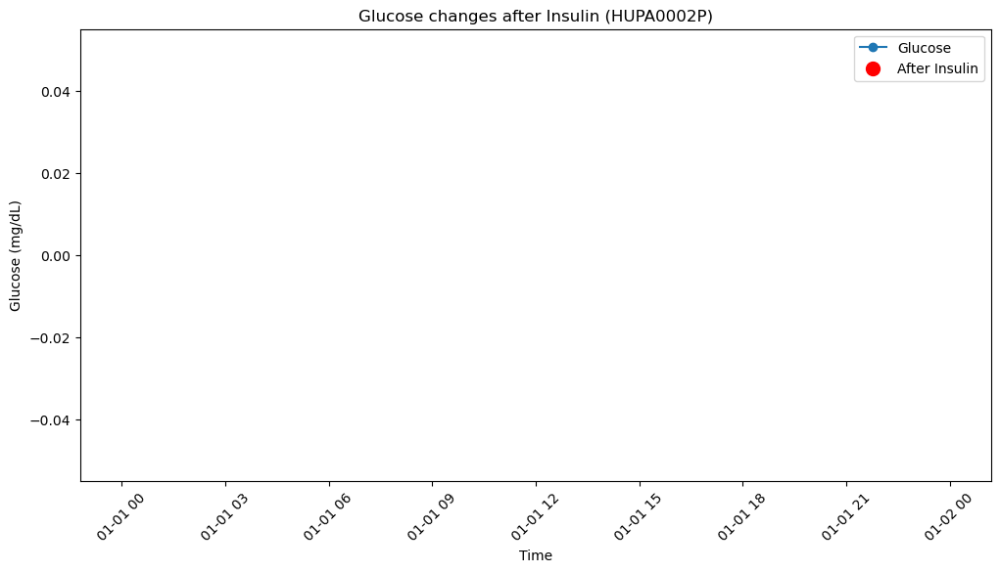

Recommendation for Patient - HUPA0002P
Empty DataFrame
Columns: [time, glucose, glucose_change, effect, recommendation]
Index: []


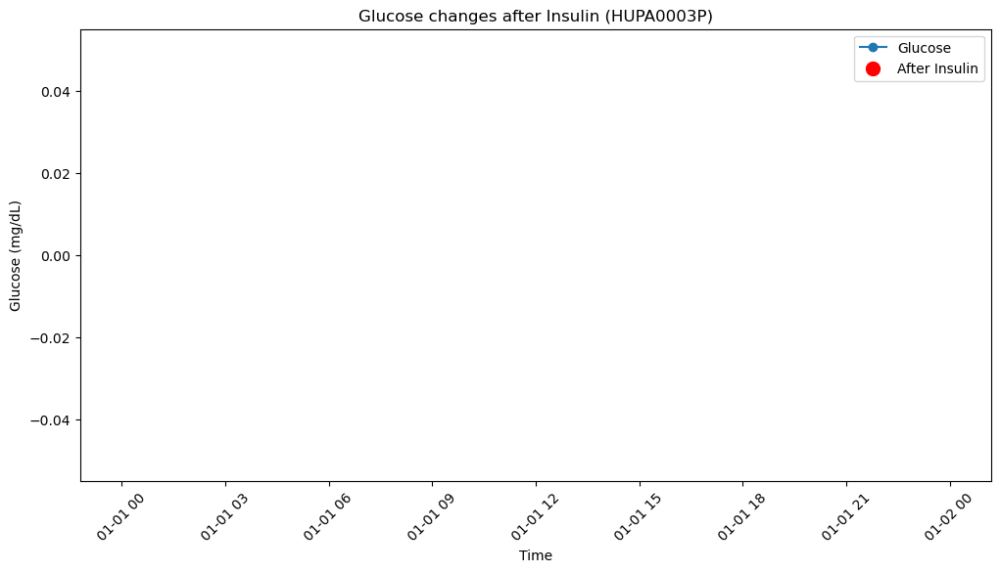

Recommendation for Patient - HUPA0003P
Empty DataFrame
Columns: [time, glucose, glucose_change, effect, recommendation]
Index: []


C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



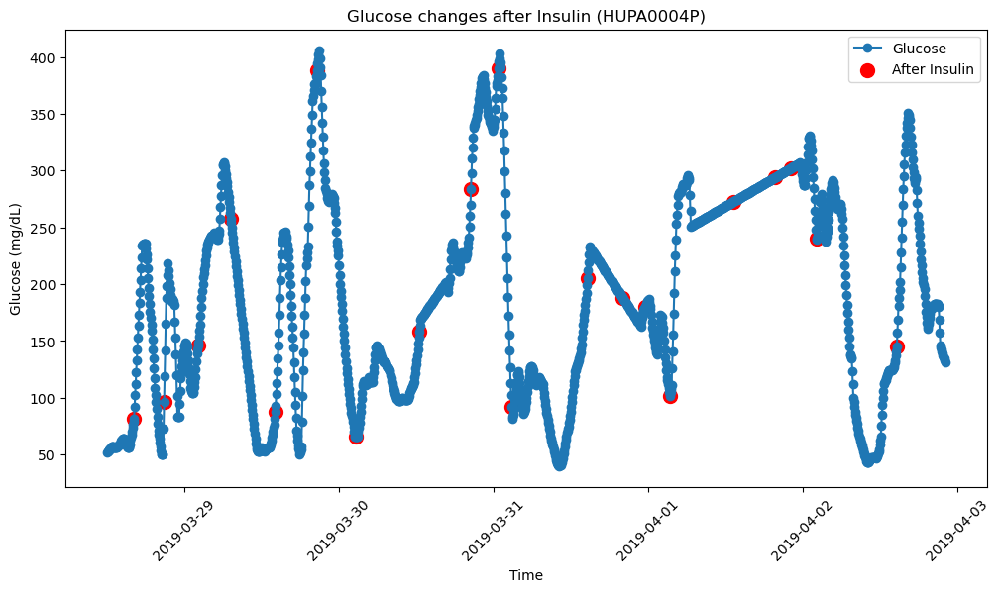

Recommendation for Patient - HUPA0004P
                     time  glucose  glucose_change     effect  \
46369 2019-03-28 16:10:00   82.000          10.133       Rise   
46425 2019-03-28 20:50:00   96.000          23.000       Rise   
46488 2019-03-29 02:05:00  145.667           3.333       Rise   
46549 2019-03-29 07:10:00  258.000          -4.208  Mild Drop   
46632 2019-03-29 14:05:00   87.333           5.667       Rise   
46710 2019-03-29 20:35:00  388.333           5.667       Rise   
46783 2019-03-30 02:40:00   66.000           0.000     Stable   
46901 2019-03-30 12:30:00  158.333           5.334       Rise   
46997 2019-03-30 20:30:00  283.667          13.666       Rise   
47048 2019-03-31 00:45:00  389.667           6.666       Rise   
47073 2019-03-31 02:50:00   92.333         -10.333  Mild Drop   
47214 2019-03-31 14:35:00  205.667           6.833       Rise   
47280 2019-03-31 20:05:00  187.792          -0.730  Mild Drop   
47322 2019-03-31 23:35:00  180.333           0.667 

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



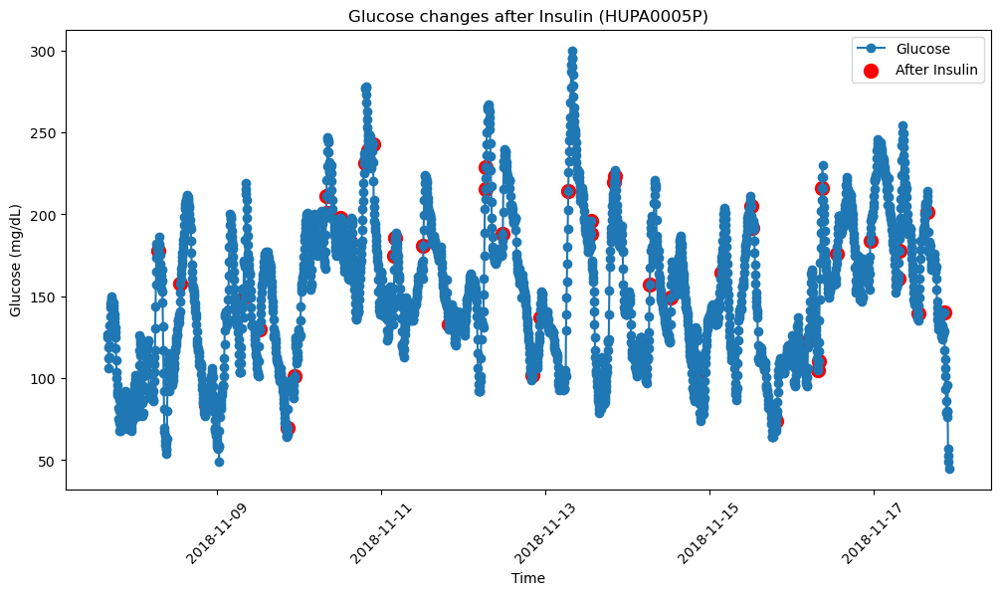

Recommendation for Patient - HUPA0005P
                     time  glucose  glucose_change     effect  \
31076 2018-11-07 20:15:00   89.000          -0.333  Mild Drop   
31200 2018-11-08 06:35:00  177.667          -1.334  Mild Drop   
31280 2018-11-08 13:15:00  158.000           3.000       Rise   
31369 2018-11-08 20:40:00   83.667           2.333       Rise   
31506 2018-11-09 08:05:00  150.000          34.500       Rise   
31558 2018-11-09 12:25:00  129.667           0.333       Rise   
31656 2018-11-09 20:35:00   70.000          11.000       Rise   
31681 2018-11-09 22:40:00  101.000          24.000       Rise   
31791 2018-11-10 07:50:00  201.000          10.000       Rise   
31792 2018-11-10 07:55:00  211.000          10.000       Rise   
31842 2018-11-10 12:05:00  197.667          -0.334  Mild Drop   
31850 2018-11-10 12:45:00  185.000          -6.667  Mild Drop   
31877 2018-11-10 15:00:00  183.000           5.000       Rise   
31927 2018-11-10 19:10:00  231.000          46.000 

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



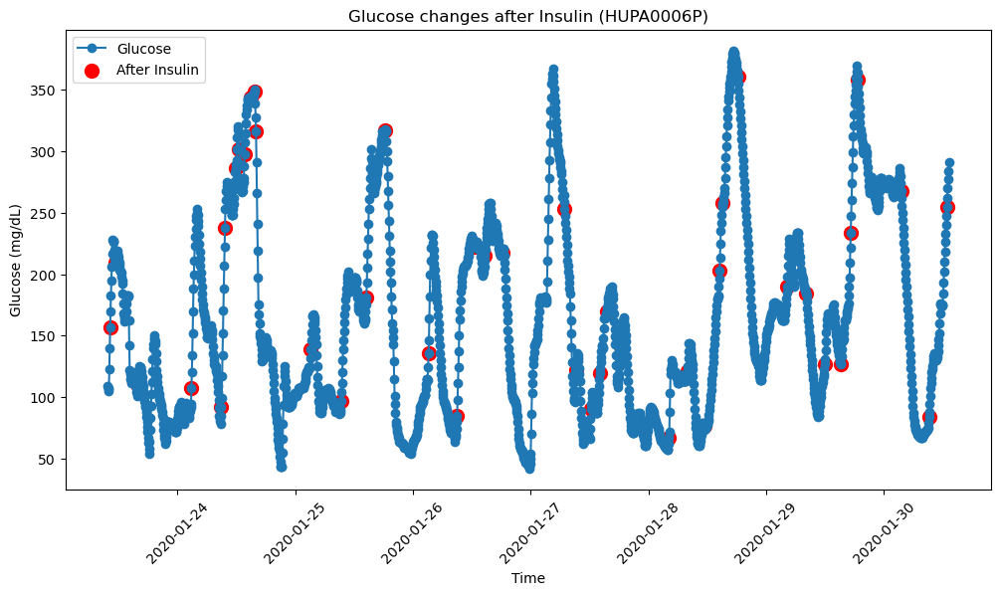

Recommendation for Patient - HUPA0006P
                     time  glucose  glucose_change            effect  \
71520 2020-01-23 10:15:00  157.000          12.667              Rise   
71534 2020-01-23 11:25:00  209.667           1.333              Rise   
71588 2020-01-23 15:55:00  109.000           4.000              Rise   
71719 2020-01-24 02:50:00  107.333          13.334              Rise   
71792 2020-01-24 08:55:00   92.000           7.000              Rise   
71801 2020-01-24 09:40:00  237.667          15.333              Rise   
71827 2020-01-24 11:50:00  286.333           3.334              Rise   
71836 2020-01-24 12:35:00  301.333         -11.666         Mild Drop   
71849 2020-01-24 13:40:00  297.333           9.667              Rise   
71863 2020-01-24 14:50:00  343.667          -0.334         Mild Drop   
71873 2020-01-24 15:40:00  348.333           1.667              Rise   
71877 2020-01-24 16:00:00  316.000         -25.000  Drop (High Risk)   
72011 2020-01-25 03:10:00

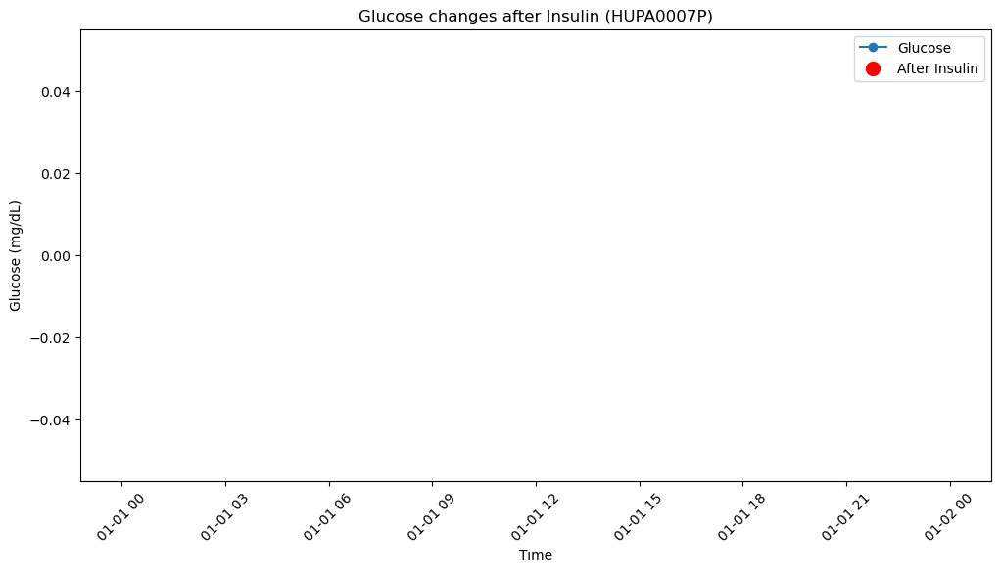

Recommendation for Patient - HUPA0007P
Empty DataFrame
Columns: [time, glucose, glucose_change, effect, recommendation]
Index: []


C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



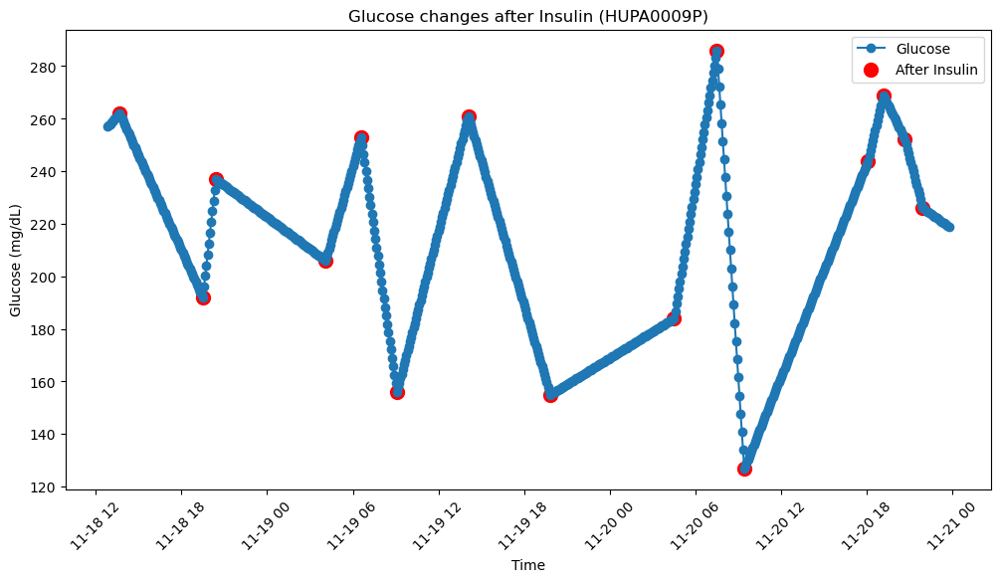

Recommendation for Patient - HUPA0009P
                     time  glucose  glucose_change     effect  \
37994 2018-11-18 13:40:00    262.0          -1.000  Mild Drop   
38064 2018-11-18 19:30:00    192.0           4.091       Rise   
38075 2018-11-18 20:25:00    237.0          -0.337  Mild Drop   
38167 2018-11-19 04:05:00    206.0           1.550       Rise   
38197 2018-11-19 06:35:00    253.0          -3.233  Mild Drop   
38227 2018-11-19 09:05:00    156.0           1.750       Rise   
38287 2018-11-19 14:05:00    261.0          -1.536  Mild Drop   
38356 2018-11-19 19:50:00    155.0           0.279       Rise   
38460 2018-11-20 04:30:00    184.0           2.833       Rise   
38496 2018-11-20 07:30:00    286.0          -6.913  Mild Drop   
38519 2018-11-20 09:25:00    127.0           1.125       Rise   
38623 2018-11-20 18:05:00    244.0           1.923       Rise   
38636 2018-11-20 19:10:00    269.0          -0.944  Mild Drop   
38654 2018-11-20 20:40:00    252.0          -1.733 

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



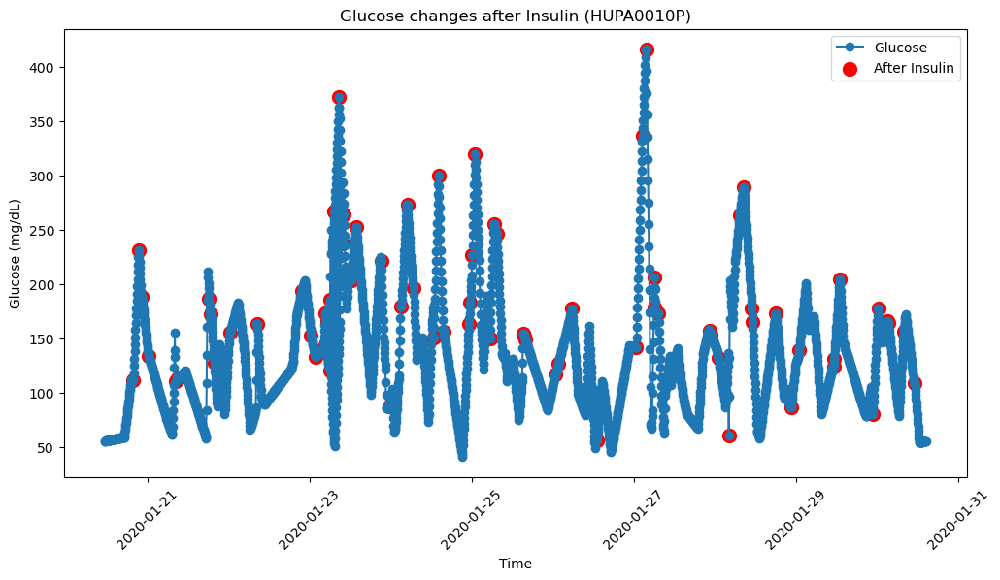

Recommendation for Patient - HUPA0010P
                     time  glucose  glucose_change     effect  \
70772 2020-01-20 19:55:00  111.000           6.667       Rise   
70791 2020-01-20 21:30:00  231.000          -5.375  Mild Drop   
70802 2020-01-20 22:25:00  188.000          -2.333  Mild Drop   
70826 2020-01-21 00:25:00  134.000          -0.921  Mild Drop   
70921 2020-01-21 08:20:00  110.000           0.294       Rise   
...                   ...      ...             ...        ...   
70507 2020-01-30 00:55:00  157.000          -1.100  Mild Drop   
70535 2020-01-30 03:15:00  166.000          -2.256  Mild Drop   
70536 2020-01-30 03:20:00  163.744          -2.257  Mild Drop   
70591 2020-01-30 07:55:00  156.000           2.286       Rise   
70631 2020-01-30 11:15:00  109.000          -3.667  Mild Drop   

                     recommendation  
70772    Adjust insulin timing/dose  
70791  Monitor; dose likely correct  
70802  Monitor; dose likely correct  
70826  Monitor; dose likely 

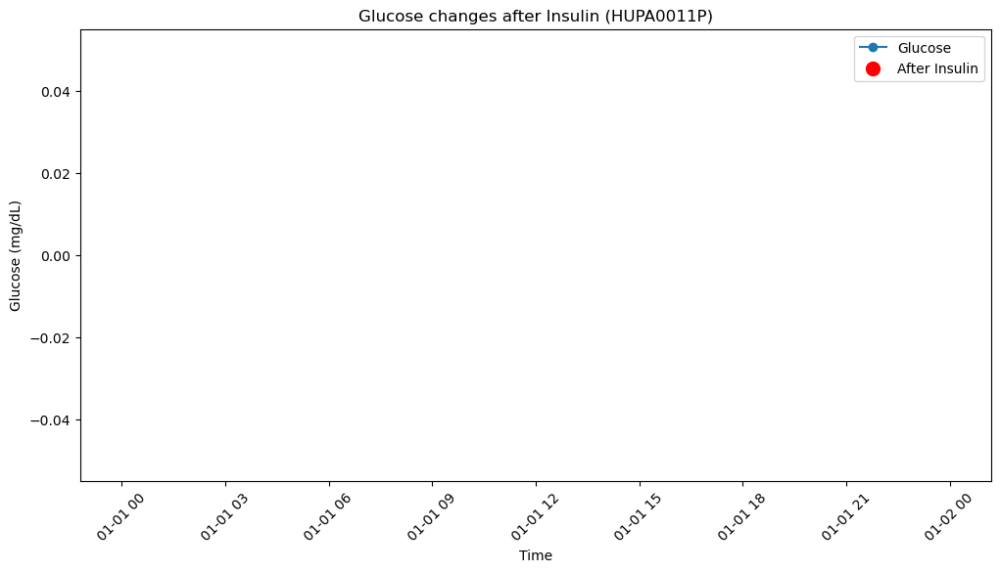

Recommendation for Patient - HUPA0011P
Empty DataFrame
Columns: [time, glucose, glucose_change, effect, recommendation]
Index: []


C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



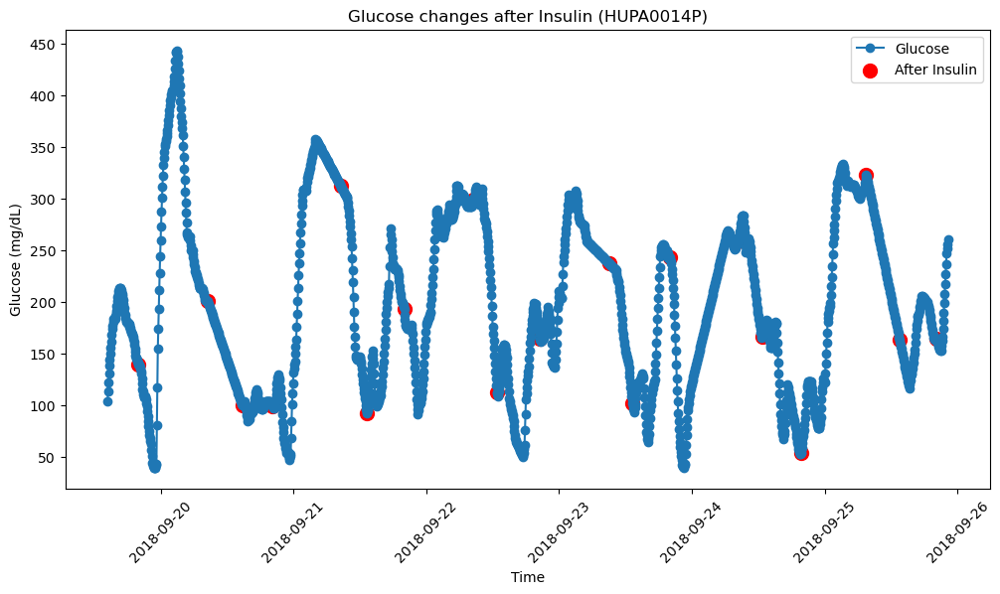

Recommendation for Patient - HUPA0014P
                     time  glucose  glucose_change     effect  \
20446 2018-09-19 20:00:00  140.000          -0.667  Mild Drop   
20596 2018-09-20 08:30:00  201.000          -1.347  Mild Drop   
20671 2018-09-20 14:45:00  100.000           0.333       Rise   
20737 2018-09-20 20:15:00   99.000          -0.667  Mild Drop   
20884 2018-09-21 08:30:00  312.609          -0.841  Mild Drop   
20941 2018-09-21 13:15:00   93.000           1.000       Rise   
21022 2018-09-21 20:00:00  193.000          -5.000  Mild Drop   
21172 2018-09-22 08:30:00  299.000           1.333       Rise   
21223 2018-09-22 12:45:00  113.000          -1.333  Mild Drop   
21316 2018-09-22 20:30:00  165.000          -1.000  Mild Drop   
21466 2018-09-23 09:00:00  237.667          -0.445  Mild Drop   
21517 2018-09-23 13:15:00  102.000          -2.667  Mild Drop   
21598 2018-09-23 20:00:00  243.000          -1.667  Mild Drop   
21745 2018-09-24 08:15:00  259.000           0.667 

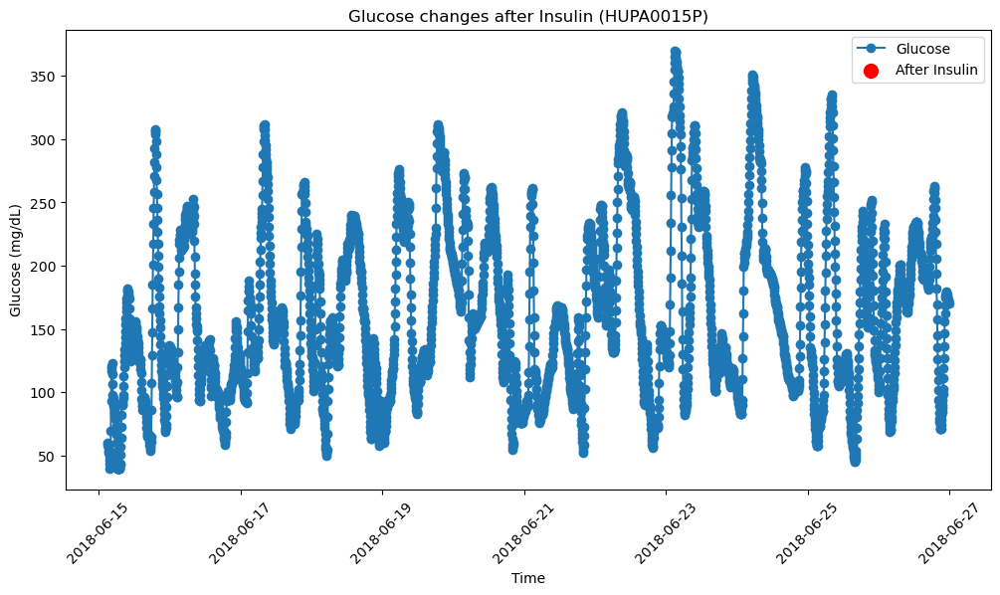

Recommendation for Patient - HUPA0015P
Empty DataFrame
Columns: [time, glucose, glucose_change, effect, recommendation]
Index: []


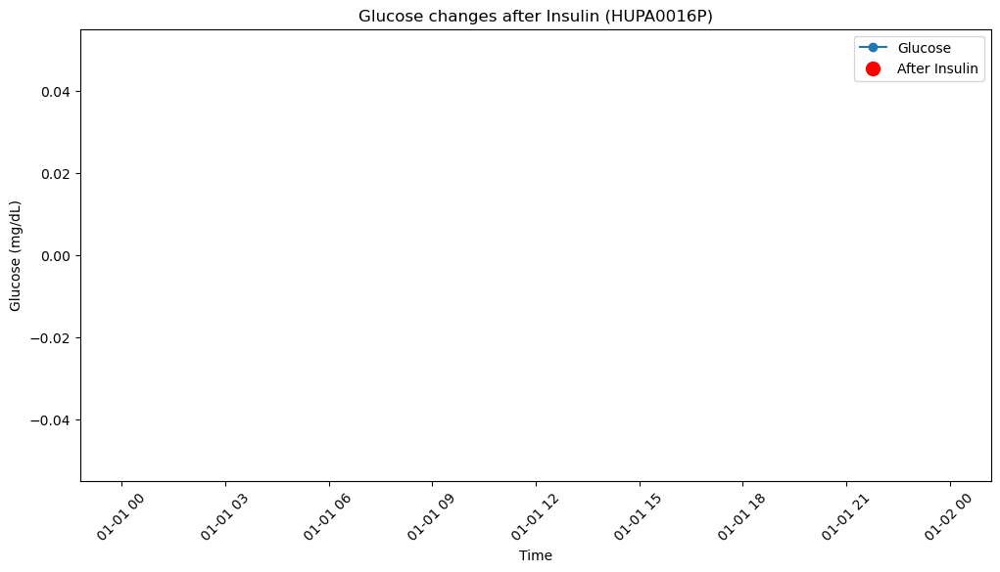

Recommendation for Patient - HUPA0016P
Empty DataFrame
Columns: [time, glucose, glucose_change, effect, recommendation]
Index: []


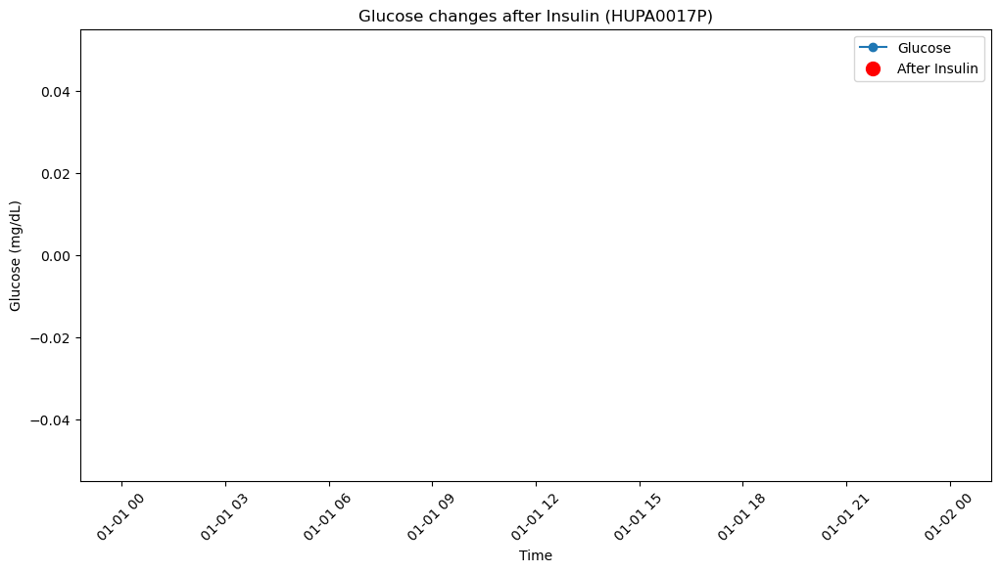

Recommendation for Patient - HUPA0017P
Empty DataFrame
Columns: [time, glucose, glucose_change, effect, recommendation]
Index: []


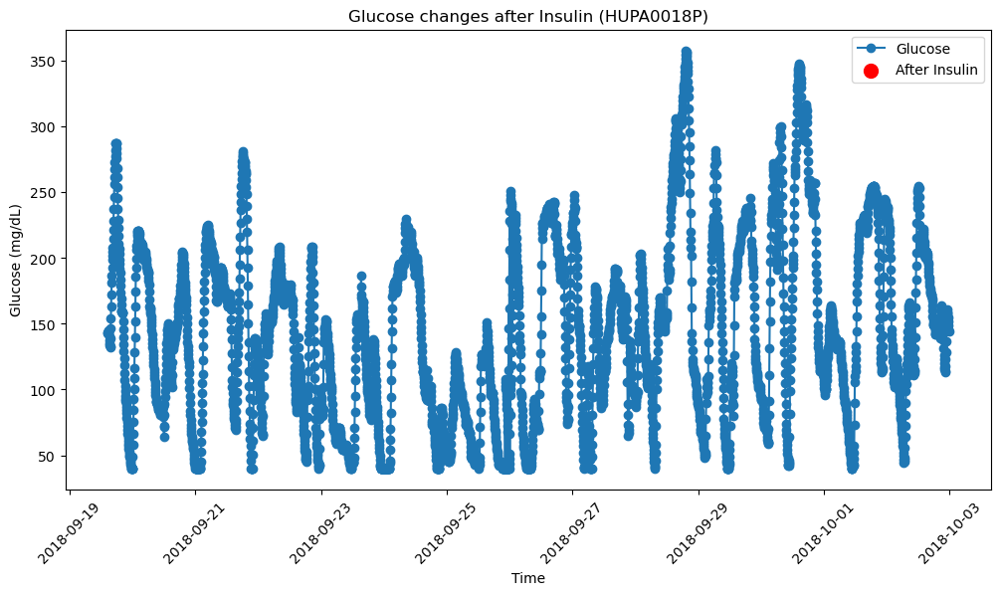

Recommendation for Patient - HUPA0018P
Empty DataFrame
Columns: [time, glucose, glucose_change, effect, recommendation]
Index: []


C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



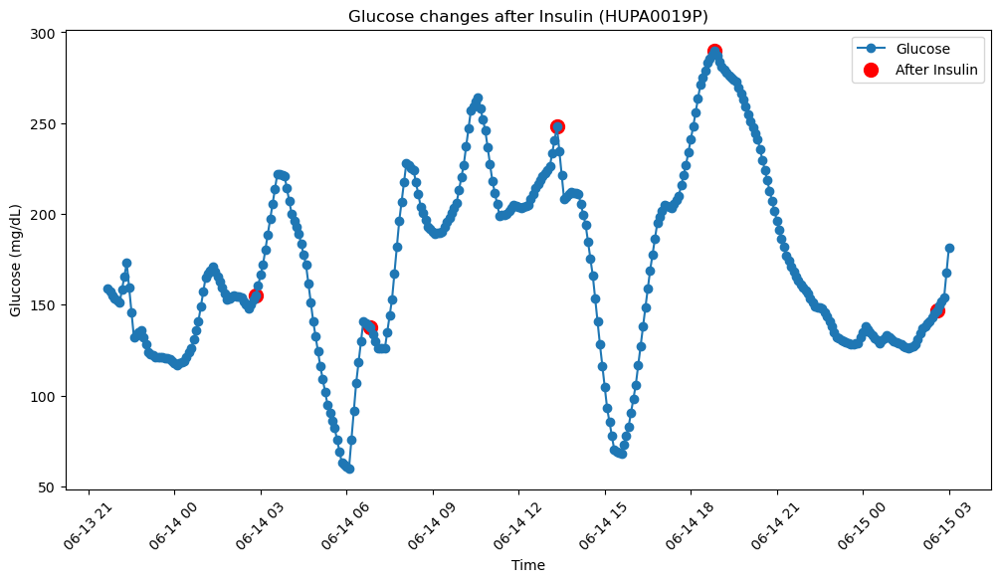

Recommendation for Patient - HUPA0019P
                    time  glucose  glucose_change     effect  \
7339 2018-06-14 02:50:00    155.0           5.667       Rise   
7387 2018-06-14 06:50:00    137.5          -3.833  Mild Drop   
7465 2018-06-14 13:20:00    248.0         -13.333  Mild Drop   
7531 2018-06-14 18:50:00    290.0          -3.000  Mild Drop   
7624 2018-06-15 02:35:00    147.0           2.333       Rise   

                    recommendation  
7339    Adjust insulin timing/dose  
7387  Monitor; dose likely correct  
7465  Monitor; dose likely correct  
7531  Monitor; dose likely correct  
7624    Adjust insulin timing/dose  


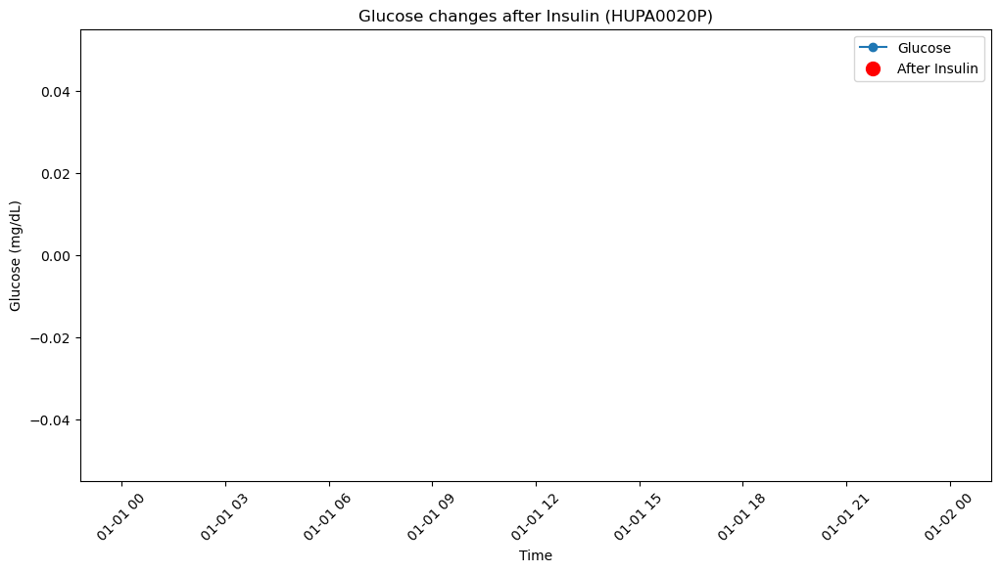

Recommendation for Patient - HUPA0020P
Empty DataFrame
Columns: [time, glucose, glucose_change, effect, recommendation]
Index: []


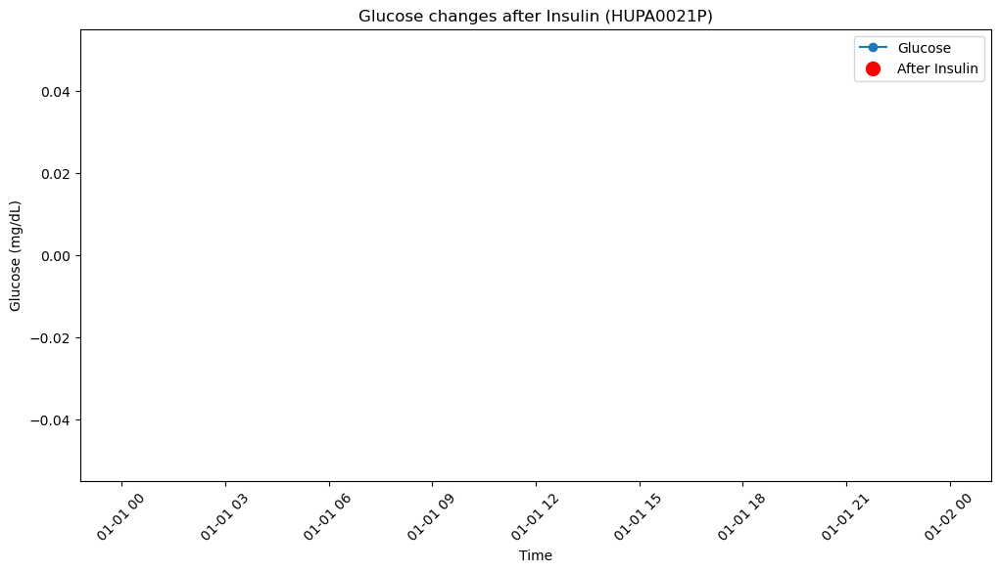

Recommendation for Patient - HUPA0021P
Empty DataFrame
Columns: [time, glucose, glucose_change, effect, recommendation]
Index: []


C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



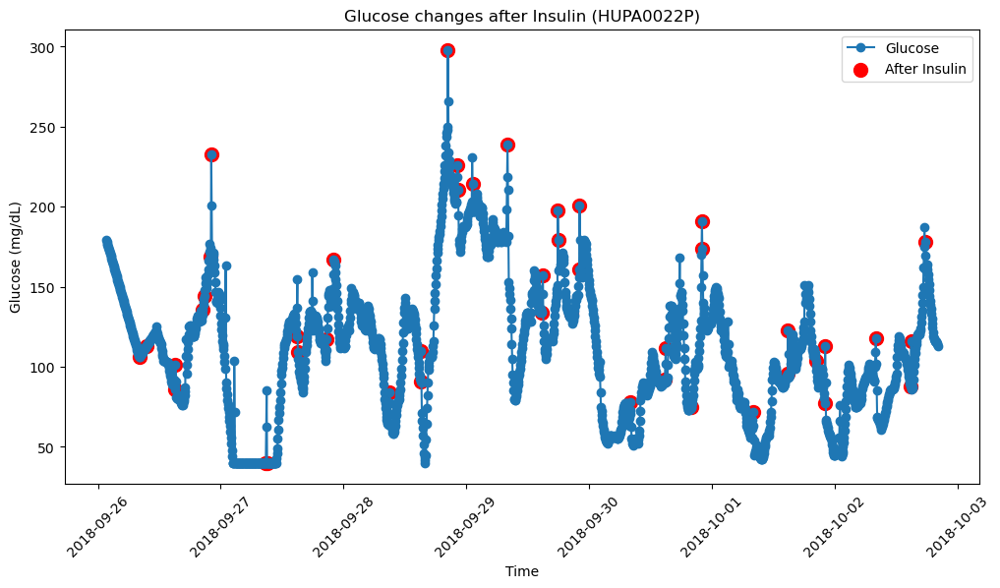

Recommendation for Patient - HUPA0022P
                     time  glucose  glucose_change            effect  \
26174 2018-09-26 08:05:00  106.000           0.417              Rise   
26191 2018-09-26 09:30:00  113.083           0.417              Rise   
26258 2018-09-26 15:05:00   86.000          15.000              Rise   
26259 2018-09-26 15:10:00  101.000         -10.000         Mild Drop   
26323 2018-09-26 20:30:00  135.667           3.333              Rise   
26327 2018-09-26 20:50:00  144.000           4.000              Rise   
26342 2018-09-26 22:05:00  169.000          64.000              Rise   
26343 2018-09-26 22:10:00  233.000         -32.500  Drop (High Risk)   
26471 2018-09-27 08:50:00   40.000          22.500              Rise   
26474 2018-09-27 09:05:00   40.000           0.000            Stable   
26543 2018-09-27 14:50:00  119.000          18.000              Rise   
26546 2018-09-27 15:05:00  109.000          -4.000         Mild Drop   
26614 2018-09-27 20:45:00

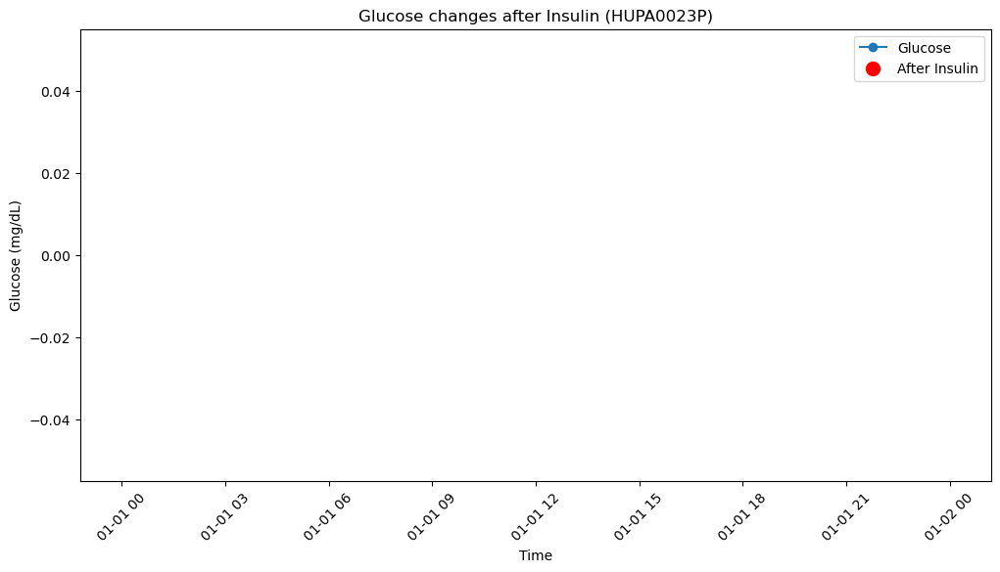

Recommendation for Patient - HUPA0023P
Empty DataFrame
Columns: [time, glucose, glucose_change, effect, recommendation]
Index: []


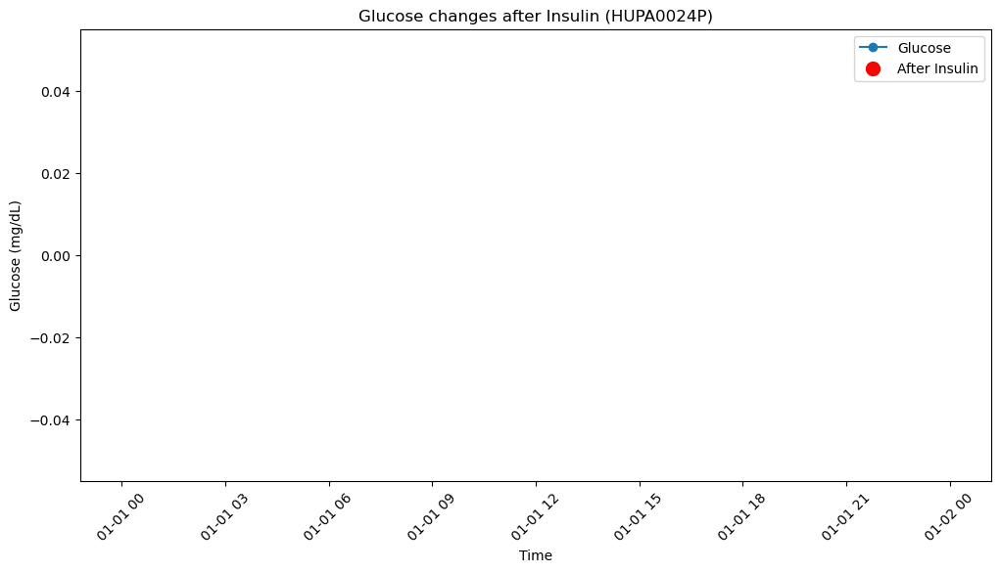

Recommendation for Patient - HUPA0024P
Empty DataFrame
Columns: [time, glucose, glucose_change, effect, recommendation]
Index: []


C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



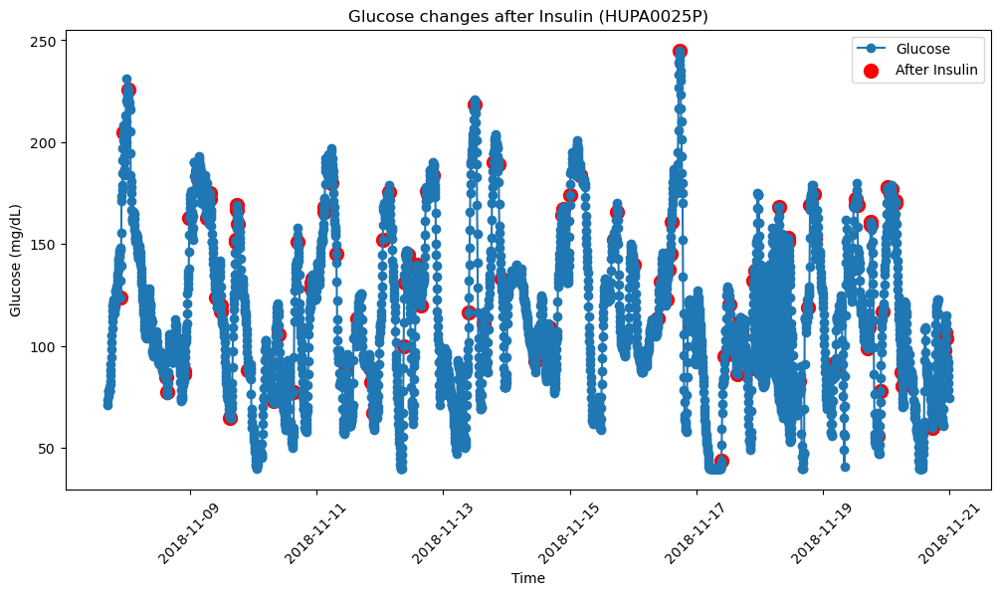

Recommendation for Patient - HUPA0025P
                     time  glucose  glucose_change     effect  \
34923 2018-11-07 21:45:00  124.000          15.667       Rise   
34934 2018-11-07 22:40:00  204.667           3.833       Rise   
34956 2018-11-08 00:30:00  226.000          -1.667  Mild Drop   
35040 2018-11-08 07:30:00  122.000          -4.333  Mild Drop   
35041 2018-11-08 07:35:00  117.667          -4.334  Mild Drop   
...                   ...      ...             ...        ...   
34788 2018-11-20 17:35:00   60.000           4.333       Rise   
34792 2018-11-20 17:55:00   74.000           1.000       Rise   
34842 2018-11-20 22:05:00   98.000           4.333       Rise   
34844 2018-11-20 22:15:00  106.667           4.333       Rise   
34851 2018-11-20 22:50:00  104.000          -4.667  Mild Drop   

                     recommendation  
34923    Adjust insulin timing/dose  
34934    Adjust insulin timing/dose  
34956  Monitor; dose likely correct  
35040  Monitor; dose likely 

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



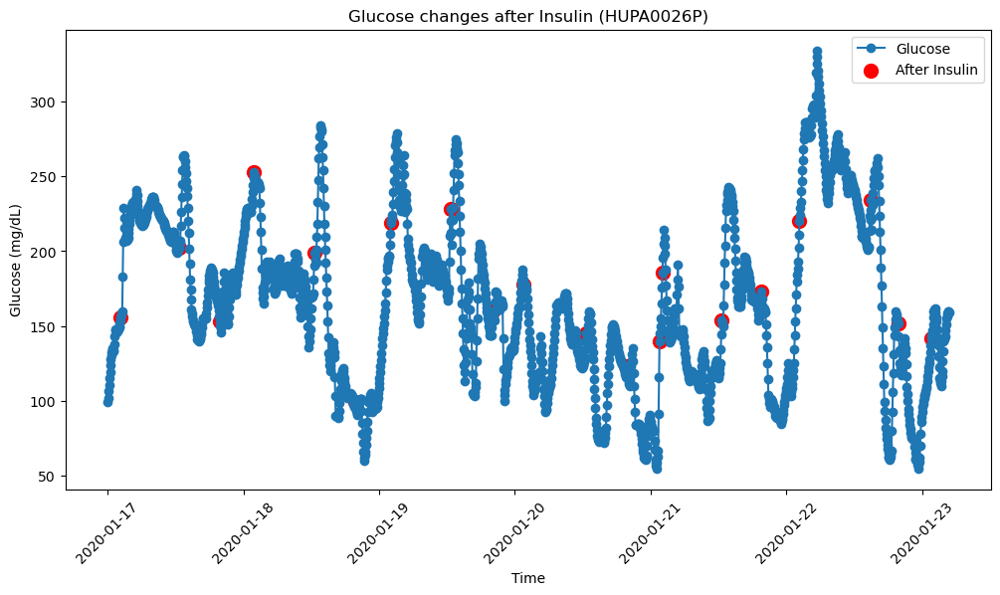

Recommendation for Patient - HUPA0026P
                     time  glucose  glucose_change     effect  \
66780 2020-01-17 02:20:00    156.0           1.333       Rise   
66903 2020-01-17 12:35:00    202.0           1.667       Rise   
66990 2020-01-17 19:50:00    153.0          -2.333  Mild Drop   
67062 2020-01-18 01:50:00    253.0          -1.333  Mild Drop   
67191 2020-01-18 12:35:00    199.0          -2.333  Mild Drop   
67278 2020-01-18 19:50:00     99.0          -2.667  Mild Drop   
67353 2020-01-19 02:05:00    219.0           1.667       Rise   
67479 2020-01-19 12:35:00    228.0          -8.000  Mild Drop   
67569 2020-01-19 20:05:00    160.0          -2.000  Mild Drop   
67635 2020-01-20 01:35:00    178.0           0.000     Stable   
67767 2020-01-20 12:35:00    145.0           0.333       Rise   
67854 2020-01-20 19:50:00    123.0          -3.000  Mild Drop   
67923 2020-01-21 01:35:00    140.0           5.000       Rise   
67929 2020-01-21 02:05:00    186.0           9.333 

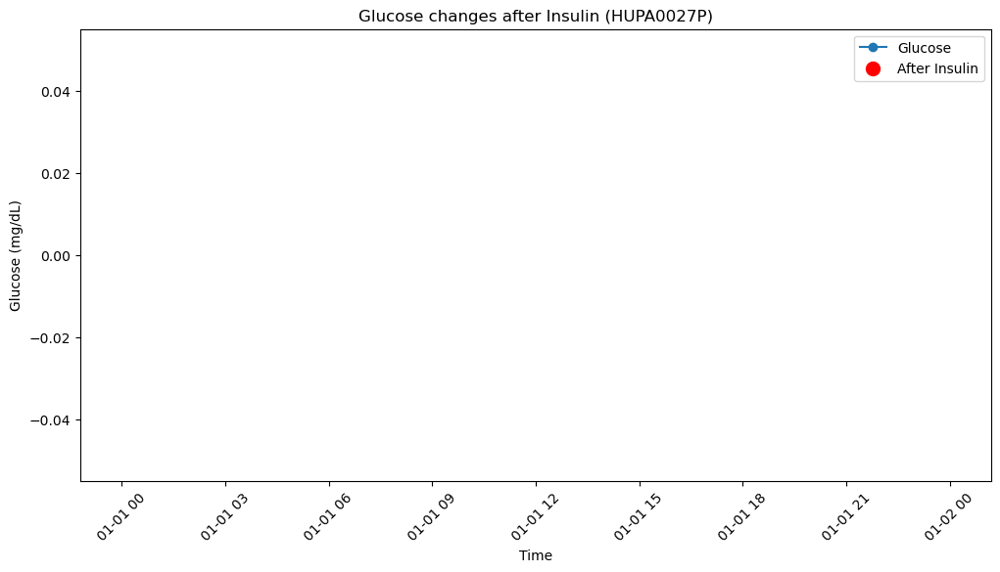

Recommendation for Patient - HUPA0027P
Empty DataFrame
Columns: [time, glucose, glucose_change, effect, recommendation]
Index: []


C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\infan\AppData\Local\Temp\ipykernel_39104\3055363414.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



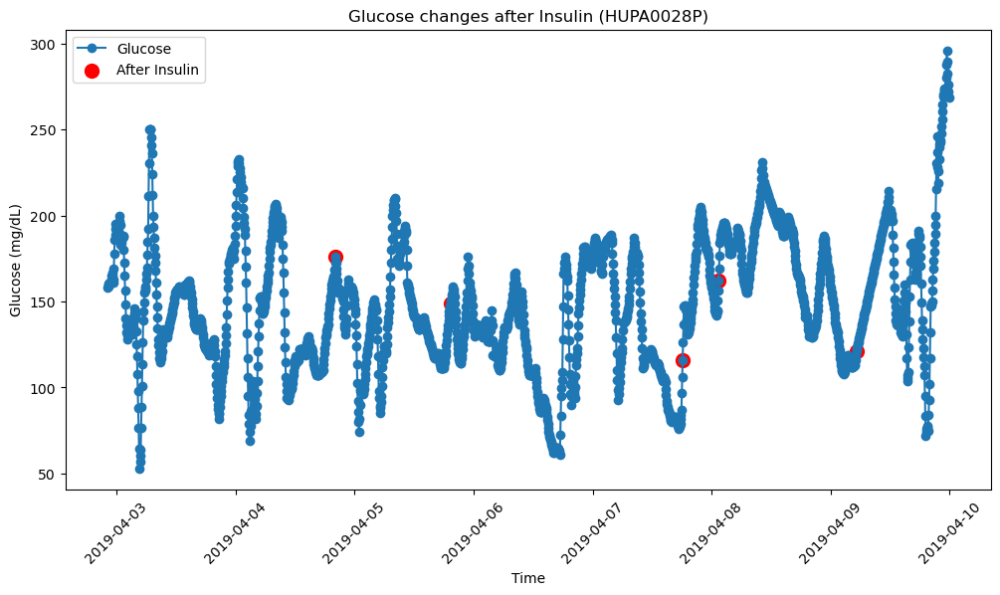

Recommendation for Patient - HUPA0028P
                     time  glucose  glucose_change     effect  \
48433 2019-04-04 20:10:00    176.0          -3.333  Mild Drop   
48712 2019-04-05 19:25:00    149.0           1.667       Rise   
49273 2019-04-07 18:10:00    116.0          10.333       Rise   
49360 2019-04-08 01:25:00    162.0           7.333       Rise   
49693 2019-04-09 05:10:00    121.0           1.120       Rise   

                     recommendation  
48433  Monitor; dose likely correct  
48712    Adjust insulin timing/dose  
49273    Adjust insulin timing/dose  
49360    Adjust insulin timing/dose  
49693    Adjust insulin timing/dose  


In [516]:
# Sort by time
merged_df  = merged_df .sort_values(['time'])

# Shift columns to look at the next reading
for patid, pat_df in merged_df .groupby('patient_id'):
    pat_df['glucose_next'] = pat_df['glucose'].shift(-1)
    pat_df['time_next'] = pat_df['time'].shift(-1)

    # Calculate time difference in minutes
    pat_df['time_diff'] = (pat_df['time_next'] - pat_df['time']).dt.total_seconds() / 60

    # Calculate glucose change
    pat_df['glucose_change'] = pat_df['glucose_next'] - pat_df['glucose']

    # Only keep rows where insulin was given
    insulin_events = pat_df[(pat_df['bolus_volume_delivered'] > 0) &
                                (pat_df['time_diff'] <= 30)]

    # Classify changes

    effects = []
    for change in insulin_events['glucose_change']:
        if change <= -20:
            effects.append("Drop (High Risk)")
        elif change < 0:
            effects.append("Mild Drop")
        elif change > 0:
            effects.append("Rise")
        else:
            effects.append("Stable")

    insulin_events['effect'] = effects

    # Recommendation
    def recommend(effect):
        if "High Risk" in effect:
            return "Reduce insulin dose or add carb snack"
        elif effect == "Mild Drop":
            return "Monitor; dose likely correct"
        elif effect == "Rise":
            return "Adjust insulin timing/dose"
        else:
            return "Maintain current regimen"

    insulin_events['recommendation'] = insulin_events['effect'].apply(recommend)

    # Plot glucose trend
    plt.figure(figsize=(12,6))
    plt.plot(pat_df['time'], pat_df['glucose'], marker='o', label="Glucose")

    # Highlight insulin event points
    plt.scatter(insulin_events['time'], insulin_events['glucose'], color="red", s=100, label="After Insulin")

    plt.title(f"Glucose changes after Insulin ({patid})")
    plt.xlabel("Time")
    plt.ylabel("Glucose (mg/dL)")
    plt.xticks(rotation=45)
    plt.legend()
    plt.show()

    # Show results
    print(f'Recommendation for Patient - {patid}')
    print(insulin_events[['time','glucose','glucose_change','effect','recommendation']])
